In [1]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

from sklearn.preprocessing import StandardScaler
import shap
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [143]:
train = pd.read_csv('./data/pp_train_v03.csv', encoding='utf-8')
test = pd.read_csv('./data/pp_test_v03.csv', encoding='utf-8')
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204000 entries, 0 to 203999
Data columns (total 38 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   building_number       204000 non-null  int64  
 1   date_time             204000 non-null  object 
 2   temperature           204000 non-null  float64
 3   windspeed             204000 non-null  float64
 4   humidity              204000 non-null  float64
 5   power_consumption     204000 non-null  float64
 6   building_type         204000 non-null  object 
 7   total_area            204000 non-null  float64
 8   cooling_area          204000 non-null  float64
 9   solar_power_capacity  204000 non-null  float64
 10  ess_capacity          204000 non-null  float64
 11  pcs_capacity          204000 non-null  float64
 12  hour                  204000 non-null  int64  
 13  day                   204000 non-null  int64  
 14  month                 204000 non-null  int64  
 15  

In [144]:
# # feature selection 기준 하위 10개 feature

train = train.drop(['temperature_1','temperature_2','humidity_1','humidity_2',
                'humidity_3','windspeed_1','windspeed_2','windspeed_3','discomfort_1',
                'discomfort_2'], axis=1)
test = test.drop(['temperature_1','temperature_2','humidity_1','humidity_2',
                'humidity_3','windspeed_1','windspeed_2','windspeed_3','discomfort_1',
                'discomfort_2'], axis=1)
# train.info()

In [95]:
train.describe()

,building_number,temperature,windspeed,humidity,power_consumption,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity,...,weekday,discomfort,temperature_3,discomfort_3,ma_dis_3,ma_dis_5,CDH,temperature_mean,discomfort_mean,CDH_mean
count,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,2.040000e+05,2.040000e+05,204000.000000,204000.000000,204000.000000,...,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000
mean,50.500000,25.543524,2.134052,78.716518,2451.036462,2.608875e+05,1.864032e+05,35.678400,86.561000,31.000000,...,2.988235,75.419692,0.007699,0.013515,75.415600,75.410946,-5.418965,25.543524,75.419692,-5.418965
std,28.866141,3.779523,1.358146,15.080496,2440.648858,1.273550e+06,1.085174e+06,89.696667,431.217345,146.079104,...,1.991127,5.460597,2.009664,2.227984,5.422127,5.366819,39.345829,1.305998,1.827660,15.630382
min,1.000000,10.100000,0.000000,13.000000,0.000000,5.578400e+03,0.000000e+00,0.000000,0.000000,0.000000,...,0.000000,50.481070,-10.900000,-10.146810,51.276703,51.735894,-168.400000,21.520833,69.574452,-55.868056
25%,25.750000,23.400000,1.200000,69.000000,1085.760000,6.144612e+04,2.318700e+04,0.000000,0.000000,0.000000,...,1.000000,72.551720,-1.200000,-1.385295,72.572380,72.620498,-27.400000,24.647222,74.170040,-16.604167
50%,50.500000,25.700000,2.000000,81.000000,1766.400000,9.264050e+04,5.582336e+04,0.000000,0.000000,0.000000,...,3.000000,76.268500,-0.200000,-0.290440,76.291660,76.306130,-1.200000,25.463889,75.071408,-6.952778
75%,75.250000,28.100000,2.800000,91.000000,2970.000000,1.848135e+05,9.915097e+04,31.250000,0.000000,0.000000,...,5.000000,79.366630,1.200000,1.260000,79.339183,79.304482,22.200000,26.373611,76.653846,3.304167
max,100.000000,37.100000,13.300000,100.000000,25488.400000,1.287288e+07,1.094194e+07,621.000000,3100.000000,1000.000000,...,6.000000,87.789790,9.800000,13.100210,87.330393,87.210598,100.300000,30.414583,81.662243,50.989583


In [96]:
train['building_type'].value_counts()

Other Buildings                30600
Public                         16320
University                     16320
Department Store and Outlet    16320
Hospital                       16320
Commercial                     16320
Apartment                      16320
Research Institute             16320
Knowledge Industry Center      16320
Discount Mart                  16320
Hotel and Resort               16320
Data Center                    10200
Name: building_type, dtype: int64

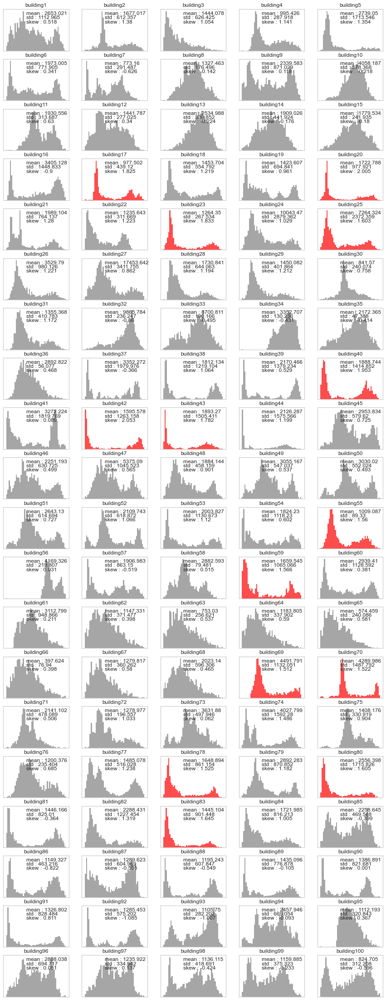

In [21]:
fig = plt.figure(figsize = (15, 40))
for num in range(1,101):
    ax = plt.subplot(20, 5, num)
    energy = train.loc[train['building_number'] == num, 'power_consumption'].values
    mean = energy.mean().round(3)
    std = energy.std().round(3)
    skew = (3*(mean - np.median(energy))/energy.std()).round(3)
    if skew >= 1.5:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'red')
    elif skew <= -1.5:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'blue')
    else:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'gray')
    plt.title(f'building{num}')
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.text(0.35, 0.9, f'mean : {mean}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.35, 0.8, f'std : {std}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.35, 0.7, f'skew : {skew}',  ha='left', va='center', transform=ax.transAxes)

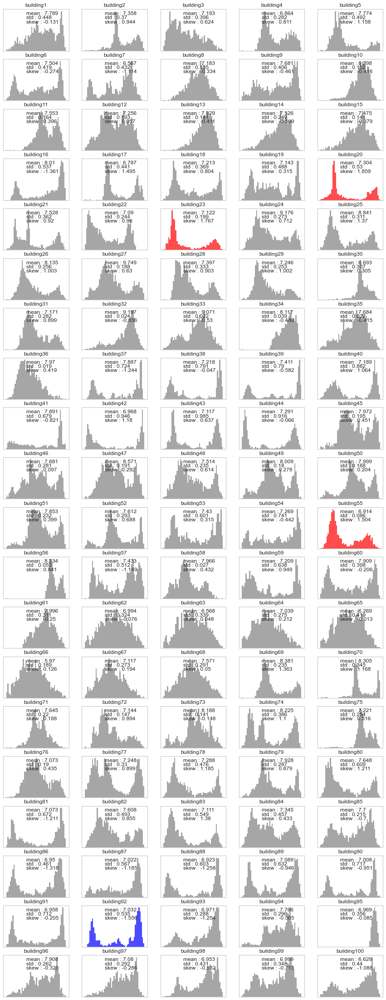

In [22]:
fig = plt.figure(figsize = (15, 40))
for num in range(1,101):
    ax = plt.subplot(20, 5, num)
    energy = np.log(1+train.loc[train['building_number'] == num, 'power_consumption'].values)
    mean = energy.mean().round(3)
    std = energy.std().round(3)
    skew = (3*(mean - np.median(energy))/energy.std()).round(3)
    if skew >= 1.5:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'red')
    elif skew <= -1.5:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'blue')
    else:
        plt.hist(energy, alpha = 0.7, bins = 50, color = 'gray')
    plt.title(f'building{num}')
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.text(0.35, 0.9, f'mean : {mean}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.35, 0.8, f'std : {std}',  ha='left', va='center', transform=ax.transAxes)
    plt.text(0.35, 0.7, f'skew : {skew}',  ha='left', va='center', transform=ax.transAxes)

# 모델링 시에 target을 로그변환한 값으로 학습을 하고, 추론 시에는 모델 예측값에 exponential을 적용

In [39]:
train.km_cluster.value_counts()/2040

1    61.0
3    24.0
2    11.0
0     4.0
Name: km_cluster, dtype: float64

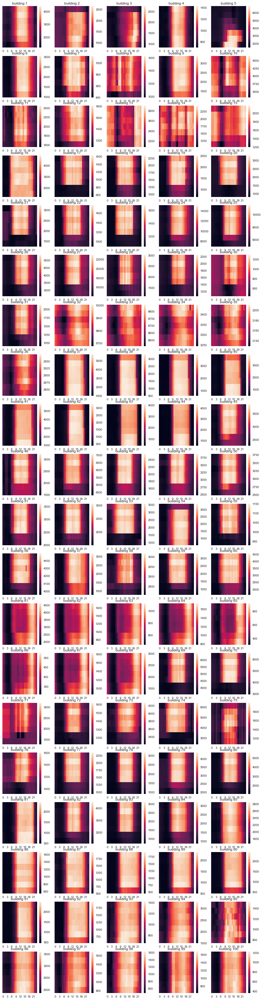

In [24]:
fig = plt.figure(figsize = (15, 60))
for num in train['building_number'].unique():
    df = train[train['building_number'] == num]
    df = df.groupby(['weekday', 'hour'])['power_consumption'].mean().reset_index().pivot('weekday', 'hour', 'power_consumption')
    plt.subplot(20, 5, num)
    sns.heatmap(df)
    plt.title(f'building {num}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])

1. 건물별 주요 패턴
- 평일 주말 상관없이 낮에만 전력사용량이 높은 건물
- 평일 낮에만 전력사용량이 높은 건물
- 주중 새벽시간에만 전력사용량이 낮은 건물

2. 특이점
- 건물 5의 경우 주말 낮에만 전력사용량이 높음
- 건물 10, 13은 오전 6시에만 전력사용량 거의 없음
- 건물 56의 경우 목요일 오후 4시에 전력사용량이 급히 낮아짐
- 건물 71은 화요일 10 11 13 14시에 특히 전력사용량 낮음

<AxesSubplot:xlabel='date_time', ylabel='power_consumption'>

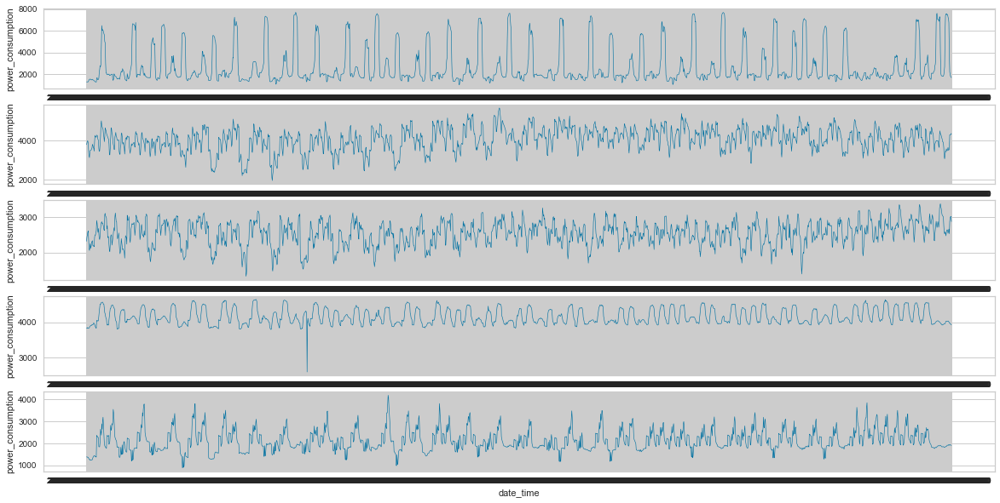

In [57]:
num_5 = train[train.building_number==5]
num_10 = train[train.building_number==10]
num_13 = train[train.building_number==13]
num_56 = train[train.building_number==56]
num_71 = train[train.building_number==71]

fig = plt.figure(figsize = (20, 10))
plt.subplot(511)
sns.lineplot(data = num_5, x = 'date_time', y = 'power_consumption', linewidth = 0.6)
plt.subplot(512)
sns.lineplot(data = num_10, x = 'date_time', y = 'power_consumption', linewidth = 0.6)
plt.subplot(513)
sns.lineplot(data = num_13, x = 'date_time', y = 'power_consumption', linewidth = 0.6)
plt.subplot(514)
sns.lineplot(data = num_56, x = 'date_time', y = 'power_consumption', linewidth = 0.6)
plt.subplot(515)
sns.lineplot(data = num_71, x = 'date_time', y = 'power_consumption', linewidth = 0.6)

In [58]:
print(num_56.loc[num_56.power_consumption<3000, 'date_time'])

112720    2022-06-08 16:00:00
Name: date_time, dtype: object


건물 56에서 발생한 outlier 데이터는 6월 8일 16시 하나로, 주변값의 평균으로 이상치 대체하기로 결정

In [19]:
print(train.iloc[112717,5])
print(train.iloc[112718,5])
print(train.iloc[112719,5])
print(train.iloc[112721,5])
print(train.iloc[112722,5])
print(train.iloc[112723,5])

4324.32
4296.6
4232.16
3997.08
4113.0
3996.0


In [146]:
a = (train.iloc[112717,5]+train.iloc[112718,5] + train.iloc[112719,5] + 
train.iloc[112721,5] + train.iloc[112722,5]+train.iloc[112723,5])/6
train.iloc[112720,5] = a
type(train.iloc[112720,5]), train.iloc[112720,5]

(numpy.float64, 4159.86)

# Clustering building based on median energy usage of each hour and weekday

요일, 시간대에 따른 전력 사용량의 경향성 파악

In [147]:
by_weekday = train.groupby(['building_number','weekday'])['power_consumption'].median().reset_index().pivot('building_number','weekday','power_consumption').reset_index()
by_hour = train.groupby(['building_number','hour'])['power_consumption'].median().reset_index().pivot('building_number','hour','power_consumption').reset_index().drop('building_number', axis = 1)
df = pd.concat([by_weekday, by_hour], axis= 1)
columns = ['building_number'] + ['day'+str(i) for i in range(7)] + ['hour'+str(i) for i in range(24)]
df.columns = columns

In [148]:
for i in range(len(df)):
    # 요일 별 전력 중앙값에 대해 scaling
    df.iloc[i,1:8] = (df.iloc[i,1:8] - df.iloc[i,1:8].mean())/df.iloc[i,1:8].std()
    # 시간대별 전력 중앙값에 대해 scaling
    df.iloc[i,8:] = (df.iloc[i,8:] - df.iloc[i,8:].mean())/df.iloc[i,8:].std()

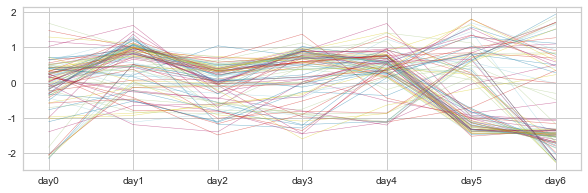

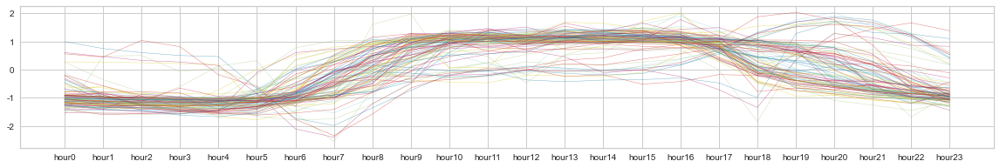

In [64]:
fig = plt.figure(figsize = (10,3))
for i in range(len(df)):
    plt.plot(df.iloc[i, 1:8], alpha = 0.5, linewidth = 0.5)
fig = plt.figure(figsize = (20,3))
for i in range(len(df)):
    plt.plot(df.iloc[i, 8:], alpha = 0.5, linewidth = 0.5)

건물별로 요일, 시간에 따른 전력사용량의 경향성이 보인다.

k-means clustering 알고리즘으로 건물들 군집화 예정

# K-means Clustering

C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are

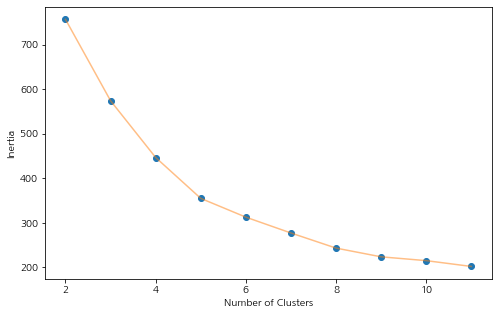

In [7]:
# elbow method를 통해 군집의 개수 결정
def change_n_clusters(n_clusters, data):
    sum_of_squared_distance = []
    for n_cluster in n_clusters:
        kmeans = KMeans(n_clusters=n_cluster)
        kmeans.fit(data)
        sum_of_squared_distance.append(kmeans.inertia_)
        
    plt.figure(1 , figsize = (8, 5))
    plt.plot(n_clusters , sum_of_squared_distance , 'o')
    plt.plot(n_clusters , sum_of_squared_distance , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

change_n_clusters([2,3,4,5,6,7,8,9,10,11],df.iloc[:,1:])

k 결정을 도와주는 KElbowVisualizer 사용

In [73]:
# pip install yellowbrick --user
# pip install scipy --user

Looking in indexes: http://ftp.daumkakao.com/pypi/simple
Note: you may need to restart the kernel to use updated packages.


C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are

KElbowVisualizer(ax=<AxesSubplot:>, estimator=KMeans(n_clusters=9), k=(1, 10))

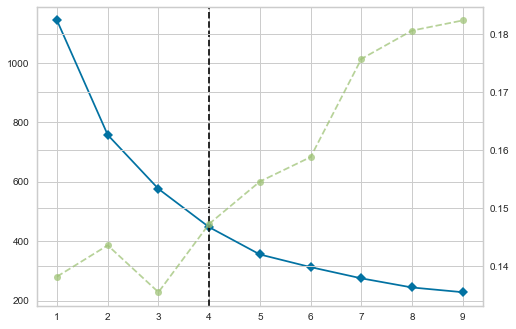

In [8]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,10))
visualizer.fit(df.iloc[:,1:])

최적의 군집 수 k = 4로 결정

In [149]:
kmeans = KMeans(n_clusters=4, random_state = 2)
km_cluster = kmeans.fit_predict(df.iloc[:,1:])

C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\magne\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [150]:
df_clust = df.copy()
df_clust['km_cluster'] = km_cluster
df_clust['km_cluster'] = df_clust['km_cluster'].map({0:1, 1:3, 2:2, 3:0})

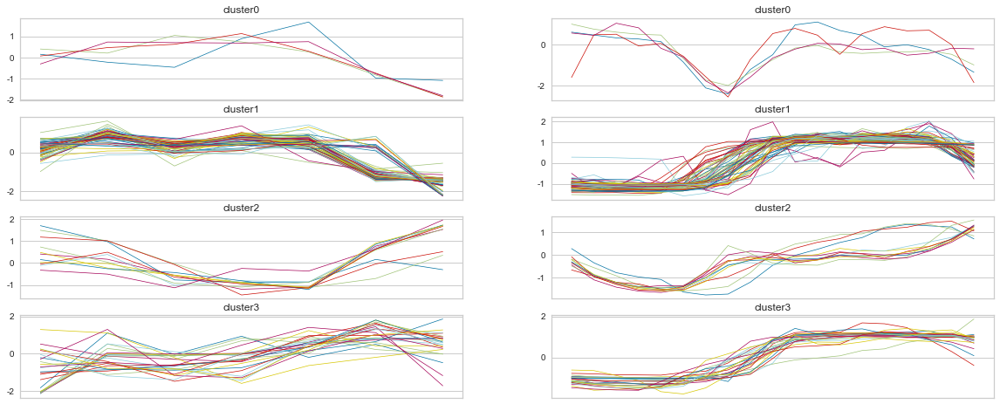

In [27]:
# visualizing result of kmeans clustering
n_c = len(np.unique(df_clust.km_cluster)) 

fig = plt.figure(figsize = (20,8))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7, )
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

좌측:요일별, 우측:0~18시 시간대별

In [151]:
train = train.merge(df_clust[['building_number','km_cluster']], on = 'building_number', how = 'left')
test = test.merge(df_clust[['building_number','km_cluster']], on = 'building_number', how = 'left')

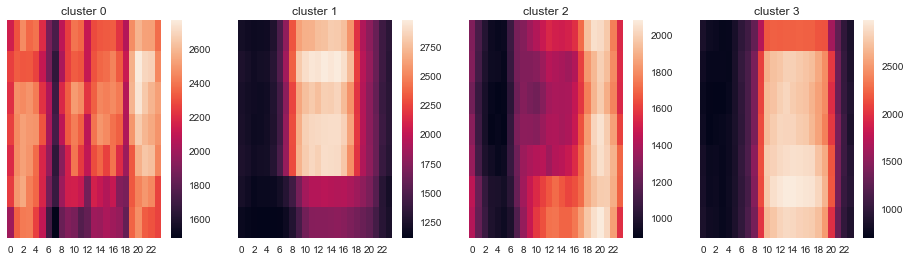

In [30]:
fig = plt.figure(figsize = (20, 4))
for c in range(4):
    temp = train[train.km_cluster == c]
    temp = temp.groupby(['weekday', 'hour'])['power_consumption'].median().reset_index().pivot('weekday', 'hour', 'power_consumption')
    plt.subplot(1, 5, c+1)
    sns.heatmap(temp)
    plt.title(f'cluster {c}')
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks([])

- cluster 0 : 출근 전 시간대에 전력소모가 매우 낮고, 밤이 될 수록 전력소모 커짐 
-> no-work(7)

- cluster 1 : 월화제외 주간에 전력소모가 크고, 야간에는 전력소모가 낮음
-> weekday, work-time(8~18)

- cluster 2 : 낮보다 밤에 전력소모가 큼
-> no-work(0~8)

- cluster 3 : 야간과 주간 전력소모 차이는 뚜렷하지만, 평일 주말 관계없이 전력소모가 일정하거나 월화수 소요가 조금 더 높음
-> work-time(9~20)

In [128]:
print(train[train['km_cluster']==0].building_type.value_counts())
print('---------------------------------')
print(train[train['km_cluster']==1].building_type.value_counts())
print('---------------------------------')
print(train[train['km_cluster']==2].building_type.value_counts())
print('---------------------------------')
print(train[train['km_cluster']==3].building_type.value_counts())

Other Buildings    8160
Name: building_type, dtype: int64
---------------------------------
Public                       16320
University                   16320
Hospital                     16320
Research Institute           16320
Other Buildings              14280
Commercial                   14280
Knowledge Industry Center    14280
Discount Mart                14280
Data Center                   2040
Name: building_type, dtype: int64
---------------------------------
Apartment      16320
Data Center     6120
Name: building_type, dtype: int64
---------------------------------
Department Store and Outlet    16320
Hotel and Resort               16320
Other Buildings                 8160
Data Center                     2040
Commercial                      2040
Knowledge Industry Center       2040
Discount Mart                   2040
Name: building_type, dtype: int64


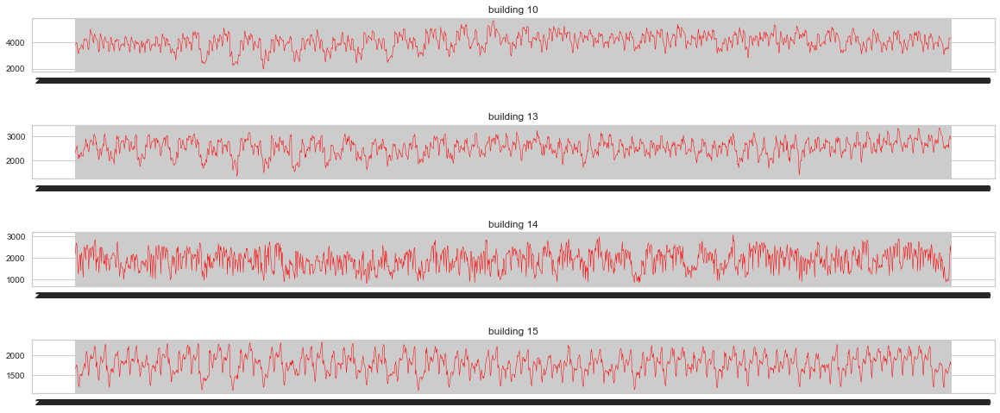

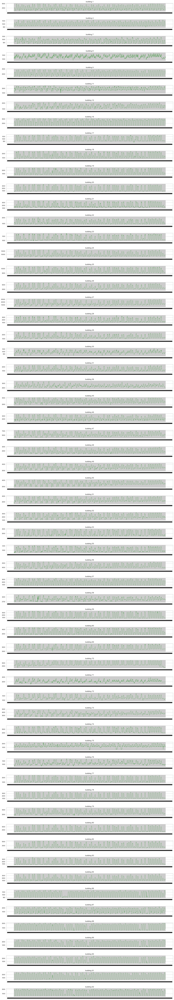

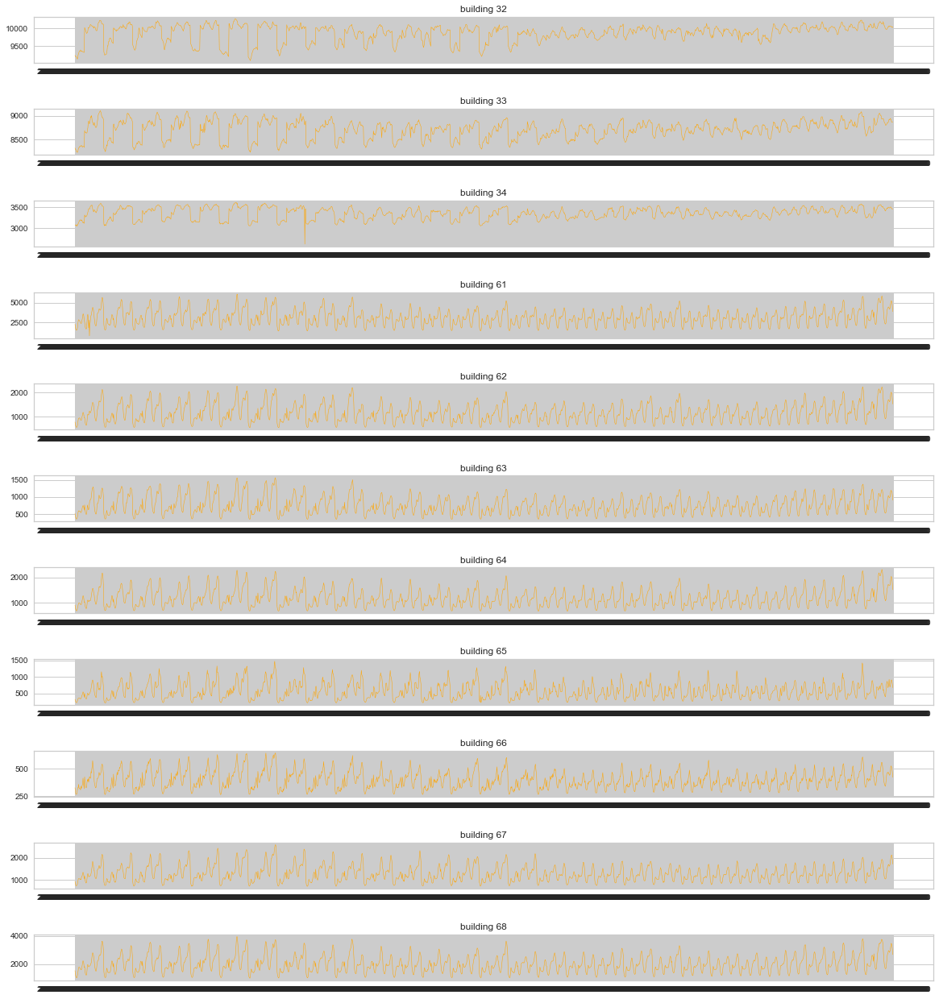

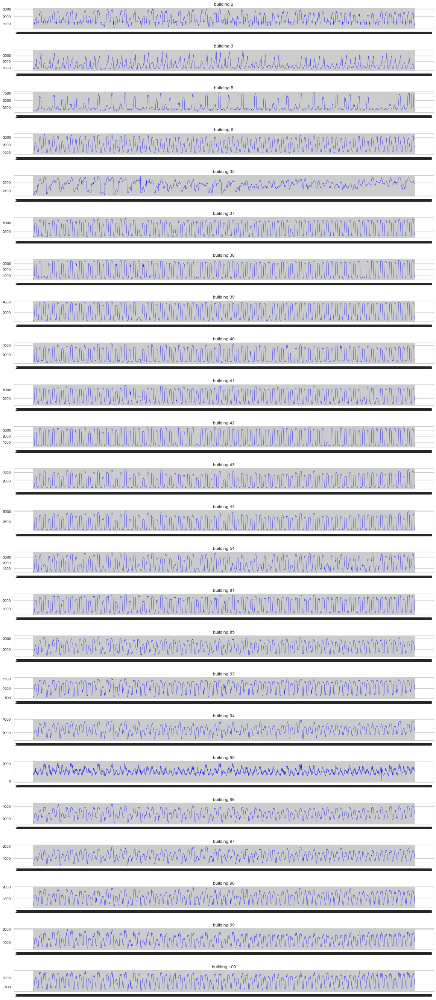

In [37]:
# linplot(energy usage of each building ~ cluster, datetime)
for c, col in enumerate(['red','green','orange','blue']):
    temp_1 = train[train.km_cluster == c]
    nums = np.unique(temp_1.building_number)
    n_nums = len(nums)
    fig = plt.figure(figsize = (20, 2*n_nums))
    for i, num in enumerate(nums):
        temp_2 = temp_1[temp_1.building_number == num]
        plt.subplot(n_nums,1, i+1)
        sns.lineplot(data = temp_2, x= 'date_time', y = 'power_consumption', linewidth = 0.5, color = col)
        plt.title(f'building {num}')
        plt.subplots_adjust(hspace = 1)
        plt.ylabel('')
        plt.xlabel('')

0. cluster 0
- 공통적인 특징이 안보임

1. cluster 1 
- 11 번 이상치 1100이하
- 86번 6월말쯤 전력사용량 꽤 오래 저하
- 1, 4, 7, 9, 11, 12, 16, 57, 75,86,87,88,89,90,91,92 제외 8월 마지막쯤 저하(45개)

2. cluster 2
- 34번 이상치 2700이하, 
- 32,33,34번 7월 중순 이후 변동 변화

3. cluster 3
- 5번 8월 마지막 전주 사용량 꽤 오래 저하
- 95번 이상치 300이하

11, 34, 95 이상치 처리

In [70]:
num_11 = train[train['building_number']==11]
num_11[num_11['power_consumption']<1100]

,building_number,date_time,temperature,windspeed,humidity,power_consumption,building_type,total_area,cooling_area,solar_power_capacity,...,temperature_3,discomfort_3,holiday,ma_dis_3,ma_dis_5,CDH,temperature_mean,discomfort_mean,CDH_mean,km_cluster
20525,11,2022-08-02 05:00:00,25.4,0.8,100.0,1091.76,Other Buildings,45956.56,13190.98,447.2,...,0.0,0.00000,False,77.78000,77.770110,15.0,25.102778,74.616058,-10.266667,1
21026,11,2022-08-09 02:00:00,25.5,1.7,100.0,951.36,Other Buildings,45956.56,13190.98,447.2,...,-1.1,-1.61898,False,78.14000,78.619796,-6.2,24.550000,74.619102,-18.515278,1
21033,11,2022-08-09 09:00:00,25.2,1.3,100.0,1028.16,Other Buildings,45956.56,13190.98,447.2,...,-0.2,-0.36000,False,77.49121,77.402726,-5.0,24.550000,74.619102,-18.515278,1


In [107]:
train.loc[20524,['hour','humidity','power_consumption']], train.iloc[20526,2:6], train.loc[21025,['hour','humidity','power_consumption']], train.iloc[21027,2:6], train.loc[21032,['hour','humidity','power_consumption']], train.iloc[21034,2:6]

(hour                       4
 humidity               100.0
 power_consumption    1683.12
 Name: 20524, dtype: object,
 temperature             25.7
 windspeed                1.2
 humidity               100.0
 power_consumption    1593.12
 Name: 20526, dtype: object,
 hour                       1
 humidity               100.0
 power_consumption    1494.72
 Name: 21025, dtype: object,
 temperature             25.6
 windspeed                2.1
 humidity               100.0
 power_consumption    1925.52
 Name: 21027, dtype: object,
 hour                       8
 humidity                98.0
 power_consumption    1979.04
 Name: 21032, dtype: object,
 temperature             25.1
 windspeed                1.3
 humidity               100.0
 power_consumption    2350.32
 Name: 21034, dtype: object)

In [152]:
# 11번 이상치(3개) 특이사항 안보여 주변 평균값으로 대체
train.loc[20525,'power_consumption'] = (1683.12+1593.12)/2
train.loc[21026,'power_consumption'] = (1494.72+1925.52)/2
train.loc[21033,'power_consumption'] = (1979.04+2350.32)/2

In [153]:
num_34 = train[train['building_number']==34]
num_34[num_34['power_consumption']<3000]

,building_number,date_time,temperature,windspeed,humidity,power_consumption,building_type,total_area,cooling_area,solar_power_capacity,...,temperature_3,discomfort_3,holiday,ma_dis_3,ma_dis_5,CDH,temperature_mean,discomfort_mean,CDH_mean,km_cluster
67893,34,2022-08-08 21:00:00,25.9,2.1,96.0,2631.24,Data Center,10665.0,9402.0,0.0,...,0.4,0.70416,False,78.205153,78.189636,2.5,24.693056,74.503397,-10.234722,2


In [154]:
train.loc[67892,'power_consumption'], train.loc[67894,'power_consumption'], train.loc[67893,'power_consumption']

(3490.92, 3452.76, 2631.24)

In [155]:
# 34 이상치(1개) 특이사항 안보여 주변 평균값으로 대체
train.loc[67893,'power_consumption'] = (3490.92+3452.76)/2

In [156]:
num_95 = train[train['building_number']==95]
num_95[num_95['power_consumption']<300]

,building_number,date_time,temperature,windspeed,humidity,power_consumption,building_type,total_area,cooling_area,solar_power_capacity,...,temperature_3,discomfort_3,holiday,ma_dis_3,ma_dis_5,CDH,temperature_mean,discomfort_mean,CDH_mean,km_cluster
193624,95,2022-07-27 16:00:00,29.8,2.1,51.0,0.00,Hotel and Resort,196992.54,57022.55,0.0,...,0.6,-0.37970,False,77.644627,77.70732,3.2,25.46875,75.405822,-3.64375,3
193625,95,2022-07-27 17:00:00,29.5,2.4,51.0,0.36,Hotel and Resort,196992.54,57022.55,0.0,...,1.3,1.02847,False,77.987450,77.86023,10.2,25.46875,75.405822,-3.64375,3


In [157]:
train.loc[193620:193629,'power_consumption']

193620    1459.08
193621    1421.64
193622     866.88
193623    1567.08
193624       0.00
193625       0.36
193626    1002.60
193627    1309.32
193628    1196.64
193629    1134.36
Name: power_consumption, dtype: float64

In [158]:
# 95 호텔 정전으로 인한 이상치(2개)로 보임 -> 주변 평균값 대체

train.loc[193624,'power_consumption'] = (1459.08+1421.64+866.88+1567.08)/4
train.loc[193625,'power_consumption'] = (1002.60+1309.32+1196.64+1134.36)/4

In [159]:
train.loc[193625,'power_consumption']

1160.73

In [160]:
train.to_csv('./data/0811.csv',encoding='utf-8', index=False)

# 08.11 작업 완료

In [131]:
train = pd.read_csv('./data/0811.csv', encoding='utf-8')
train

,building_number,date_time,temperature,windspeed,humidity,power_consumption,building_type,total_area,cooling_area,solar_power_capacity,...,temperature_3,discomfort_3,holiday,ma_dis_3,ma_dis_5,CDH,temperature_mean,discomfort_mean,CDH_mean,km_cluster
0,1,2022-06-01 00:00:00,18.6,0.9,42.0,1085.28,Other Buildings,110634.00,39570.00,0.0,...,0.0,0.00000,False,63.093880,63.093880,-7.4,25.655556,74.852219,-11.172222,1
1,1,2022-06-01 01:00:00,18.0,1.1,45.0,1047.36,Other Buildings,110634.00,39570.00,0.0,...,0.0,0.00000,False,62.778940,62.778940,-15.4,25.655556,74.852219,-11.172222,1
2,1,2022-06-01 02:00:00,17.7,1.5,45.0,974.88,Other Buildings,110634.00,39570.00,0.0,...,0.0,0.00000,False,62.548410,62.548410,-23.7,25.655556,74.852219,-11.172222,1
3,1,2022-06-01 03:00:00,16.7,1.4,48.0,953.76,Other Buildings,110634.00,39570.00,0.0,...,-1.9,-2.19504,False,61.816730,62.136018,-33.0,25.655556,74.852219,-11.172222,1
4,1,2022-06-01 04:00:00,18.4,2.8,43.0,986.40,Other Buildings,110634.00,39570.00,0.0,...,0.4,0.42388,False,61.958023,62.286390,-40.6,25.655556,74.852219,-11.172222,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100,2022-07-31 19:00:00,26.2,2.0,93.0,1232.64,Hotel and Resort,57497.84,40035.23,0.0,...,-0.9,-1.30705,True,78.939157,79.009592,5.8,26.195833,78.140069,9.150000,3
203996,100,2022-07-31 20:00:00,25.8,2.0,94.0,1103.28,Hotel and Resort,57497.84,40035.23,0.0,...,-1.0,-1.49596,True,78.440503,78.847068,5.9,26.195833,78.140069,9.150000,3
203997,100,2022-07-31 21:00:00,25.6,0.7,95.0,964.56,Hotel and Resort,57497.84,40035.23,0.0,...,-1.1,-1.68289,True,77.879540,78.422150,5.9,26.195833,78.140069,9.150000,3
203998,100,2022-07-31 22:00:00,25.4,1.7,97.0,773.28,Hotel and Resort,57497.84,40035.23,0.0,...,-0.8,-0.95072,True,77.562633,78.048786,5.1,26.195833,78.140069,9.150000,3


In [132]:
# 86번 6월 말쯤 데이터 훑기 (진행중)

num_86 =train[train['building_number']==86]
print(num_86[(num_86.month==6)&(num_86.day>24)&(num_86.day<27)].power_consumption.mean())
print(num_86[(num_86.month==6)&(num_86.day<20)].power_consumption.mean())

953.7412499999997
1055.3167105263153


Text(0.5, 0, '')

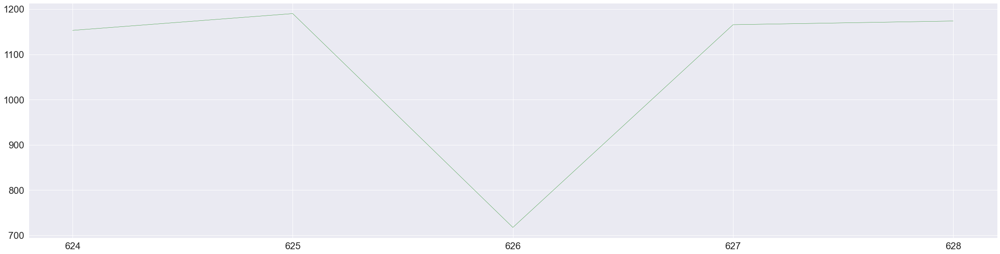

In [133]:
num_86_go = num_86[((num_86.month==6)&(num_86.day>23))&(num_86.day<29)].groupby(['month','day']).power_consumption.mean().reset_index()
num_86_go['go'] = num_86_go['month'].astype(str) + num_86_go['day'].astype(str)

fig = plt.figure(figsize = (40, 10))
sns.lineplot(data = num_86_go, x= 'go', y = 'power_consumption', linewidth = 0.5, color = 'green')
plt.ylabel('')
plt.xlabel('')

86번 건물 6월 26일 flag 두기

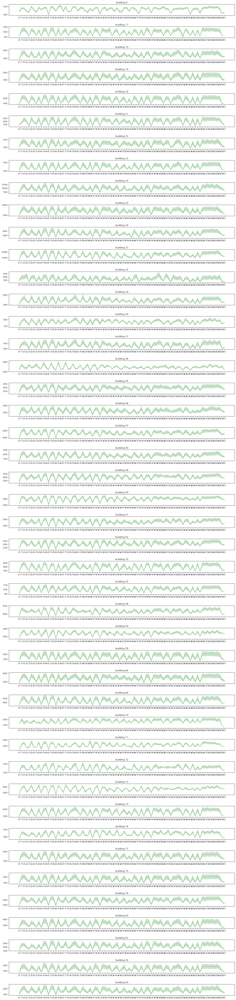

In [79]:
# cluster 1 45개 건물 공통점 찾기(8월 말쯤 저하를 보임)

temp_1 = train[train.km_cluster == 1]
temp_1 = temp_1[(temp_1.building_number!=1)&(temp_1.building_number!=4)&(temp_1.building_number!=7)&(temp_1.building_number!=9)&(temp_1.building_number!=11)&(temp_1.building_number!=12)&(temp_1.building_number!=16)&(temp_1.building_number!=57)&(temp_1.building_number!=75)&(temp_1.building_number!=86)&(temp_1.building_number!=87)&(temp_1.building_number!=88)&(temp_1.building_number!=89)&(temp_1.building_number!=90)&(temp_1.building_number!=91)&(temp_1.building_number!=92)]

nums = np.unique(temp_1.building_number)
n_nums = len(nums)

temp_1[(temp_1.month==8)&(temp_1.day>15)].groupby(['month','day']).power_consumption.mean().reset_index()
temp_1['md'] = temp_1['month'].astype(str) + temp_1['day'].astype(str)

fig = plt.figure(figsize = (20, 2*n_nums))
for i, num in enumerate(nums):
    temp_2 = temp_1[temp_1.building_number == num]
    plt.subplot(n_nums,1, i+1)
    sns.lineplot(data = temp_2, x= 'md', y = 'power_consumption', linewidth = 0.5, color = 'green')
    plt.title(f'building {num}')
    plt.subplots_adjust(hspace = 1)
    plt.ylabel('')
    plt.xlabel('')

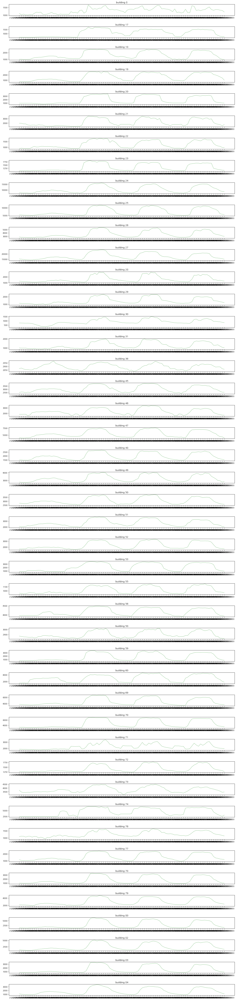

In [81]:
temp_1 = train[train.km_cluster == 1]
temp_1 = temp_1[(temp_1.building_number!=1)&(temp_1.building_number!=4)&(temp_1.building_number!=7)&(temp_1.building_number!=9)&(temp_1.building_number!=11)&(temp_1.building_number!=12)&(temp_1.building_number!=16)&(temp_1.building_number!=57)&(temp_1.building_number!=75)&(temp_1.building_number!=86)&(temp_1.building_number!=87)&(temp_1.building_number!=88)&(temp_1.building_number!=89)&(temp_1.building_number!=90)&(temp_1.building_number!=91)&(temp_1.building_number!=92)]

nums = np.unique(temp_1.building_number)
n_nums = len(nums)

temp_1 = temp_1[(temp_1.month==8)&(temp_1.day>20)]

fig = plt.figure(figsize = (20, 2*n_nums))
for i, num in enumerate(nums):
    temp_2 = temp_1[temp_1.building_number == num]
    plt.subplot(n_nums,1, i+1)
    sns.lineplot(data = temp_2, x= 'date_time', y = 'power_consumption', linewidth = 0.5, color = 'green')
    plt.title(f'building {num}')
    plt.subplots_adjust(hspace = 1)
    plt.ylabel('')
    plt.xlabel('')

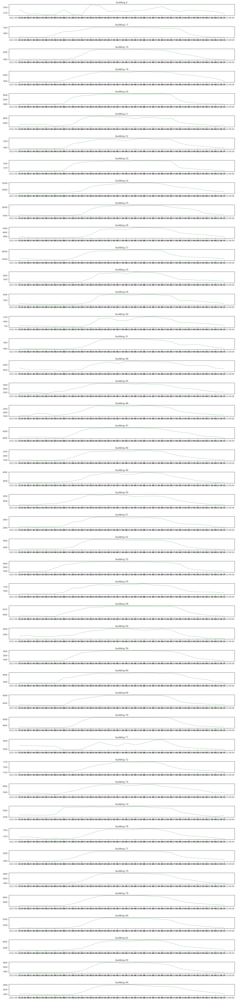

In [95]:
temp_1 = train[train.km_cluster == 1]
temp_1 = temp_1[(temp_1.building_number!=1)&(temp_1.building_number!=4)&(temp_1.building_number!=7)&(temp_1.building_number!=9)&(temp_1.building_number!=11)&(temp_1.building_number!=12)&(temp_1.building_number!=16)&(temp_1.building_number!=57)&(temp_1.building_number!=75)&(temp_1.building_number!=86)&(temp_1.building_number!=87)&(temp_1.building_number!=88)&(temp_1.building_number!=89)&(temp_1.building_number!=90)&(temp_1.building_number!=91)&(temp_1.building_number!=92)]

nums = np.unique(temp_1.building_number)
n_nums = len(nums)

temp_1 = temp_1[(temp_1.month==8)&(temp_1.day==24)&(temp)]

fig = plt.figure(figsize = (20, 2*n_nums))
for i, num in enumerate(nums):
    temp_2 = temp_1[temp_1.building_number == num]
    plt.subplot(n_nums,1, i+1)
    sns.lineplot(data = temp_2, x= 'date_time', y = 'power_consumption', linewidth = 0.5, color = 'green')
    plt.title(f'building {num}')
    plt.subplots_adjust(hspace = 1)
    plt.ylabel('')
    plt.xlabel('')

In [93]:

temp_1 = train[train.km_cluster == 1]
temp_1 = temp_1[(temp_1.building_number!=1)&(temp_1.building_number!=4)&(temp_1.building_number!=7)&(temp_1.building_number!=9)&(temp_1.building_number!=11)&(temp_1.building_number!=12)&(temp_1.building_number!=16)&(temp_1.building_number!=57)&(temp_1.building_number!=75)&(temp_1.building_number!=86)&(temp_1.building_number!=87)&(temp_1.building_number!=88)&(temp_1.building_number!=89)&(temp_1.building_number!=90)&(temp_1.building_number!=91)&(temp_1.building_number!=92)]

nums = np.unique(temp_1.building_number)
n_nums = len(nums)

temp_1 = temp_1[(temp_1.month==8)&(temp_1.day>15)].groupby(['building_number','month','day']).power_consumption.mean().reset_index()
temp_1

,building_number,month,day,power_consumption
0,8,8,16,1383.00
1,8,8,17,1448.86
2,8,8,18,1440.34
3,8,8,19,1419.26
4,8,8,20,1482.47
...,...,...,...,...
400,84,8,20,1380.10
401,84,8,21,1320.10
402,84,8,22,2095.38
403,84,8,23,1974.12


In [134]:
train[(train.building_number==26)|(train.building_number==27)|(train.building_number==28)].building_type.unique()

array(['University'], dtype=object)

cluster1 45개 건물 큰 특이점 안보임

 cluster 2 전체적으로 7월 중순 이후 변동 변화 -> 32,33,34 데이터센터로 추정(냉방으로)
 
 나머지는 아파트
 
 32,33,34 데이터센터의 경우 날씨, 냉방 변수 중요

Text(0.5, 0, '')

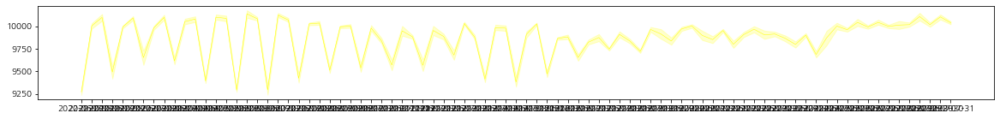

In [16]:
# cluster 3 32,33,34번 7월 중순쯤 데이터 훑기
num_32 = train[train.building_number==32]
num_32_go = num_32[num_32.month>=7]

fig = plt.figure(figsize = (20, 2))
sns.lineplot(data = num_32, x= 'date', y = 'power_consumption', color = 'yellow', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

Text(0.5, 0, '')

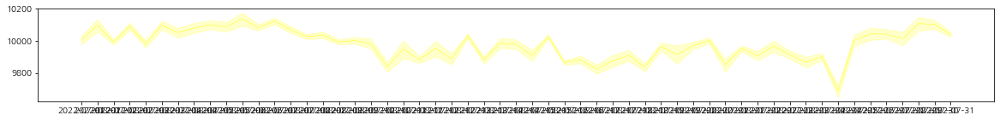

In [17]:
# cluster 3 32,33,34번 7월 중순쯤 데이터 훑기
num_32 = train[train.building_number==32]
num_32_go = num_32[num_32.month>=7]

fig = plt.figure(figsize = (20, 2))
sns.lineplot(data = num_32_go, x= 'date', y = 'power_consumption', color = 'yellow', linewidth=0.5)
plt.ylabel('')
plt.xlabel('')

Text(0.5, 0, '')

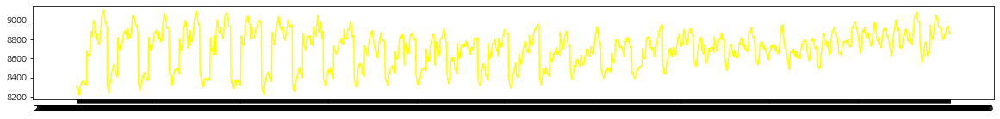

In [14]:
# cluster 3 32,33,34번 7월 중순쯤 데이터 훑기
num_33 = train[train.building_number==33]
num_33_go = num_33[num_33.month>=7]

fig = plt.figure(figsize = (20, 2))
sns.lineplot(data = num_33, x= 'date_time', y = 'power_consumption', color = 'yellow')
plt.ylabel('')
plt.xlabel('')

Text(0.5, 0, '')

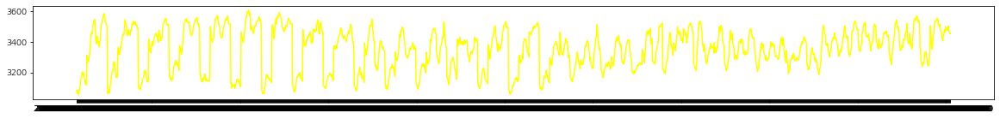

In [15]:
# cluster 3 32,33,34번 7월 중순쯤 데이터 훑기
num_34 = train[train.building_number==34]
num_34_go = num_34[num_34.month>=7]

fig = plt.figure(figsize = (20, 2))
sns.lineplot(data = num_34, x= 'date_time', y = 'power_consumption', color = 'yellow')
plt.ylabel('')
plt.xlabel('')

32,33,34건물 7월부터 사용

In [83]:
train[(train.building_number==32)|(train.building_number==33)|(train.building_number==34)].building_type.unique()

array(['Data Center'], dtype=object)

Text(0.5, 0, '')

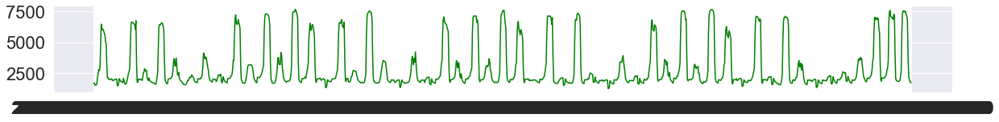

In [35]:
# cluster 3 5번 8월 말쯤 데이터 훑기
num_5 = train[train.building_number==5]
num_5_go = num_5[(num_5.month==8)|(num_5.month==7)]

fig = plt.figure(figsize = (20, 2))
sns.lineplot(data = num_5_go, x= 'date_time', y = 'power_consumption', color = 'green')
plt.ylabel('')
plt.xlabel('')

cluster3 5번 큰 특이점 안보임

In [164]:
print(train[train.cooling_area<240].power_consumption.mean()), print(len(train[train.cooling_area<=240]))
print(train[train.cooling_area>=240].power_consumption.mean()), print(len(train[train.cooling_area>240]))

1407.339511764707
10200
2506.0057611884495
193800


(None, None)

냉방면적 240 이상인 경우를 ac_yes의 1, 아닌경우 0 변수 생성

In [162]:
train.loc[(train['cooling_area'] >= 240), 'air_yes'] = 1
train.loc[(train['cooling_area'] < 240), 'air_yes'] = 0
test.loc[(test['cooling_area'] >= 240), 'air_yes'] = 1
test.loc[(test['cooling_area'] < 240), 'air_yes'] = 0

In [165]:
print(len(train[train.solar_power_capacity==0]))
print(len(train[train.solar_power_capacity>0]))
print(train[train.solar_power_capacity==0].power_consumption.mean())
print(train[train.solar_power_capacity>0].power_consumption.mean())
print('------------------------------------------------------------------')
print(len(train[train.ess_capacity==0]))
print(len(train[train.ess_capacity>0]))
print(train[train.ess_capacity==0].power_consumption.mean())
print(train[train.ess_capacity>0].power_consumption.mean())
print('------------------------------------------------------------------')
print(len(train[(train.ess_capacity>0)&train.solar_power_capacity>0]))
print(len(train[(train.ess_capacity==0)&train.solar_power_capacity>0]))
print(train[(train.ess_capacity>0)&train.solar_power_capacity>0].power_consumption.mean())
print(train[(train.ess_capacity==0)&train.solar_power_capacity>0].power_consumption.mean())

130560
73440
2150.289711933155
2985.7973141113225
------------------------------------------------------------------
193800
10200
2484.644439164036
1813.2046302287201
------------------------------------------------------------------
4080
69360
2065.103073120828
3039.9557988754523


태양광있음 solar_yes (있으면 1 없으면 0) (변경)

ess있음 ess_yes (있으면1 없으면 0) (변경)

태양광있고 ess 있음 sy_ey (추가)

태양광있고 ess 없음 sy_en (추가)

In [170]:
# train.loc[(train['solar_no'] == True), 'solar_yes'] = 0
# train.loc[(train['solar_no'] == False), 'solar_yes'] = 1
# train.loc[(train['ess_no'] == True), 'ess_yes'] = 0
# train.loc[(train['ess_no'] == False), 'ess_yes'] = 1
# train = train.drop(['solar_no','ess_no'],axis=1)

test.loc[(test['solar_no'] == True), 'solar_yes'] = 0
test.loc[(test['solar_no'] == False), 'solar_yes'] = 1
test.loc[(test['ess_no'] == True), 'ess_yes'] = 0
test.loc[(test['ess_no'] == False), 'ess_yes'] = 1
test = test.drop(['solar_no','ess_no'],axis=1)

train.loc[(train['solar_yes'] == 1)&(train['ess_yes']==1), 'sy_ey'] = 1
train.sy_ey.fillna(0, inplace=True)
train.loc[(train['solar_yes'] == 1)&(train['ess_yes']==0), 'sy_en'] = 1
train.sy_en.fillna(0, inplace=True)

test.loc[(test['solar_yes'] == 1)&(test['ess_yes']==1), 'sy_ey'] = 1
test.sy_ey.fillna(0, inplace=True)
test.loc[(test['solar_yes'] == 1)&(test['ess_yes']==0), 'sy_en'] = 1
test.sy_en.fillna(0, inplace=True)

train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204000 entries, 0 to 203999
Data columns (total 32 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   building_number       204000 non-null  int64  
 1   date_time             204000 non-null  object 
 2   temperature           204000 non-null  float64
 3   windspeed             204000 non-null  float64
 4   humidity              204000 non-null  float64
 5   power_consumption     204000 non-null  float64
 6   building_type         204000 non-null  object 
 7   total_area            204000 non-null  float64
 8   cooling_area          204000 non-null  float64
 9   solar_power_capacity  204000 non-null  float64
 10  ess_capacity          204000 non-null  float64
 11  pcs_capacity          204000 non-null  float64
 12  hour                  204000 non-null  int64  
 13  day                   204000 non-null  int64  
 14  month                 204000 non-null  int64  
 15  

holiday bool type -> 1 or 0 (int type 으로 변경)

In [173]:
train.loc[(train['holiday'] == True), 'holiday'] = 1
train.loc[(train['holiday'] == False), 'holiday'] = 0

test.loc[(test['holiday'] == True), 'holiday'] = 1
test.loc[(test['holiday'] == False), 'holiday'] = 0
train.holiday = train.holiday.astype(int)
test.holiday = test.holiday.astype(int)

date 컬럼 추가

In [177]:
train['date_time'] = pd.to_datetime(train['date_time'])
test['date_time'] = pd.to_datetime(test['date_time'])
train['date'] = train['date_time'].dt.date
test['date'] = test['date_time'].dt.date

체감온도 컬럼 추가

In [182]:
import math
def get_pow(series):
  return math.pow(series, 0.16)

train['sensory_temperature'] = 13.12 + 0.6215 * train['temperature'] - 11.37 * train['windspeed'].apply(get_pow) + 0.3965 * train['windspeed'].apply(get_pow) * train['temperature']
test['sensory_temperature'] = 13.12 + 0.6215 * test['temperature'] - 11.37 * test['windspeed'].apply(get_pow) + 0.3965 * test['windspeed'].apply(get_pow) * test['temperature']

In [183]:
train.to_csv('./data/train_0812.csv',encoding='cp949', index=False)
test.to_csv('./data/test_0812.csv',encoding='cp949', index=False)

# 전처리 및 군집화 끝, 군집별, 건물별 변수선택 시작 포인트

1. shap value 상위 feature

2. xgb feature importance 상위 feature

3. xgb rfecv

연속형 변수에 standard scaling, 범주형 변수에 one-hot encoding, 전력소비량에 log변환 후 exponential

In [27]:
train = pd.read_csv('./data/train_0812.csv', encoding='cp949')

In [10]:
train.describe()

,building_number,temperature,windspeed,humidity,power_consumption,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity,...,temperature_mean,discomfort_mean,CDH_mean,km_cluster,air_yes,solar_yes,ess_yes,sy_ey,sy_en,sensory_temperature
count,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,2.040000e+05,2.040000e+05,204000.000000,204000.000000,204000.000000,...,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.000000,204000.00,204000.00000,204000.000000
mean,50.500000,25.543524,2.134052,78.716518,2451.072449,2.608875e+05,1.864032e+05,35.678400,86.561000,31.000000,...,25.543524,75.419692,-5.418965,1.550000,0.950000,0.360000,0.050000,0.02,0.34000,27.712923
std,28.866141,3.779523,1.358146,15.080496,2440.638807,1.273550e+06,1.085174e+06,89.696667,431.217345,146.079104,...,1.305998,1.827660,15.630382,0.898612,0.217945,0.480001,0.217945,0.14,0.47371,3.938780
min,1.000000,10.100000,0.000000,13.000000,143.700000,5.578400e+03,0.000000e+00,0.000000,0.000000,0.000000,...,21.520833,69.574452,-55.868056,0.000000,0.000000,0.000000,0.000000,0.00,0.00000,11.666357
25%,25.750000,23.400000,1.200000,69.000000,1085.760000,6.144612e+04,2.318700e+04,0.000000,0.000000,0.000000,...,24.647222,74.170040,-16.604167,1.000000,1.000000,0.000000,0.000000,0.00,0.00000,25.499210
50%,50.500000,25.700000,2.000000,81.000000,1766.400000,9.264050e+04,5.582336e+04,0.000000,0.000000,0.000000,...,25.463889,75.071408,-6.952778,1.000000,1.000000,0.000000,0.000000,0.00,0.00000,27.873393
75%,75.250000,28.100000,2.800000,91.000000,2970.000000,1.848135e+05,9.915097e+04,31.250000,0.000000,0.000000,...,26.373611,76.653846,3.304167,2.000000,1.000000,1.000000,0.000000,0.00,1.00000,30.287795
max,100.000000,37.100000,13.300000,100.000000,25488.400000,1.287288e+07,1.094194e+07,621.000000,3100.000000,1000.000000,...,30.414583,81.662243,50.989583,3.000000,1.000000,1.000000,1.000000,1.00,1.00000,40.298484


In [11]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204000 entries, 0 to 203999
Data columns (total 34 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   building_number       204000 non-null  int64  
 1   date_time             204000 non-null  object 
 2   temperature           204000 non-null  float64
 3   windspeed             204000 non-null  float64
 4   humidity              204000 non-null  float64
 5   power_consumption     204000 non-null  float64
 6   building_type         204000 non-null  object 
 7   total_area            204000 non-null  float64
 8   cooling_area          204000 non-null  float64
 9   solar_power_capacity  204000 non-null  float64
 10  ess_capacity          204000 non-null  float64
 11  pcs_capacity          204000 non-null  float64
 12  hour                  204000 non-null  int64  
 13  day                   204000 non-null  int64  
 14  month                 204000 non-null  int64  
 15  

In [28]:
train.solar_yes = train.solar_yes.astype(int)
train.ess_yes = train.ess_yes.astype(int)
train.sy_ey = train.sy_ey.astype(int)
train.sy_en = train.sy_en.astype(int)

# train.drop(['building_number','date_time','building_type'])

train['hour_sin'] = np.sin(2 * np.pi * train['hour']/23.0)
train['hour_cos'] = np.cos(2 * np.pi * train['hour']/23.0)

train['date_sin'] = -np.sin(2 * np.pi * (train['month']+train['day']/31)/12)
train['date_cos'] = -np.cos(2 * np.pi * (train['month']+train['day']/31)/12)

train['month_sin'] = -np.sin(2 * np.pi * train['month']/12.0)
train['month_cos'] = -np.cos(2 * np.pi * train['month']/12.0)
## cyclic transformation on weekday
train['weekday_sin'] = -np.sin(2 * np.pi * (train['weekday']+1)/7.0)
train['weekday_cos'] = -np.cos(2 * np.pi * (train['weekday']+1)/7.0)


train['work_time'] = 0
train['low_day'] = 0
train['particular'] = 0
trains = [train[train.building_number == num] for num in range(1,101,1)]
# aa = trains[9]
# aa['work_time']  = (aa['hour'].isin([6,7,8])).astype(int)
# aa.describe()

## cluster 0
for num in [10,13]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7,8])).astype(int)
    
    trains[num-1] = temp_df
for num in [14]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7])).astype(int)
    temp_df['particular'] = temp_df['hour'].isin([0,8,12,18]).astype(int)
    trains[num-1] = temp_df
for num in [15]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([4,5,6,7,8])).astype(int)
    trains[num-1] = temp_df

## cluster 1
for num in [17,18,19,21,22,69,70,72]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [26,28,76,78,80,82,83,84]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [71]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)*(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = (((temp_df['weekday']==5)&(temp_df['hour'].isin([10,11,13,14])))
                               |((temp_df['weekday'].isin([0,1,2,3,4,5]))&(temp_df['hour'].isin([0,1,2,3,4])))).astype(int)
    trains[num-1] = temp_df
for num in [53]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=4)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [55]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=19)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [50]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [56]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = ((temp_df['weekday']==2)&(temp_df['hour']==16)).astype(int)
    trains[num-1] = temp_df
for num in [60]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [20,23]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [58,59,77]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [27,74,79]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [57]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [24,25]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [29,30]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [31]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [50]:
    temp_df = trains[num-1]
    temp_df['particular'] = (((temp_df['weekday']==2)&(temp_df['hour']==16))|((temp_df['weekday']==2)&(temp_df['hour']==16))).astype(int)
    trains[num-1] = temp_df
for num in [1]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [8]:
    temp_df = trains[num-1]
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [12]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [88,90]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    trains[num-1] = temp_df
for num in [86]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    temp_df['particular'] = ((temp_df['month']==6)&(temp_df['day']==26)).astype(int)
    trains[num-1] = temp_df
for num in [87,89,91]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=9)).astype(int)
    trains[num-1] = temp_df
for num in [4]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    trains[num-1] = temp_df
for num in [7,16]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=5)).astype(int)
    trains[num-1] = temp_df
for num in [9]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=23)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [11]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [36]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    trains[num-1] = temp_df
for num in [75]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=15)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [92]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=6)).astype(int)
    trains[num-1] = temp_df

## cluster 2
for num in [32,33,34]:
    temp_df = trains[num-1]
    temp_df = temp_df[temp_df.month>=7]
    trains[num-1] = temp_df
for num in [61,65,66,67,68]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df
for num in [62,63,64]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df

## cluster 3
for num in [93,94,96,97,98,100]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=6)&(temp_df['hour']<=22)).astype(int)
    trains[num-1] = temp_df
for num in [42,43,44]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=20)).astype(int)
    trains[num-1] = temp_df
for num in [2,85,99]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [38,40,95]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=20)).astype(int)
    trains[num-1] = temp_df
for num in [3,81]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [6,41]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=22)).astype(int)
    trains[num-1] = temp_df
for num in [37,39]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [35]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df
for num in [54]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=5)&(temp_df['hour']<=20)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==0).astype(int)
    trains[num-1] = temp_df
for num in [5]:
    temp_df = trains[num-1]
    temp_df['particular'] = (((temp_df['weekday']==4)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==5)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==6)&(temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18])))).astype(int)
    trains[num-1] = temp_df
    

df = pd.concat(trains, ignore_index=True)
df = df.drop(['date_time','hour','day','month','weekday','date'], axis=1)

df_0 = df[df.km_cluster==0]
df_1 = df[df.km_cluster==1]
df_2 = df[df.km_cluster==2]
df_3 = df[df.km_cluster==3]

X_0 = df_0.drop('power_consumption', axis=1)
y_0 = df_0['power_consumption']
y_0_log = np.log(y_0)
X_0 = X_0.drop('km_cluster', axis=1)

X_1 = df_1.drop('power_consumption', axis=1)
y_1 = df_1['power_consumption']
y_1_log = np.log(y_1)
X_1 = X_1.drop('km_cluster', axis=1)

X_2 = df_2.drop('power_consumption', axis=1)
y_2 = df_2['power_consumption']
y_2_log = np.log(y_2)
X_2 = X_2.drop('km_cluster', axis=1)

X_3 = df_3.drop('power_consumption', axis=1)
y_3 = df_3['power_consumption']
y_3_log = np.log(y_3)
X_3 = X_3.drop('km_cluster', axis=1)


# Standard Scaling for continuous data
con_li = ['hour_sin', 'hour_cos', 'date_sin', 'date_cos', 'month_sin', 'month_cos', 'weekday_sin', 'weekday_cos', 'temperature', 'windspeed', 
'humidity', 'total_area', 'cooling_area', 'solar_power_capacity', 'ess_capacity', 'pcs_capacity', 'discomfort', 'temperature_3', 
'discomfort_3', 'ma_dis_3', 'ma_dis_5', 'CDH', 'temperature_mean', 'discomfort_mean', 'CDH_mean', 'sensory_temperature']

# ## one-hot encoding for categorical data
cat_li = ['building_number','building_type','holiday','air_yes','solar_yes',
         'ess_yes','sy_ey','sy_en','low_day','particular']


for col in con_li :
    if X_0[col].std() == 0:
        X_0 = X_0.drop(col, axis=1)
    else :
        X_0[col] = (X_0[col] - X_0[col].mean())/X_0[col].std()
        
for col in cat_li :
    if X_0[col].nunique() == 1:        
        X_0 = X_0.drop(col,axis=1)
    else :
        X_0[col] = X_0[col].astype('category')
X_0_train = pd.get_dummies(X_0)

for col in con_li :
    if X_1[col].std() == 0:
        X_1 = X_1.drop(col, axis=1)
    else :
        X_1[col] = (X_1[col] - X_1[col].mean())/X_1[col].std()
        
for col in cat_li :
    if X_1[col].nunique() == 1:
        X_1 = X_1.drop(col,axis=1)
    else :
        X_1[col] = X_1[col].astype('category')
X_1_train = pd.get_dummies(X_1)

for col in con_li :
    if X_2[col].std() == 0:
        X_2 = X_2.drop(col, axis=1)
    else :
        X_2[col] = (X_2[col] - X_2[col].mean())/X_2[col].std()
        
for col in cat_li :
    if X_2[col].nunique() == 1:
        X_2 = X_2.drop(col,axis=1)
    else :
        X_2[col] = X_2[col].astype('category')
X_2_train = pd.get_dummies(X_2)

for col in con_li :
    if X_3[col].std() == 0:
        X_3 = X_3.drop(col, axis=1)
    else :
        X_3[col] = (X_3[col] - X_3[col].mean())/X_3[col].std()
        
for col in cat_li :
    if X_3[col].nunique() == 1:
        X_3 = X_3.drop(col,axis=1)
    else :
        X_3[col] = X_3[col].astype('category')
X_3_train = pd.get_dummies(X_3)

X_1_train


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

,temperature,windspeed,humidity,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity,discomfort,temperature_3,...,ess_yes_0,ess_yes_1,sy_ey_0,sy_ey_1,sy_en_0,sy_en_1,low_day_0,low_day_1,particular_0,particular_1
0,-1.847611,-0.885221,-2.338269,-0.146626,-0.159423,-0.510325,-0.22361,-0.249893,-2.265563,-0.003870,...,1,0,1,0,1,0,1,0,1,0
1,-2.006039,-0.726032,-2.145283,-0.146626,-0.159423,-0.510325,-0.22361,-0.249893,-2.380962,-0.003870,...,1,0,1,0,1,0,1,0,1,0
2,-2.085253,-0.407656,-2.145283,-0.146626,-0.159423,-0.510325,-0.22361,-0.249893,-2.449968,-0.003870,...,1,0,1,0,1,0,1,0,1,0
3,-2.349299,-0.487250,-1.952297,-0.146626,-0.159423,-0.510325,-0.22361,-0.249893,-2.667712,-0.932699,...,1,0,1,0,1,0,1,0,1,0
4,-1.900421,0.627069,-2.273940,-0.146626,-0.159423,-0.510325,-0.22361,-0.249893,-2.303304,0.191673,...,1,0,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185515,0.370378,0.706663,0.942494,-0.165212,-0.174628,0.385495,-0.22361,-0.249893,0.782288,-0.199413,...,1,0,1,0,0,1,1,0,1,0
185516,0.053522,1.104635,1.264138,-0.165212,-0.174628,0.385495,-0.22361,-0.249893,0.504775,-0.639384,...,1,0,1,0,0,1,1,0,1,0
185517,0.027118,-0.009684,1.392795,-0.165212,-0.174628,0.385495,-0.22361,-0.249893,0.512990,-0.786042,...,1,0,1,0,0,1,1,0,1,0
185518,-0.025691,-0.328061,1.392795,-0.165212,-0.174628,0.385495,-0.22361,-0.249893,0.447035,-0.737156,...,1,0,1,0,0,1,1,0,1,0


In [ ]:
X_0_train.describe()

In [32]:
train = pd.read_csv('./data/train_0812.csv', encoding='cp949')
test = pd.read_csv('./data/test_0812.csv', encoding='cp949')
cluster_dict = train.groupby('building_number')['km_cluster'].first().to_dict()
test['km_cluster'] = test['building_number'].map(cluster_dict)

test.solar_yes = test.solar_yes.astype(int)
test.ess_yes = test.ess_yes.astype(int)
test.sy_ey = test.sy_ey.astype(int)
test.sy_en = test.sy_en.astype(int)

# test.drop(['building_number','date_time','building_type'])

test['hour_sin'] = np.sin(2 * np.pi * test['hour']/23.0)
test['hour_cos'] = np.cos(2 * np.pi * test['hour']/23.0)

test['date_sin'] = -np.sin(2 * np.pi * (test['month']+test['day']/31)/12)
test['date_cos'] = -np.cos(2 * np.pi * (test['month']+test['day']/31)/12)

test['month_sin'] = -np.sin(2 * np.pi * test['month']/12.0)
test['month_cos'] = -np.cos(2 * np.pi * test['month']/12.0)
## cyclic transformation on weekday
test['weekday_sin'] = -np.sin(2 * np.pi * (test['weekday']+1)/7.0)
test['weekday_cos'] = -np.cos(2 * np.pi * (test['weekday']+1)/7.0)


test['work_time'] = 0
test['low_day'] = 0
test['particular'] = 0
tests = [test[test.building_number == num] for num in range(1,101,1)]
# aa = tests[9]
# aa['work_time']  = (aa['hour'].isin([6,7,8])).astype(int)
# aa.describe()

## cluster 0
for num in [10,13]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7,8])).astype(int)
    
    tests[num-1] = temp_df
for num in [14]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7])).astype(int)
    temp_df['particular'] = temp_df['hour'].isin([0,8,12,18]).astype(int)
    tests[num-1] = temp_df
for num in [15]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([4,5,6,7,8])).astype(int)
    tests[num-1] = temp_df

## cluster 1
for num in [17,18,19,21,22,69,70,72]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [26,28,76,78,80,82,83,84]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [71]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)*(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = (((temp_df['weekday']==5)&(temp_df['hour'].isin([10,11,13,14])))
                               |((temp_df['weekday'].isin([0,1,2,3,4,5]))&(temp_df['hour'].isin([0,1,2,3,4])))).astype(int)
    tests[num-1] = temp_df
for num in [53]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=4)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [55]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=19)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [50]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [56]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = ((temp_df['weekday']==2)&(temp_df['hour']==16)).astype(int)
    tests[num-1] = temp_df
for num in [60]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [20,23]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [58,59,77]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [27,74,79]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [57]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [24,25]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [29,30]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [31]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [50]:
    temp_df = tests[num-1]
    temp_df['particular'] = (((temp_df['weekday']==2)&(temp_df['hour']==16))|((temp_df['weekday']==2)&(temp_df['hour']==16))).astype(int)
    tests[num-1] = temp_df
for num in [1]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [8]:
    temp_df = tests[num-1]
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [12]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [88,90]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    tests[num-1] = temp_df
for num in [86]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    temp_df['particular'] = ((temp_df['month']==6)&(temp_df['day']==26)).astype(int)
    tests[num-1] = temp_df
for num in [87,89,91]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=9)).astype(int)
    tests[num-1] = temp_df
for num in [4]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    tests[num-1] = temp_df
for num in [7,16]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=5)).astype(int)
    tests[num-1] = temp_df
for num in [9]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=23)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [11]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [36]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    tests[num-1] = temp_df
for num in [75]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=15)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [92]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=6)).astype(int)
    tests[num-1] = temp_df

## cluster 2
for num in [32,33,34]:
    temp_df = tests[num-1]
    temp_df = temp_df[temp_df.month>=7]
    tests[num-1] = temp_df
for num in [61,65,66,67,68]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df
for num in [62,63,64]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df

## cluster 3
for num in [93,94,96,97,98,100]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=6)&(temp_df['hour']<=22)).astype(int)
    tests[num-1] = temp_df
for num in [42,43,44]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=20)).astype(int)
    tests[num-1] = temp_df
for num in [2,85,99]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [38,40,95]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=20)).astype(int)
    tests[num-1] = temp_df
for num in [3,81]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [6,41]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=22)).astype(int)
    tests[num-1] = temp_df
for num in [37,39]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [35]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df
for num in [54]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=5)&(temp_df['hour']<=20)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==0).astype(int)
    tests[num-1] = temp_df
for num in [5]:
    temp_df = tests[num-1]
    temp_df['particular'] = (((temp_df['weekday']==4)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==5)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==6)&(temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18])))).astype(int)
    tests[num-1] = temp_df
    

df = pd.concat(tests, ignore_index=True)
df = df.drop(['date_time','hour','day','month','weekday','date'], axis=1)

df_0 = df[df.km_cluster==0]
df_1 = df[df.km_cluster==1]
df_2 = df[df.km_cluster==2]
df_3 = df[df.km_cluster==3]

X_0 = df_0.drop('km_cluster', axis=1)
X_1 = df_1.drop('km_cluster', axis=1)
X_2 = df_2.drop('km_cluster', axis=1)
X_3 = df_3.drop('km_cluster', axis=1)


# Standard Scaling for continuous data
con_li = ['hour_sin', 'hour_cos', 'date_sin', 'date_cos', 'month_sin', 'month_cos', 'weekday_sin', 'weekday_cos', 'temperature', 'windspeed', 
'humidity', 'total_area', 'cooling_area', 'solar_power_capacity', 'ess_capacity', 'pcs_capacity', 'discomfort', 'temperature_3', 
'discomfort_3', 'ma_dis_3', 'ma_dis_5', 'CDH', 'temperature_mean', 'discomfort_mean', 'CDH_mean', 'sensory_temperature']

# ## one-hot encoding for categorical data
cat_li = ['building_number','building_type','holiday','air_yes','solar_yes',
         'ess_yes','sy_ey','sy_en','low_day','particular']


for col in con_li :
    if X_0[col].std() == 0:
        X_0 = X_0.drop(col, axis=1)
    else :
        X_0[col] = (X_0[col] - X_0[col].mean())/X_0[col].std()
        
for col in cat_li :
    if X_0[col].nunique() == 1:        
        X_0 = X_0.drop(col,axis=1)
    else :
        X_0[col] = X_0[col].astype('category')
X_0_test = pd.get_dummies(X_0)

for col in con_li :
    if X_1[col].std() == 0:
        X_1 = X_1.drop(col, axis=1)
    else :
        X_1[col] = (X_1[col] - X_1[col].mean())/X_1[col].std()
        
for col in cat_li :
    if X_1[col].nunique() == 1:
        X_1 = X_1.drop(col,axis=1)
    else :
        X_1[col] = X_1[col].astype('category')
X_1_test = pd.get_dummies(X_1)

for col in con_li :
    if X_2[col].std() == 0:
        X_2 = X_2.drop(col, axis=1)
    else :
        X_2[col] = (X_2[col] - X_2[col].mean())/X_2[col].std()
        
for col in cat_li :
    if X_2[col].nunique() == 1:
        X_2 = X_2.drop(col,axis=1)
    else :
        X_2[col] = X_2[col].astype('category')
X_2_test = pd.get_dummies(X_2)

for col in con_li :
    if X_3[col].std() == 0:
        X_3 = X_3.drop(col, axis=1)
    else :
        X_3[col] = (X_3[col] - X_3[col].mean())/X_3[col].std()
        
for col in cat_li :
    if X_3[col].nunique() == 1:
        X_3 = X_3.drop(col,axis=1)
    else :
        X_3[col] = X_3[col].astype('category')
X_3_test = pd.get_dummies(X_3)

X_1_test



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

,temperature,windspeed,humidity,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity,discomfort,temperature_3,...,ess_yes_0,ess_yes_1,sy_ey_0,sy_ey_1,sy_en_0,sy_en_1,low_day_0,low_day_1,particular_0,particular_1
0,0.561470,0.511802,-0.333442,-0.146619,-0.159416,-0.510302,-0.2236,-0.249882,0.625234,0.008467,...,1,0,1,0,1,0,1,0,1,0
1,0.387851,-0.748304,-0.333442,-0.146619,-0.159416,-0.510302,-0.2236,-0.249882,0.423589,0.008467,...,1,0,1,0,1,0,1,0,1,0
2,0.283680,-0.166717,-0.150988,-0.146619,-0.159416,-0.510302,-0.2236,-0.249882,0.367537,0.008467,...,1,0,1,0,1,0,1,0,1,0
3,0.075337,-0.360579,0.031465,-0.146619,-0.159416,-0.510302,-0.2236,-0.249882,0.181059,-0.696976,...,1,0,1,0,1,0,1,0,1,0
4,-0.028835,-0.651373,-0.029353,-0.146619,-0.159416,-0.510302,-0.2236,-0.249882,0.036067,-0.596199,...,1,0,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15451,0.179508,-0.554442,0.396372,-0.165204,-0.174620,0.385477,-0.2236,-0.249882,0.431915,-0.142699,...,1,0,1,0,0,1,1,0,1,0
15452,-0.133006,-0.845236,0.518008,-0.165204,-0.174620,0.385477,-0.2236,-0.249882,0.077636,-0.999309,...,1,0,1,0,0,1,1,0,1,0
15453,-0.028835,-0.748304,0.518008,-0.165204,-0.174620,0.385477,-0.2236,-0.249882,0.209634,-0.797754,...,1,0,1,0,0,1,1,0,1,0
15454,-0.271902,-1.232961,0.943733,-0.165204,-0.174620,0.385477,-0.2236,-0.249882,0.023787,-0.646587,...,1,0,1,0,0,1,1,0,1,0


# 0815 군집별 전처리 끝 변수중요도 시각화 및 모델링 시작포인트

1. 변수중요도 확인 및 변수 선택
     1. XGB feature importance
     2. XGB RFECV
     3. shap value

2. 모델링

cluster 0 XGB feature importnace 확인

In [31]:
from sktime.forecasting.model_selection import temporal_train_test_split

cols = X_0_train.columns
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_0_log,X=X_0_train, test_size=168)

xgbr_0 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_0.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_test,y_test)], eval_metric="logloss")

importance = xgbr_0.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-246.86895
[1]	validation_0-logloss:-250.22410
[2]	validation_0-logloss:-251.91952
[3]	validation_0-logloss:-252.91636
[4]	validation_0-logloss:-253.54012
[5]	validation_0-logloss:-253.94739
[6]	validation_0-logloss:-254.22134
[7]	validation_0-logloss:-254.40952
[8]	validation_0-logloss:-254.54154
[9]	validation_0-logloss:-254.63311
[10]	validation_0-logloss:-254.69974
[11]	validation_0-logloss:-254.74461
[12]	validation_0-logloss:-254.77510
[13]	validation_0-logloss:-254.79542
[14]	validation_0-logloss:-254.80881
[15]	validation_0-logloss:-254.82246
[16]	validation_0-logloss:-254.83007
[17]	validation_0-logloss:-254.83507


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[18]	validation_0-logloss:-254.83812
[19]	validation_0-logloss:-254.84020
[20]	validation_0-logloss:-254.84246
[21]	validation_0-logloss:-254.84419
[22]	validation_0-logloss:-254.84569
[23]	validation_0-logloss:-254.84310
[24]	validation_0-logloss:-254.84402
[25]	validation_0-logloss:-254.84521
[26]	validation_0-logloss:-254.84543
[27]	validation_0-logloss:-254.84533
[28]	validation_0-logloss:-254.84717
[29]	validation_0-logloss:-254.84770
[30]	validation_0-logloss:-254.84772
[31]	validation_0-logloss:-254.84732
[32]	validation_0-logloss:-254.84723
[33]	validation_0-logloss:-254.84727
[34]	validation_0-logloss:-254.84727
[35]	validation_0-logloss:-254.84667
[36]	validation_0-logloss:-254.84633
[37]	validation_0-logloss:-254.84580
[38]	validation_0-logloss:-254.84537
[39]	validation_0-logloss:-254.84548
[40]	validation_0-logloss:-254.84549
[41]	validation_0-logloss:-254.84385
[42]	validation_0-logloss:-254.84394
[43]	validation_0-logloss:-254.84048
[44]	validation_0-logloss:-254.84056
[

,feature,importances
0,building_number_10,0.800568
1,work_time,0.049054
2,total_area,0.039944
3,holiday_0,0.024199
4,particular_0,0.015627
5,hour_cos,0.013189
6,date_sin,0.008945
7,weekday_cos,0.008067
8,hour_sin,0.005218
9,CDH_mean,0.004398


cluster 1 XGB feature importnace 확인

In [14]:
cols = X_1_train.columns
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_1_log,X=X_1_train, test_size=168)

xgbr_1 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_1.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_test,y_test)], eval_metric="logloss")

importance = xgbr_1.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[0]	validation_0-logloss:-229.55554
[1]	validation_0-logloss:-232.68379
[2]	validation_0-logloss:-234.30833
[3]	validation_0-logloss:-235.23895
[4]	validation_0-logloss:-235.85402
[5]	validation_0-logloss:-236.24554
[6]	validation_0-logloss:-236.48674
[7]	validation_0-logloss:-236.68517
[8]	validation_0-logloss:-236.79437
[9]	validation_0-logloss:-236.86869
[10]	validation_0-logloss:-236.92174
[11]	validation_0-logloss:-236.96964
[12]	validation_0-logloss:-236.96957
[13]	validation_0-logloss:-236.98887
[14]	validation_0-logloss:-237.00721
[15]	validation_0-logloss:-237.00883
[16]	validation_0-logloss:-237.01316
[17]	validation_0-logloss:-237.01663
[18]	validation_0-logloss:-237.01925
[19]	validation_0-logloss:-237.02646
[20]	validation_0-logloss:-237.02564
[21]	validation_0-logloss:-237.02218
[22]	validation_0-logloss:-237.02080
[23]	validation_0-logloss:-237.02423
[24]	validation_0-logloss:-237.02400
[25]	validation_0-logloss:-237.02289
[26]	validation_0-logloss:-237.01257
[27]	valida

,feature,importances
0,cooling_area,0.128746
1,building_type_University,0.126030
2,building_number_27,0.074479
3,building_type_Research Institute,0.060352
4,building_type_Discount Mart,0.059117
...,...,...
108,building_number_58,0.000000
109,building_type_Data Center,0.000000
110,building_number_71,0.000000
111,building_number_72,0.000000


cluster 1 중요도 zero feature

In [15]:
zero_importance_columns_1 = importances[importances['importances'] == 0]['feature'].tolist()
print(zero_importance_columns_1)
non_zero_importance_columns_1 = importances[importances['importances'] != 0]['feature'].tolist()

['building_number_77', 'air_yes_1.0', 'low_day_1', 'pcs_capacity', 'sy_en_1', 'sy_en_0', 'sy_ey_1', 'date_cos', 'ess_yes_1', 'ess_yes_0', 'solar_yes_1', 'solar_yes_0', 'air_yes_0.0', 'building_number_74', 'holiday_1', 'month_sin', 'month_cos', 'building_number_20', 'building_number_36', 'building_number_47', 'building_number_48', 'building_number_58', 'building_type_Data Center', 'building_number_71', 'building_number_72', 'particular_1']


cluster 2 XGB feature importnace 확인

In [19]:
cols = X_2_train.columns
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_2_log,X=X_2_train, test_size=168)

xgbr_2 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_2.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_test,y_test)], eval_metric="logloss")

importance = xgbr_2.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-254.95955
[1]	validation_0-logloss:-258.47673
[2]	validation_0-logloss:-260.23474
[3]	validation_0-logloss:-261.28185
[4]	validation_0-logloss:-261.93562
[5]	validation_0-logloss:-262.36042
[6]	validation_0-logloss:-262.64080
[7]	validation_0-logloss:-262.84497
[8]	validation_0-logloss:-262.97460


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[9]	validation_0-logloss:-263.06173
[10]	validation_0-logloss:-263.12818
[11]	validation_0-logloss:-263.17361
[12]	validation_0-logloss:-263.20664
[13]	validation_0-logloss:-263.22616
[14]	validation_0-logloss:-263.24178
[15]	validation_0-logloss:-263.24968
[16]	validation_0-logloss:-263.26193
[17]	validation_0-logloss:-263.27002
[18]	validation_0-logloss:-263.27466
[19]	validation_0-logloss:-263.27776
[20]	validation_0-logloss:-263.27872
[21]	validation_0-logloss:-263.27977
[22]	validation_0-logloss:-263.28120
[23]	validation_0-logloss:-263.28273
[24]	validation_0-logloss:-263.28726
[25]	validation_0-logloss:-263.28823
[26]	validation_0-logloss:-263.28862
[27]	validation_0-logloss:-263.28912
[28]	validation_0-logloss:-263.29027
[29]	validation_0-logloss:-263.29084
[30]	validation_0-logloss:-263.29220
[31]	validation_0-logloss:-263.29158
[32]	validation_0-logloss:-263.29164
[33]	validation_0-logloss:-263.29163
[34]	validation_0-logloss:-263.29144
[35]	validation_0-logloss:-263.29147
[3

,feature,importances
0,total_area,0.615937
1,cooling_area,0.218617
2,building_number_63,0.070870
3,work_time,0.048035
4,ma_dis_5,0.012649
5,date_sin,0.004760
6,hour_cos,0.004452
7,hour_sin,0.004335
8,holiday_0,0.003947
9,CDH,0.003076


cluster 2 중요도 zero feature

In [20]:
zero_importance_columns_2 = importances[importances['importances'] == 0]['feature'].tolist()
print(zero_importance_columns_2)
non_zero_importance_columns_2 = importances[importances['importances'] != 0]['feature'].tolist()

['building_type_Data Center', 'holiday_1', 'air_yes_0.0', 'building_type_Apartment', 'month_cos', 'building_number_61', 'building_number_34', 'month_sin', 'date_cos', 'air_yes_1.0']


cluster 3 XGB feature importnace 확인

In [22]:
cols = X_3_train.columns
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_3_log,X=X_3_train, test_size=168)

xgbr_3 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_3.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_test,y_test)], eval_metric="logloss")

importance = xgbr_3.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-215.60285
[1]	validation_0-logloss:-218.68181


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[2]	validation_0-logloss:-220.17075
[3]	validation_0-logloss:-221.05513
[4]	validation_0-logloss:-221.63624
[5]	validation_0-logloss:-221.97798
[6]	validation_0-logloss:-222.23067
[7]	validation_0-logloss:-222.36928
[8]	validation_0-logloss:-222.48444
[9]	validation_0-logloss:-222.55149
[10]	validation_0-logloss:-222.59518
[11]	validation_0-logloss:-222.62990
[12]	validation_0-logloss:-222.65548
[13]	validation_0-logloss:-222.67752
[14]	validation_0-logloss:-222.69578
[15]	validation_0-logloss:-222.69052
[16]	validation_0-logloss:-222.69471
[17]	validation_0-logloss:-222.69755
[18]	validation_0-logloss:-222.69948
[19]	validation_0-logloss:-222.69437
[20]	validation_0-logloss:-222.69528
[21]	validation_0-logloss:-222.69635
[22]	validation_0-logloss:-222.69467
[23]	validation_0-logloss:-222.69325
[24]	validation_0-logloss:-222.69141
[25]	validation_0-logloss:-222.68998
[26]	validation_0-logloss:-222.69000
[27]	validation_0-logloss:-222.68912
[28]	validation_0-logloss:-222.68523
[29]	vali

,feature,importances
0,building_type_Other Buildings,0.269681
1,work_time,0.204948
2,building_type_Department Store and Outlet,0.102713
3,total_area,0.069041
4,building_number_96,0.060819
...,...,...
65,building_number_3,0.000000
66,month_cos,0.000000
67,month_sin,0.000000
68,date_cos,0.000000


cluster 3 중요도 zero feature

In [26]:
zero_importance_columns_3 = importances[importances['importances'] == 0]['feature'].tolist()
print(zero_importance_columns_3)
non_zero_importance_columns_3 = importances[importances['importances'] != 0]['feature'].tolist()

['building_number_5', 'low_day_1', 'ess_capacity', 'sy_en_1', 'holiday_1', 'sy_en_0', 'ess_yes_1', 'ess_yes_0', 'solar_yes_1', 'solar_yes_0', 'building_type_Knowledge Industry Center', 'building_number_35', 'pcs_capacity', 'building_type_Discount Mart', 'building_type_Data Center', 'building_type_Commercial', 'building_number_3', 'month_cos', 'month_sin', 'date_cos', 'particular_1']


cluster 0 XGB RFECV

In [74]:
from sklearn.feature_selection import RFECV

y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_0_log,X=X_0_train, test_size=168)

estimator = XGBRegressor(objective='reg:squarederror', n_estimators=500)

selector = RFECV(estimator, step=1, min_features_to_select=1, cv=10, scoring='neg_mean_absolute_error')

#fit the model, get a rank of the variables, and a matrix of the selected X variables
selector = selector.fit(X_train, y_train)

selected_col = X_train.columns[selector.support_]
selected_col

Index(['total_area', 'solar_power_capacity', 'ma_dis_3', 'ma_dis_5', 'CDH',
       'temperature_mean', 'discomfort_mean', 'CDH_mean',
       'sensory_temperature', 'hour_sin', 'hour_cos', 'date_sin',
       'weekday_sin', 'weekday_cos', 'work_time', 'building_number_10',
       'holiday_0', 'particular_0'],
      dtype='object')

cluster 1 XGB RFECV

In [3]:
from sklearn.feature_selection import RFECV

y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_1_log,X=X_1_train, test_size=168)

estimator = XGBRegressor(objective='reg:squarederror', n_estimators=500)

selector = RFECV(estimator, step=1, min_features_to_select=1, cv=10, scoring='neg_mean_absolute_error')

#fit the model, get a rank of the variables, and a matrix of the selected X variables
selector = selector.fit(X_train, y_train)

selected_col = X_train.columns[selector.support_]
selected_col

cluster 2 XGB RFECV

In [ ]:
from sklearn.feature_selection import RFECV

y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_2_log,X=X_2_train, test_size=168)

estimator = XGBRegressor(objective='reg:squarederror', n_estimators=500)

selector = RFECV(estimator, step=1, min_features_to_select=1, cv=10, scoring='neg_mean_absolute_error')

#fit the model, get a rank of the variables, and a matrix of the selected X variables
selector = selector.fit(X_train, y_train)

selected_col = X_train.columns[selector.support_]
selected_col

cluster 3 XGB RFECV

In [ ]:
from sklearn.feature_selection import RFECV

y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_3_log,X=X_3_train, test_size=168)

estimator = XGBRegressor(objective='reg:squarederror', n_estimators=500)

selector = RFECV(estimator, step=1, min_features_to_select=1, cv=10, scoring='neg_mean_absolute_error')

#fit the model, get a rank of the variables, and a matrix of the selected X variables
selector = selector.fit(X_train, y_train)

selected_col = X_train.columns[selector.support_]
selected_col

cluster 0 shap

[0]	validation_0-logloss:-246.86895
[1]	validation_0-logloss:-250.22410
[2]	validation_0-logloss:-251.91952
[3]	validation_0-logloss:-252.91636
[4]	validation_0-logloss:-253.54012
[5]	validation_0-logloss:-253.94739
[6]	validation_0-logloss:-254.22134
[7]	validation_0-logloss:-254.40952
[8]	validation_0-logloss:-254.54154
[9]	validation_0-logloss:-254.63311
[10]	validation_0-logloss:-254.69974
[11]	validation_0-logloss:-254.74461
[12]	validation_0-logloss:-254.77510
[13]	validation_0-logloss:-254.79542
[14]	validation_0-logloss:-254.80881
[15]	validation_0-logloss:-254.82246
[16]	validation_0-logloss:-254.83007
[17]	validation_0-logloss:-254.83507
[18]	validation_0-logloss:-254.83812


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[19]	validation_0-logloss:-254.84020
[20]	validation_0-logloss:-254.84246
[21]	validation_0-logloss:-254.84419
[22]	validation_0-logloss:-254.84569
[23]	validation_0-logloss:-254.84310
[24]	validation_0-logloss:-254.84402
[25]	validation_0-logloss:-254.84521
[26]	validation_0-logloss:-254.84543
[27]	validation_0-logloss:-254.84533
[28]	validation_0-logloss:-254.84717
[29]	validation_0-logloss:-254.84770
[30]	validation_0-logloss:-254.84772
[31]	validation_0-logloss:-254.84732
[32]	validation_0-logloss:-254.84723
[33]	validation_0-logloss:-254.84727
[34]	validation_0-logloss:-254.84727
[35]	validation_0-logloss:-254.84667
[36]	validation_0-logloss:-254.84633
[37]	validation_0-logloss:-254.84580
[38]	validation_0-logloss:-254.84537
[39]	validation_0-logloss:-254.84548
[40]	validation_0-logloss:-254.84549
[41]	validation_0-logloss:-254.84385
[42]	validation_0-logloss:-254.84394
[43]	validation_0-logloss:-254.84048
[44]	validation_0-logloss:-254.84056
[45]	validation_0-logloss:-254.83906
[

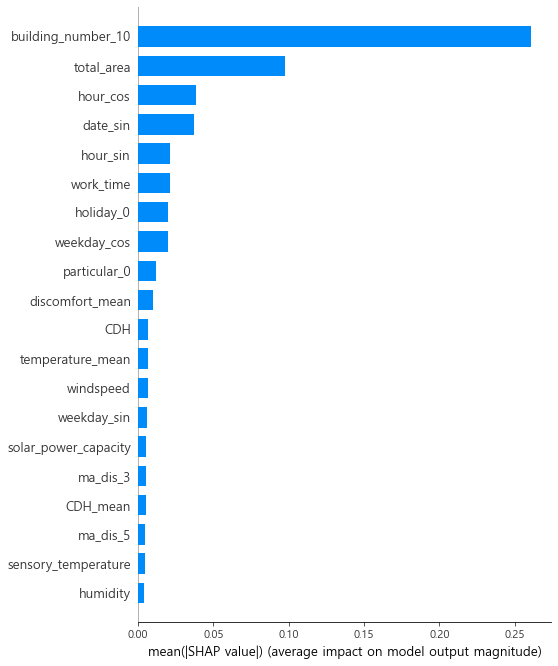

In [91]:
import shap

shap.initjs()

cols = X_0_train.columns
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_0_log,X=X_0_train, test_size=168)

xgbr_0 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_0.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_test,y_test)], eval_metric="logloss")
explainer = shap.TreeExplainer(xgbr_0)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

cluster 1 shap

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[0]	validation_0-logloss:-229.55554
[1]	validation_0-logloss:-232.68379
[2]	validation_0-logloss:-234.30833
[3]	validation_0-logloss:-235.23895
[4]	validation_0-logloss:-235.85402
[5]	validation_0-logloss:-236.24554
[6]	validation_0-logloss:-236.48674
[7]	validation_0-logloss:-236.68517
[8]	validation_0-logloss:-236.79437
[9]	validation_0-logloss:-236.86869
[10]	validation_0-logloss:-236.92174
[11]	validation_0-logloss:-236.96964
[12]	validation_0-logloss:-236.96957
[13]	validation_0-logloss:-236.98887
[14]	validation_0-logloss:-237.00721
[15]	validation_0-logloss:-237.00883
[16]	validation_0-logloss:-237.01316
[17]	validation_0-logloss:-237.01663
[18]	validation_0-logloss:-237.01925
[19]	validation_0-logloss:-237.02646
[20]	validation_0-logloss:-237.02564
[21]	validation_0-logloss:-237.02218
[22]	validation_0-logloss:-237.02080
[23]	validation_0-logloss:-237.02423
[24]	validation_0-logloss:-237.02400
[25]	validation_0-logloss:-237.02289
[26]	validation_0-logloss:-237.01257
[27]	valida

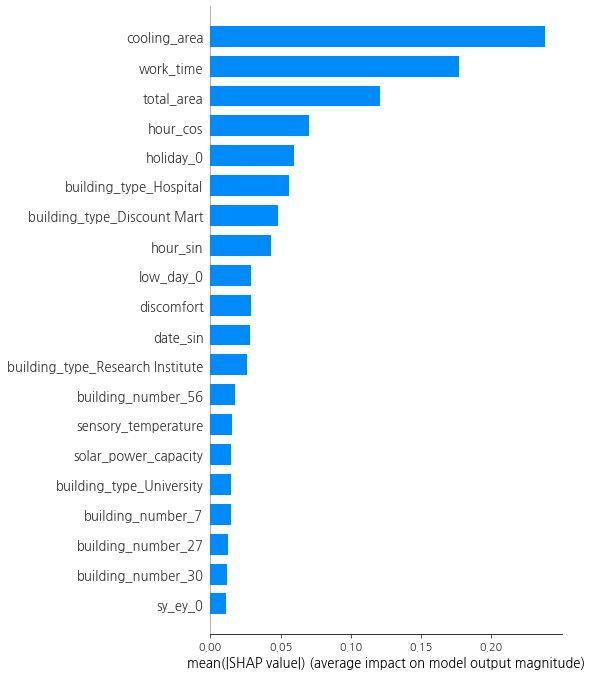

In [27]:
shap.initjs()

cols = X_1_train.columns
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_1_log,X=X_1_train, test_size=168)

xgbr_1 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_1.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_test,y_test)], eval_metric="logloss")
explainer = shap.TreeExplainer(xgbr_1)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [30]:
non_zero_importance_columns_1

['cooling_area',
 'building_type_University',
 'building_number_27',
 'building_type_Research Institute',
 'building_type_Discount Mart',
 'building_type_Hospital',
 'building_number_56',
 'building_number_24',
 'building_number_69',
 'total_area',
 'building_number_7',
 'work_time',
 'building_number_31',
 'building_number_55',
 'building_number_73',
 'building_number_17',
 'building_number_30',
 'building_type_Public',
 'building_number_28',
 'building_number_79',
 'building_number_83',
 'building_number_16',
 'building_number_4',
 'sy_ey_0',
 'low_day_0',
 'ess_capacity',
 'building_number_45',
 'solar_power_capacity',
 'building_number_59',
 'building_number_11',
 'building_number_50',
 'building_number_1',
 'holiday_0',
 'building_number_19',
 'building_number_9',
 'building_number_8',
 'building_type_Knowledge Industry Center',
 'building_number_89',
 'hour_cos',
 'building_number_78',
 'building_number_87',
 'sensory_temperature',
 'discomfort',
 'building_number_57',
 'building

cluster 2 shap

[0]	validation_0-logloss:-254.95955
[1]	validation_0-logloss:-258.47673
[2]	validation_0-logloss:-260.23474
[3]	validation_0-logloss:-261.28185
[4]	validation_0-logloss:-261.93562
[5]	validation_0-logloss:-262.36042
[6]	validation_0-logloss:-262.64080
[7]	validation_0-logloss:-262.84497
[8]	validation_0-logloss:-262.97460
[9]	validation_0-logloss:-263.06173
[10]	validation_0-logloss:-263.12818
[11]	validation_0-logloss:-263.17361
[12]	validation_0-logloss:-263.20664
[13]	validation_0-logloss:-263.22616
[14]	validation_0-logloss:-263.24178
[15]	validation_0-logloss:-263.24968
[16]	validation_0-logloss:-263.26193
[17]	validation_0-logloss:-263.27002
[18]	validation_0-logloss:-263.27466
[19]	validation_0-logloss:-263.27776
[20]	validation_0-logloss:-263.27872
[21]	validation_0-logloss:-263.27977
[22]	validation_0-logloss:-263.28120
[23]	validation_0-logloss:-263.28273
[24]	validation_0-logloss:-263.28726
[25]	validation_0-logloss:-263.28823
[26]	validation_0-logloss:-263.28862
[27]	valida

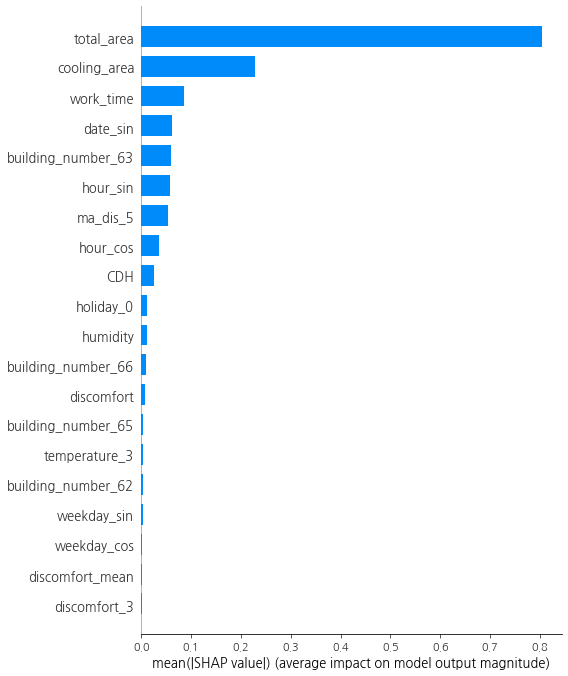

In [28]:
shap.initjs()

cols = X_2_train.columns
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_2_log,X=X_2_train, test_size=168)

xgbr_2 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_2.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_test,y_test)], eval_metric="logloss")
explainer = shap.TreeExplainer(xgbr_2)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

cluster 3 shap

[0]	validation_0-logloss:-215.60285
[1]	validation_0-logloss:-218.68181
[2]	validation_0-logloss:-220.17075
[3]	validation_0-logloss:-221.05513
[4]	validation_0-logloss:-221.63624
[5]	validation_0-logloss:-221.97798
[6]	validation_0-logloss:-222.23067
[7]	validation_0-logloss:-222.36928
[8]	validation_0-logloss:-222.48444
[9]	validation_0-logloss:-222.55149
[10]	validation_0-logloss:-222.59518
[11]	validation_0-logloss:-222.62990
[12]	validation_0-logloss:-222.65548
[13]	validation_0-logloss:-222.67752
[14]	validation_0-logloss:-222.69578
[15]	validation_0-logloss:-222.69052
[16]	validation_0-logloss:-222.69471
[17]	validation_0-logloss:-222.69755
[18]	validation_0-logloss:-222.69948
[19]	validation_0-logloss:-222.69437
[20]	validation_0-logloss:-222.69528
[21]	validation_0-logloss:-222.69635
[22]	validation_0-logloss:-222.69467
[23]	validation_0-logloss:-222.69325
[24]	validation_0-logloss:-222.69141
[25]	validation_0-logloss:-222.68998
[26]	validation_0-logloss:-222.69000
[27]	valida

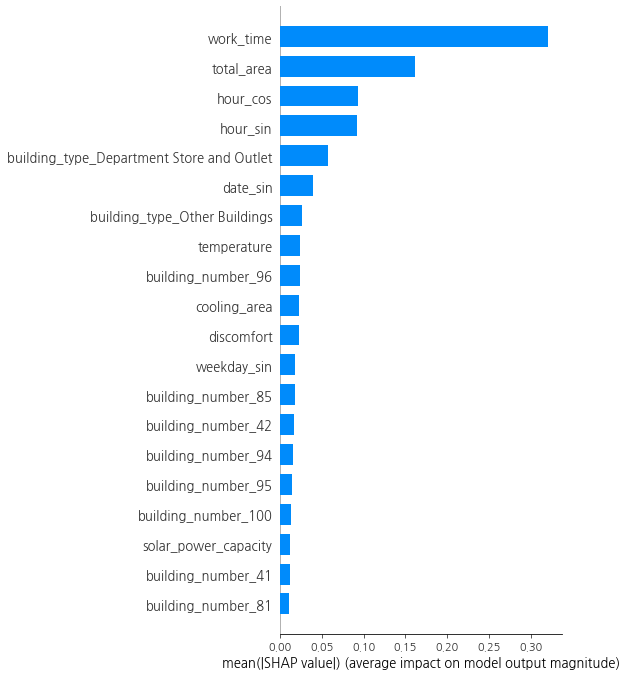

In [29]:
shap.initjs()

cols = X_3_train.columns
y_train, y_test, X_train, X_test = temporal_train_test_split(y=y_3_log,X=X_3_train, test_size=168)

xgbr_3 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_3.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_test,y_test)], eval_metric="logloss")
explainer = shap.TreeExplainer(xgbr_3)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

# cluster 0 feature selection result

1. XGB feature importance zero feature

month_cos, month_sin, date_cos, building_number_13, building_number_14, building_number_15, holiday_1, solar_yes_0, solar_yes_1. sy_en_0

2. XGB RFECV selected feature

['total_area', 'solar_power_capacity', 'ma_dis_3', 'ma_dis_5', 'CDH',
       'temperature_mean', 'discomfort_mean', 'CDH_mean',
       'sensory_temperature', 'hour_sin', 'hour_cos', 'date_sin',
       'weekday_sin', 'weekday_cos', 'work_time', 'building_number_10',
       'holiday_0', 'particular_0']

3. XGB shap

building_number_10, total_area, hour_cos, date_sin, hour_sin, work_time, holiday_0, weekday_cos, particular_0, discomfort_mean, CDH, temperature_mean, windspeed, weekday_sin, solar_power_capacity, ma_dis_3, CDH_mean, ma_dis_5, sensory_temperature, humidity

windspeed, humidity 

# cluster 1 feature selection result

1. XGB feature importance zero feature

['building_number_77', 'air_yes_1.0', 'low_day_1', 'pcs_capacity', 'sy_en_1', 'sy_en_0', 'sy_ey_1', 'date_cos', 'ess_yes_1', 'ess_yes_0', 'solar_yes_1', 'solar_yes_0', 'air_yes_0.0', 'building_number_74', 'holiday_1', 'month_sin', 'month_cos', 'building_number_20', 'building_number_36', 'building_number_47', 'building_number_48', 'building_number_58', 'building_type_Data Center', 'building_number_71', 'building_number_72', 'particular_1']

2. XGB RFECV selected feature

total_area, cooling_area, solar_power_capacity, ess_capacity, discomfort, hour_sin, hour_cos, date_sin, weekday_cos, work_time, building_number_8, building_number_9
11,12,16,17,19,24,25,27,28,29,30,31,45,50,52,53,55,56,57,59,69,70,73,75,76,78,79,80,83,84,86,87,88,89,90,91,92, 상업, 마트, 병원, 지식정보, 대학, holiday_0, sy_ey_0, low_day_0, particular_0

3. XGB shap

RFECV에 포함 안된 sensory_temperature

# cluster 2 feature selection result

1. XGB feature importance zero feature

['building_type_Data Center', 'holiday_1', 'air_yes_0.0', 'building_type_Apartment', 'month_cos', 'building_number_61', 'building_number_34', 'month_sin', 'date_cos', 'air_yes_1.0']

2. XGB RFECV selected feature

['humidity', 'total_area', 'cooling_area', 'discomfort', 'ma_dis_5','CDH',
'hour_sin','hour_cos','date_sin','weekday_sin','weekday_cos','work_time',
'building_number_32','building_number_33','building_number_62','building_number_63',
'building_number_64','building_number_65','building_number_66','building_number_67',
'holiday_0']

3. XGB shap

# cluster 3 feature selection result

1. XGB feature importance zero feature

['building_number_5', 'low_day_1', 'ess_capacity', 'sy_en_1', 'holiday_1', 'sy_en_0', 'ess_yes_1', 'ess_yes_0', 'solar_yes_1', 'solar_yes_0', 'building_type_Knowledge Industry Center', 'building_number_35', 'pcs_capacity', 'building_type_Discount Mart', 'building_type_Data Center', 'building_type_Commercial', 'building_number_3', 'month_cos', 'month_sin', 'date_cos', 'particular_1']

2. XGB RFECV selected feature

['temperature', 'total_area', 'cooling_area', 'solar_power_capacity','hour_sin',
'hour_cos', 'date_sin', 'weekday_sin', 'work_time', 'building_number_2','building_number_6','building_number_37','building_number_38','building_number_39','building_number_40','building_number_41','building_number_42','building_number_43','building_number_44','building_number_54','building_number_81','building_number_85','building_number_94','building_number_95','building_number_96','building_number_97','building_number_98','building_number_99','building_number_100','building_type_Department Store and Outlet','building_type_Other Buildings','holiday_0','low_day_0','particular_0']

3. XGB shap


# 변수 선택 기준

RFECV 으로 뽑힌 변수 & shap value 중 1번에 없는 변수 추가 - 중요도 0 변수
<hr>
cluster 0

['total_area', 'solar_power_capacity', 'ma_dis_3', 'ma_dis_5', 'CDH',
       'temperature_mean', 'discomfort_mean', 'CDH_mean',
       'sensory_temperature', 'hour_sin', 'hour_cos', 'date_sin',
       'weekday_sin', 'weekday_cos', 'work_time', 'building_number_10',
       'holiday_0', 'particular_0', 'windspeed', 'humidity']
<hr>
cluster 1

['total_area', 'cooling_area', 'solar_power_capacity', 'ess_capacity', 'discomfort', 'hour_sin', 'hour_cos', 'date_sin', 'weekday_cos', 'work_time', 'building_number_1', 'building_number_4', 'building_number_7', 'building_number_8', 'building_number_9', 'building_number_11','building_number_12','building_number_16','building_number_17','building_number_19','building_number_24','building_number_25','building_number_27','building_number_28','building_number_29','building_number_30','building_number_31','building_number_45','building_number_50','building_number_52','building_number_53','building_number_55','building_number_56','building_number_57','building_number_59','building_number_69','building_number_70','building_number_73','building_number_75','building_number_76','building_number_78','building_number_79','building_number_80','building_number_83','building_number_84','building_number_86','building_number_87','building_number_88','building_number_89','building_number_90','building_number_91','building_number_92', 'building_type_Commercial', 'building_type_Discount Mart', 'building_type_Hospital', 'building_type_Knowledge Industry Center', 'building_type_Research Institute','building_type_University','building_type_Public', 'holiday_0', 'sy_ey_0', 'low_day_0', 'particular_0','sensory_temperature']

<hr>
cluster 2

['humidity', 'total_area', 'cooling_area', 'discomfort', 'ma_dis_5','CDH', 'hour_sin','hour_cos','date_sin','weekday_sin','weekday_cos','work_time', 'building_number_32','building_number_33','building_number_62','building_number_63', 'building_number_64','building_number_65','building_number_66','building_number_67', 'holiday_0','building_type_Department Store and Outlet']

<hr>
cluster 3

['temperature', 'total_area', 'cooling_area', 'solar_power_capacity','hour_sin',
'hour_cos', 'date_sin', 'weekday_sin', 'work_time', 'building_number_2','building_number_6','building_number_37','building_number_38','building_number_39','building_number_40','building_number_41','building_number_42','building_number_43','building_number_44','building_number_54','building_number_81','building_number_85','building_number_94','building_number_95','building_number_96','building_number_97','building_number_98','building_number_99','building_number_100','building_type_Department Store and Outlet','building_type_Other Buildings','holiday_0','low_day_0','particular_0']


# 모델링 기준

1. XGB 하이퍼파라미터 적용 후 제출

2. 앙상블 (XGB, CAT, RF, SVR, ElasticNet) (각 알고리즘별 하이퍼파라미터 적용) 후 제출

In [35]:
col_0 = ['total_area', 'solar_power_capacity', 'ma_dis_3', 'ma_dis_5', 
                     'CDH', 'temperature_mean', 'discomfort_mean', 'CDH_mean', 
                     'sensory_temperature', 'hour_sin', 'hour_cos', 'date_sin', 
                     'weekday_sin', 'weekday_cos', 'work_time', 'building_number_10',
                     'holiday_0', 'particular_0', 'windspeed', 'humidity']
col_1 = ['total_area', 'cooling_area', 'solar_power_capacity', 'ess_capacity', 'discomfort', 'hour_sin', 'hour_cos', 'date_sin', 'weekday_cos', 'work_time', 'building_number_1', 'building_number_4', 'building_number_7', 'building_number_8', 'building_number_9', 'building_number_11','building_number_12','building_number_16','building_number_17','building_number_19','building_number_24','building_number_25','building_number_27','building_number_28','building_number_29','building_number_30','building_number_31','building_number_45','building_number_50','building_number_52','building_number_53','building_number_55','building_number_56','building_number_57','building_number_59','building_number_69','building_number_70','building_number_73','building_number_75','building_number_76','building_number_78','building_number_79','building_number_80','building_number_83','building_number_84','building_number_86','building_number_87','building_number_88','building_number_89','building_number_90','building_number_91','building_number_92', 'building_type_Commercial', 'building_type_Discount Mart', 'building_type_Hospital', 'building_type_Knowledge Industry Center', 'building_type_Research Institute','building_type_University','building_type_Public', 'holiday_0', 'sy_ey_0', 'low_day_0', 'particular_0', 'sensory_temperature']
col_2 = ['humidity', 'total_area', 'cooling_area', 'discomfort', 'ma_dis_5','CDH', 'hour_sin','hour_cos','date_sin','weekday_sin','weekday_cos','work_time', 'building_number_32','building_number_33','building_number_62','building_number_63', 'building_number_64','building_number_65','building_number_66','building_number_67', 'holiday_0']
col_3 = ['temperature', 'total_area', 'cooling_area', 'solar_power_capacity','hour_sin',
'hour_cos', 'date_sin', 'weekday_sin', 'work_time', 'building_number_2','building_number_6','building_number_37','building_number_38','building_number_39','building_number_40','building_number_41','building_number_42','building_number_43','building_number_44','building_number_54','building_number_81','building_number_85','building_number_94','building_number_95','building_number_96','building_number_97','building_number_98','building_number_99','building_number_100','building_type_Department Store and Outlet','building_type_Other Buildings','holiday_0','low_day_0','particular_0']


In [37]:
X_0_test = X_0_test[col_0]
X_1_test = X_1_test[col_1]
X_2_test = X_2_test[col_2]
X_3_test = X_3_test[col_3]

In [19]:
def smape(true, pred):
    v = 2 * abs(pred - true) / (abs(pred) + abs(true))
    result = np.mean(v) * 100
    return result

In [20]:
## cluster 0 model

from sklearn.model_selection import GridSearchCV

X_0_train = X_0_train[col_0]

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_0_log, X= X_0_train)


params = {
    'learning_rate':[0.01, 0.1],
    'n_estimators': [1000],
    'max_depth': [3,5,7],
    'min_child_weight' : [1,3,5],
    'subsample': [0.5,0.7],
    'colsample_bytree':[0.5, 0.7],
    'objective' : ['reg:squarederror']
}

fit_params={"early_stopping_rounds":42, 
            "eval_metric" : "mae", 
            "eval_set" : [[X_valid, y_valid]]}

gs0_1 = GridSearchCV(estimator=XGBRegressor(), param_grid=params,
                           cv=5, n_jobs=-1, verbose=1)

gs0_1.fit(X_train, y_train, **fit_params)
train_pred = gs0_1.predict(X_valid)
print(f"Train SMAPE: {smape(np.exp(np.array(y_valid)), np.exp(np.array(train_pred)))}")
y_pred_0 = gs0_1.predict(X_0_test)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[0]	validation_0-mae:6.24219
[1]	validation_0-mae:5.59593
[2]	validation_0-mae:4.99515
[3]	validation_0-mae:4.46060
[4]	validation_0-mae:3.94611
[5]	validation_0-mae:3.48356
[6]	validation_0-mae:3.09449
[7]	validation_0-mae:2.71971
[8]	validation_0-mae:2.39318
[9]	validation_0-mae:2.10524
[10]	validation_0-mae:1.82893
[11]	validation_0-mae:1.60123
[12]	validation_0-mae:1.37745
[13]	validation_0-mae:1.20503
[14]	validation_0-mae:1.02260
[15]	validation_0-mae:0.85806


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[16]	validation_0-mae:0.71037
[17]	validation_0-mae:0.58551
[18]	validation_0-mae:0.46517
[19]	validation_0-mae:0.36573
[20]	validation_0-mae:0.28345
[21]	validation_0-mae:0.20079
[22]	validation_0-mae:0.14270
[23]	validation_0-mae:0.10485
[24]	validation_0-mae:0.09223
[25]	validation_0-mae:0.09814
[26]	validation_0-mae:0.11770
[27]	validation_0-mae:0.14885
[28]	validation_0-mae:0.18611
[29]	validation_0-mae:0.22140
[30]	validation_0-mae:0.25568
[31]	validation_0-mae:0.28643
[32]	validation_0-mae:0.31147
[33]	validation_0-mae:0.33548
[34]	validation_0-mae:0.35844
[35]	validation_0-mae:0.37592
[36]	validation_0-mae:0.38957
[37]	validation_0-mae:0.40631
[38]	validation_0-mae:0.42180
[39]	validation_0-mae:0.43396
[40]	validation_0-mae:0.44454
[41]	validation_0-mae:0.45301
[42]	validation_0-mae:0.46209
[43]	validation_0-mae:0.46961
[44]	validation_0-mae:0.47742
[45]	validation_0-mae:0.48226
[46]	validation_0-mae:0.48853
[47]	validation_0-mae:0.49394
[48]	validation_0-mae:0.49883
[49]	valid

In [30]:
## cluster 1 model

from sklearn.model_selection import GridSearchCV

X_1_train = X_1_train[col_1]
X_1_test = X_1_test[col_1]

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_1_log, X= X_1_train)


params = {
    'learning_rate':[0.01, 0.1],
    'n_estimators': [1000],
    'max_depth': [3,5,7],
    'min_child_weight' : [1,3,5],
    'subsample': [0.5,0.7],
    'colsample_bytree':[0.5, 0.7],
    'objective' : ['reg:squarederror']
}

fit_params={"early_stopping_rounds":42, 
            "eval_metric" : "mae", 
            "eval_set" : [[X_valid, y_valid]]}

gs1_1 = GridSearchCV(estimator=XGBRegressor(), param_grid=params,
                          cv=5, n_jobs=-1, verbose=1)

gs1_1.fit(X_train, y_train, **fit_params)
train_pred = gs1_1.predict(X_valid)
print(f"Train SMAPE: {smape(np.exp(np.array(y_valid)), np.exp(np.array(train_pred)))}")
y_pred_1 = gs1_1.predict(X_1_test)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[0]	validation_0-mae:6.01489
[1]	validation_0-mae:5.38255


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[2]	validation_0-mae:4.81463
[3]	validation_0-mae:4.31027
[4]	validation_0-mae:3.85366
[5]	validation_0-mae:3.43579
[6]	validation_0-mae:3.06897
[7]	validation_0-mae:2.72047
[8]	validation_0-mae:2.42131
[9]	validation_0-mae:2.14626
[10]	validation_0-mae:1.90988
[11]	validation_0-mae:1.69009
[12]	validation_0-mae:1.49205
[13]	validation_0-mae:1.31819
[14]	validation_0-mae:1.16250
[15]	validation_0-mae:1.02210
[16]	validation_0-mae:0.89762
[17]	validation_0-mae:0.79154
[18]	validation_0-mae:0.70608
[19]	validation_0-mae:0.62904
[20]	validation_0-mae:0.56668
[21]	validation_0-mae:0.51677
[22]	validation_0-mae:0.47590
[23]	validation_0-mae:0.44422
[24]	validation_0-mae:0.41825
[25]	validation_0-mae:0.40147
[26]	validation_0-mae:0.38837
[27]	validation_0-mae:0.37932
[28]	validation_0-mae:0.37568
[29]	validation_0-mae:0.37137
[30]	validation_0-mae:0.37120
[31]	validation_0-mae:0.37145
[32]	validation_0-mae:0.37023
[33]	validation_0-mae:0.37216
[34]	validation_0-mae:0.37153
[35]	validation_0-

ValueError: Feature shape mismatch, expected: 64, got 66

In [33]:
X_1_test = X_1_test[col_1]
y_pred_1 = gs1_1.predict(X_1_test)

In [36]:
## cluster 2 model

from sklearn.model_selection import GridSearchCV

X_2_train = X_2_train[col_2]

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_2_log, X= X_2_train)


params = {
    'learning_rate':[0.01, 0.1],
    'n_estimators': [1000],
    'max_depth': [3,5,7],
    'min_child_weight' : [1,3,5],
    'subsample': [0.5,0.7],
    'colsample_bytree':[0.5, 0.7],
    'objective' : ['reg:squarederror']
}

fit_params={"early_stopping_rounds":42, 
            "eval_metric" : "mae", 
            "eval_set" : [[X_valid, y_valid]]}

gs2_1 = GridSearchCV(estimator=XGBRegressor(), param_grid=params,
                          cv=5, n_jobs=-1, verbose=1)


gs2_1.fit(X_train, y_train, **fit_params)
train_pred = gs2_1.predict(X_valid)
print(f"Train SMAPE: {smape(np.exp(np.array(y_valid)), np.exp(np.array(train_pred)))}")
y_pred_2 = gs2_1.predict(X_2_test)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[0]	validation_0-mae:5.96202
[1]	validation_0-mae:5.34056
[2]	validation_0-mae:4.79528
[3]	validation_0-mae:4.32195
[4]	validation_0-mae:3.87669


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[5]	validation_0-mae:3.48288
[6]	validation_0-mae:3.17150
[7]	validation_0-mae:2.85364
[8]	validation_0-mae:2.56264
[9]	validation_0-mae:2.33448
[10]	validation_0-mae:2.09563
[11]	validation_0-mae:1.90645
[12]	validation_0-mae:1.70437
[13]	validation_0-mae:1.53500
[14]	validation_0-mae:1.37929
[15]	validation_0-mae:1.26279
[16]	validation_0-mae:1.13916
[17]	validation_0-mae:1.04083
[18]	validation_0-mae:0.93579
[19]	validation_0-mae:0.86038
[20]	validation_0-mae:0.78965
[21]	validation_0-mae:0.71571
[22]	validation_0-mae:0.66579
[23]	validation_0-mae:0.62767
[24]	validation_0-mae:0.59309
[25]	validation_0-mae:0.56921
[26]	validation_0-mae:0.54234
[27]	validation_0-mae:0.51846
[28]	validation_0-mae:0.49881
[29]	validation_0-mae:0.48748
[30]	validation_0-mae:0.48286
[31]	validation_0-mae:0.47323
[32]	validation_0-mae:0.46829
[33]	validation_0-mae:0.46290
[34]	validation_0-mae:0.45998
[35]	validation_0-mae:0.45799
[36]	validation_0-mae:0.46360
[37]	validation_0-mae:0.45672
[38]	validation

ValueError: Feature shape mismatch, expected: 21, got 41

In [38]:
y_pred_2 = gs2_1.predict(X_2_test)

In [39]:
## cluster 3 model

from sklearn.model_selection import GridSearchCV

X_3_train = X_3_train[col_3]

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_3_log, X= X_3_train)


params = {
    'learning_rate':[0.01, 0.1],
    'n_estimators': [1000],
    'max_depth': [3,5,7],
    'min_child_weight' : [1,3,5],
    'subsample': [0.5,0.7],
    'colsample_bytree':[0.5, 0.7],
    'objective' : ['reg:squarederror']
}

fit_params={"early_stopping_rounds":42, 
            "eval_metric" : "mae", 
            "eval_set" : [[X_valid, y_valid]]}

gs3_1 = GridSearchCV(estimator=XGBRegressor(), param_grid=params,
                          cv=5, n_jobs=-1, verbose=1)

gs3_1.fit(X_train, y_train, **fit_params)
train_pred = gs3_1.predict(X_valid)
print(f"Train SMAPE: {smape(np.exp(np.array(y_valid)), np.exp(np.array(train_pred)))}")
y_pred_3 = gs3_1.predict(X_3_test)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[0]	validation_0-mae:6.52018
[1]	validation_0-mae:6.45059
[2]	validation_0-mae:6.38262
[3]	validation_0-mae:6.31389
[4]	validation_0-mae:6.24690
[5]	validation_0-mae:6.18094
[6]	validation_0-mae:6.11530
[7]	validation_0-mae:6.04944
[8]	validation_0-mae:5.98618
[9]	validation_0-mae:5.92206
[10]	validation_0-mae:5.85936
[11]	validation_0-mae:5.79781
[12]	validation_0-mae:5.73600
[13]	validation_0-mae:5.67462
[14]	validation_0-mae:5.61338
[15]	validation_0-mae:5.55356
[16]	validation_0-mae:5.49304
[17]	validation_0-mae:5.43585
[18]	validation_0-mae:5.37763
[19]	validation_0-mae:5.32222
[20]	validation_0-mae:5.26584
[21]	validation_0-mae:5.20945
[22]	validation_0-mae:5.15395
[23]	validation_0-mae:5.09867
[24]	validation_0-mae:5.04536
[25]	validation_0-mae:4.98951
[26]	validation_0-mae:4.93728
[27]	validation_0-mae:4.88481
[28]	validation_0-mae:4.83133
[29]	validation_0-mae:4.77898
[30]	validation_0-mae:4.72851
[31]	validation_0-

[266]	validation_0-mae:0.32819
[267]	validation_0-mae:0.32812
[268]	validation_0-mae:0.32795
[269]	validation_0-mae:0.32801
[270]	validation_0-mae:0.32804
[271]	validation_0-mae:0.32821
[272]	validation_0-mae:0.32840
[273]	validation_0-mae:0.32869
[274]	validation_0-mae:0.32890
[275]	validation_0-mae:0.32920
[276]	validation_0-mae:0.32953
[277]	validation_0-mae:0.32994
[278]	validation_0-mae:0.33052
[279]	validation_0-mae:0.33114
[280]	validation_0-mae:0.33160
[281]	validation_0-mae:0.33227
[282]	validation_0-mae:0.33293
[283]	validation_0-mae:0.33357
[284]	validation_0-mae:0.33449
[285]	validation_0-mae:0.33521
[286]	validation_0-mae:0.33621
[287]	validation_0-mae:0.33703
[288]	validation_0-mae:0.33801
[289]	validation_0-mae:0.33886
[290]	validation_0-mae:0.33990
[291]	validation_0-mae:0.34097
[292]	validation_0-mae:0.34216
[293]	validation_0-mae:0.34326
[294]	validation_0-mae:0.34442
[295]	validation_0-mae:0.34562
[296]	validation_0-mae:0.34677
[297]	validation_0-mae:0.34803
[298]	va

In [40]:
result = []
result.append(np.exp(np.array(y_pred_0)))
result.append(np.exp(np.array(y_pred_1)))
result.append(np.exp(np.array(y_pred_2)))
result.append(np.exp(np.array(y_pred_3)))
result = np.concatenate(result)
sub = pd.read_csv('./data/sample_submission.csv',encoding='cp949')
sub['answer'] = result
sub.to_csv('./submission/clustering_v01.csv',encoding='cp949',index=False)

# (08.17)결과가 매우 안좋았기에 범주형 변수 빌딩타입만 one-hot encoding 하고 진행해볼 것

In [2]:
from sklearn.preprocessing import LabelEncoder

train = pd.read_csv('./data/train_0812.csv', encoding='cp949')
train.solar_yes = train.solar_yes.astype(int)
train.ess_yes = train.ess_yes.astype(int)
train.sy_ey = train.sy_ey.astype(int)
train.sy_en = train.sy_en.astype(int)

# train.drop(['building_number','date_time','building_type'])

train['hour_sin'] = np.sin(2 * np.pi * train['hour']/23.0)
train['hour_cos'] = np.cos(2 * np.pi * train['hour']/23.0)

train['date_sin'] = -np.sin(2 * np.pi * (train['month']+train['day']/31)/12)
train['date_cos'] = -np.cos(2 * np.pi * (train['month']+train['day']/31)/12)

train['month_sin'] = -np.sin(2 * np.pi * train['month']/12.0)
train['month_cos'] = -np.cos(2 * np.pi * train['month']/12.0)
## cyclic transformation on weekday
train['weekday_sin'] = -np.sin(2 * np.pi * (train['weekday']+1)/7.0)
train['weekday_cos'] = -np.cos(2 * np.pi * (train['weekday']+1)/7.0)


train['work_time'] = 0
train['low_day'] = 0
train['particular'] = 0
trains = [train[train.building_number == num] for num in range(1,101,1)]
# aa = trains[9]
# aa['work_time']  = (aa['hour'].isin([6,7,8])).astype(int)
# aa.describe()

## cluster 0
for num in [10,13]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7,8])).astype(int)
    
    trains[num-1] = temp_df
for num in [14]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7])).astype(int)
    temp_df['particular'] = temp_df['hour'].isin([0,8,12,18]).astype(int)
    trains[num-1] = temp_df
for num in [15]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([4,5,6,7,8])).astype(int)
    trains[num-1] = temp_df

## cluster 1
for num in [17,18,19,21,22,69,70,72]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [26,28,76,78,80,82,83,84]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [71]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)*(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = (((temp_df['weekday']==5)&(temp_df['hour'].isin([10,11,13,14])))
                               |((temp_df['weekday'].isin([0,1,2,3,4,5]))&(temp_df['hour'].isin([0,1,2,3,4])))).astype(int)
    trains[num-1] = temp_df
for num in [53]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=4)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [55]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=19)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [50]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [56]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = ((temp_df['weekday']==2)&(temp_df['hour']==16)).astype(int)
    trains[num-1] = temp_df
for num in [60]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [20,23]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [58,59,77]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [27,74,79]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [57]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [24,25]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [29,30]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [31]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [50]:
    temp_df = trains[num-1]
    temp_df['particular'] = (((temp_df['weekday']==2)&(temp_df['hour']==16))|((temp_df['weekday']==2)&(temp_df['hour']==16))).astype(int)
    trains[num-1] = temp_df
for num in [1]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [8]:
    temp_df = trains[num-1]
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [12]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [88,90]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    trains[num-1] = temp_df
for num in [86]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    temp_df['particular'] = ((temp_df['month']==6)&(temp_df['day']==26)).astype(int)
    trains[num-1] = temp_df
for num in [87,89,91]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=9)).astype(int)
    trains[num-1] = temp_df
for num in [4]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    trains[num-1] = temp_df
for num in [7,16]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=5)).astype(int)
    trains[num-1] = temp_df
for num in [9]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=23)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [11]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [36]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    trains[num-1] = temp_df
for num in [75]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=15)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [92]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=6)).astype(int)
    trains[num-1] = temp_df

## cluster 2
for num in [32,33,34]:
    temp_df = trains[num-1]
    temp_df = temp_df[temp_df.month>=7]
    trains[num-1] = temp_df
for num in [61,65,66,67,68]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df
for num in [62,63,64]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df

## cluster 3
for num in [93,94,96,97,98,100]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=6)&(temp_df['hour']<=22)).astype(int)
    trains[num-1] = temp_df
for num in [42,43,44]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=20)).astype(int)
    trains[num-1] = temp_df
for num in [2,85,99]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [38,40,95]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=20)).astype(int)
    trains[num-1] = temp_df
for num in [3,81]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [6,41]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=22)).astype(int)
    trains[num-1] = temp_df
for num in [37,39]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [35]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df
for num in [54]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=5)&(temp_df['hour']<=20)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==0).astype(int)
    trains[num-1] = temp_df
for num in [5]:
    temp_df = trains[num-1]
    temp_df['particular'] = (((temp_df['weekday']==4)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==5)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==6)&(temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18])))).astype(int)
    trains[num-1] = temp_df
    

df = pd.concat(trains, ignore_index=True)
df = df.drop(['date_time','hour','day','month','weekday','date'], axis=1)
df.building_type = df.building_type.astype('category')



df_0 = df[df.km_cluster==0]
df_1 = df[df.km_cluster==1]
df_2 = df[df.km_cluster==2]
df_3 = df[df.km_cluster==3]

df_0 = pd.get_dummies(df_0)
df_1 = pd.get_dummies(df_1)
df_2 = pd.get_dummies(df_2)
df_3 = pd.get_dummies(df_3)


X_0 = df_0.drop('power_consumption', axis=1)
y_0 = df_0['power_consumption']
y_0_log = np.log(y_0)
X_0_train = X_0.drop('km_cluster', axis=1)

X_1 = df_1.drop('power_consumption', axis=1)
y_1 = df_1['power_consumption']
y_1_log = np.log(y_1)
X_1_train = X_1.drop('km_cluster', axis=1)

X_2 = df_2.drop('power_consumption', axis=1)
y_2 = df_2['power_consumption']
y_2_log = np.log(y_2)
X_2_train = X_2.drop('km_cluster', axis=1)

X_3 = df_3.drop('power_consumption', axis=1)
y_3 = df_3['power_consumption']
y_3_log = np.log(y_3)
X_3_train = X_3.drop('km_cluster', axis=1)


# Standard Scaling for continuous data
con_li = ['hour_sin', 'hour_cos', 'date_sin', 'date_cos', 'month_sin', 'month_cos', 'weekday_sin', 'weekday_cos', 'temperature', 'windspeed', 
'humidity', 'total_area', 'cooling_area', 'solar_power_capacity', 'ess_capacity', 'pcs_capacity', 'discomfort', 'temperature_3', 
'discomfort_3', 'ma_dis_3', 'ma_dis_5', 'CDH', 'temperature_mean', 'discomfort_mean', 'CDH_mean', 'sensory_temperature']

# ## one-hot encoding for categorical data
cat_li = ['building_number','holiday','air_yes','solar_yes',
         'ess_yes','sy_ey','sy_en','low_day','particular']


for col in con_li :
    if X_0_train[col].std() == 0:
        X_0_train = X_0_train.drop(col, axis=1)
    else :
        X_0_train[col] = (X_0_train[col] - X_0_train[col].mean())/X_0_train[col].std()
        
for col in cat_li :
    if X_0_train[col].nunique() == 1:        
        X_0_train_train = X_0_train.drop(col,axis=1)

for col in con_li :
    if X_1_train[col].std() == 0:
        X_1_train = X_1_train.drop(col, axis=1)
    else :
        X_1_train[col] = (X_1_train[col] - X_1_train[col].mean())/X_1_train[col].std()
        
for col in cat_li :
    if X_1_train[col].nunique() == 1:
        X_1_train = X_1_train.drop(col,axis=1)


for col in con_li :
    if X_2_train[col].std() == 0:
        X_2_train = X_2_train.drop(col, axis=1)
    else :
        X_2_train[col] = (X_2_train[col] - X_2_train[col].mean())/X_2_train[col].std()
        
for col in cat_li :
    if X_2_train[col].nunique() == 1:
        X_2_train = X_2_train.drop(col,axis=1)

for col in con_li :
    if X_3_train[col].std() == 0:
        X_3_train = X_3_train.drop(col, axis=1)
    else :
        X_3_train[col] = (X_3_train[col] - X_3_train[col].mean())/X_3_train[col].std()
        
for col in cat_li :
    if X_3_train[col].nunique() == 1:
        X_3_train = X_3_train.drop(col,axis=1)

train = pd.read_csv('./data/train_0812.csv', encoding='cp949')
test = pd.read_csv('./data/test_0812.csv', encoding='cp949')
cluster_dict = train.groupby('building_number')['km_cluster'].first().to_dict()
test['km_cluster'] = test['building_number'].map(cluster_dict)

test.solar_yes = test.solar_yes.astype(int)
test.ess_yes = test.ess_yes.astype(int)
test.sy_ey = test.sy_ey.astype(int)
test.sy_en = test.sy_en.astype(int)

# test.drop(['building_number','date_time','building_type'])

test['hour_sin'] = np.sin(2 * np.pi * test['hour']/23.0)
test['hour_cos'] = np.cos(2 * np.pi * test['hour']/23.0)

test['date_sin'] = -np.sin(2 * np.pi * (test['month']+test['day']/31)/12)
test['date_cos'] = -np.cos(2 * np.pi * (test['month']+test['day']/31)/12)

test['month_sin'] = -np.sin(2 * np.pi * test['month']/12.0)
test['month_cos'] = -np.cos(2 * np.pi * test['month']/12.0)
## cyclic transformation on weekday
test['weekday_sin'] = -np.sin(2 * np.pi * (test['weekday']+1)/7.0)
test['weekday_cos'] = -np.cos(2 * np.pi * (test['weekday']+1)/7.0)


test['work_time'] = 0
test['low_day'] = 0
test['particular'] = 0
tests = [test[test.building_number == num] for num in range(1,101,1)]
# aa = tests[9]
# aa['work_time']  = (aa['hour'].isin([6,7,8])).astype(int)
# aa.describe()

## cluster 0
for num in [10,13]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7,8])).astype(int)
    
    tests[num-1] = temp_df
for num in [14]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7])).astype(int)
    temp_df['particular'] = temp_df['hour'].isin([0,8,12,18]).astype(int)
    tests[num-1] = temp_df
for num in [15]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([4,5,6,7,8])).astype(int)
    tests[num-1] = temp_df

## cluster 1
for num in [17,18,19,21,22,69,70,72]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [26,28,76,78,80,82,83,84]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [71]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)*(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = (((temp_df['weekday']==5)&(temp_df['hour'].isin([10,11,13,14])))
                               |((temp_df['weekday'].isin([0,1,2,3,4,5]))&(temp_df['hour'].isin([0,1,2,3,4])))).astype(int)
    tests[num-1] = temp_df
for num in [53]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=4)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [55]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=19)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [50]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [56]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = ((temp_df['weekday']==2)&(temp_df['hour']==16)).astype(int)
    tests[num-1] = temp_df
for num in [60]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [20,23]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [58,59,77]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [27,74,79]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [57]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [24,25]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [29,30]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [31]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [50]:
    temp_df = tests[num-1]
    temp_df['particular'] = (((temp_df['weekday']==2)&(temp_df['hour']==16))|((temp_df['weekday']==2)&(temp_df['hour']==16))).astype(int)
    tests[num-1] = temp_df
for num in [1]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [8]:
    temp_df = tests[num-1]
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [12]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [88,90]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    tests[num-1] = temp_df
for num in [86]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    temp_df['particular'] = ((temp_df['month']==6)&(temp_df['day']==26)).astype(int)
    tests[num-1] = temp_df
for num in [87,89,91]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=9)).astype(int)
    tests[num-1] = temp_df
for num in [4]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    tests[num-1] = temp_df
for num in [7,16]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=5)).astype(int)
    tests[num-1] = temp_df
for num in [9]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=23)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [11]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [36]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    tests[num-1] = temp_df
for num in [75]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=15)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [92]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=6)).astype(int)
    tests[num-1] = temp_df

## cluster 2
for num in [32,33,34]:
    temp_df = tests[num-1]
    temp_df = temp_df[temp_df.month>=7]
    tests[num-1] = temp_df
for num in [61,65,66,67,68]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df
for num in [62,63,64]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df

## cluster 3
for num in [93,94,96,97,98,100]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=6)&(temp_df['hour']<=22)).astype(int)
    tests[num-1] = temp_df
for num in [42,43,44]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=20)).astype(int)
    tests[num-1] = temp_df
for num in [2,85,99]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [38,40,95]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=20)).astype(int)
    tests[num-1] = temp_df
for num in [3,81]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [6,41]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=22)).astype(int)
    tests[num-1] = temp_df
for num in [37,39]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [35]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df
for num in [54]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=5)&(temp_df['hour']<=20)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==0).astype(int)
    tests[num-1] = temp_df
for num in [5]:
    temp_df = tests[num-1]
    temp_df['particular'] = (((temp_df['weekday']==4)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==5)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==6)&(temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18])))).astype(int)
    tests[num-1] = temp_df
    

df = pd.concat(tests, ignore_index=True)
df = df.drop(['date_time','hour','day','month','weekday','date'], axis=1)
df.building_type = df.building_type.astype('category')

df_0 = df[df.km_cluster==0]
df_1 = df[df.km_cluster==1]
df_2 = df[df.km_cluster==2]
df_3 = df[df.km_cluster==3]

df_0 = pd.get_dummies(df_0)
df_1 = pd.get_dummies(df_1)
df_2 = pd.get_dummies(df_2)
df_3 = pd.get_dummies(df_3)

X_0 = df_0.drop('km_cluster', axis=1)
X_1 = df_1.drop('km_cluster', axis=1)
X_2 = df_2.drop('km_cluster', axis=1)
X_3 = df_3.drop('km_cluster', axis=1)


# Standard Scaling for continuous data
con_li = ['hour_sin', 'hour_cos', 'date_sin', 'date_cos', 'month_sin', 'month_cos', 'weekday_sin', 'weekday_cos', 'temperature', 'windspeed', 
'humidity', 'total_area', 'cooling_area', 'solar_power_capacity', 'ess_capacity', 'pcs_capacity', 'discomfort', 'temperature_3', 
'discomfort_3', 'ma_dis_3', 'ma_dis_5', 'CDH', 'temperature_mean', 'discomfort_mean', 'CDH_mean', 'sensory_temperature']


cat_li = ['building_number','holiday','air_yes','solar_yes',
         'ess_yes','sy_ey','sy_en','low_day','particular']


for col in con_li :
    if X_0[col].std() == 0:
        X_0 = X_0.drop(col, axis=1)
    else :
        X_0[col] = (X_0[col] - X_0[col].mean())/X_0[col].std()
        
for col in cat_li :
    if X_0[col].nunique() == 1:        
        X_0 = X_0.drop(col,axis=1)
X_0_test = X_0

for col in con_li :
    if X_1[col].std() == 0:
        X_1 = X_1.drop(col, axis=1)
    else :
        X_1[col] = (X_1[col] - X_1[col].mean())/X_1[col].std()
        
for col in cat_li :
    if X_1[col].nunique() == 1:
        X_1 = X_1.drop(col,axis=1)
X_1_test = X_1

for col in con_li :
    if X_2[col].std() == 0:
        X_2 = X_2.drop(col, axis=1)
    else :
        X_2[col] = (X_2[col] - X_2[col].mean())/X_2[col].std()
        
for col in cat_li :
    if X_2[col].nunique() == 1:
        X_2 = X_2.drop(col,axis=1)
X_2_test = X_2
for col in con_li :
    if X_3[col].std() == 0:
        X_3 = X_3.drop(col, axis=1)
    else :
        X_3[col] = (X_3[col] - X_3[col].mean())/X_3[col].std()
        
for col in cat_li :
    if X_3[col].nunique() == 1:
        X_3 = X_3.drop(col,axis=1)
X_3_test = X_3


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [50]:
c0=[10,13,14,15]
c1=[1,4,7,8,9,11,12,16,17,18,19,20,21,22,23,24,25,
26,27,28,29,30,31,36,45,46,47,48,49,50,51,52,53,55,
56,57,58,59,60,69,70,71,72,73,74,75,76,77,78,79,80,
82,83,84,86,87,88,89,90,91,92]
c2=[32,33,34,61,62,63,64,65,66,67,68]
c3=[2,3,5,6,35,37,38,39,40,41,42,43,44,
54,81,85,93,94,95,96,97,98,99,100]

In [74]:
from sklearn.model_selection import train_test_split

cols = X_0_train.columns
X_train, X_valid, y_train, y_valid = train_test_split(X_0_train, y_0_log)

xgbr_0 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_0.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_0.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-256.88960
[1]	validation_0-logloss:-260.38998
[2]	validation_0-logloss:-262.14675
[3]	validation_0-logloss:-263.17644
[4]	validation_0-logloss:-263.82340
[5]	validation_0-logloss:-264.24634
[6]	validation_0-logloss:-264.52818
[7]	validation_0-logloss:-264.71940
[8]	validation_0-logloss:-264.85090
[9]	validation_0-logloss:-264.94171
[10]	validation_0-logloss:-265.00485
[11]	validation_0-logloss:-265.04878
[12]	validation_0-logloss:-265.07956
[13]	validation_0-logloss:-265.10125
[14]	validation_0-logloss:-265.11628
[15]	validation_0-logloss:-265.12672
[16]	validation_0-logloss:-265.13421
[17]	validation_0-logloss:-265.13913
[18]	validation_0-logloss:-265.14235
[19]	validation_0-logloss:-265.14497
[20]	validation_0-logloss:-265.14666


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[21]	validation_0-logloss:-265.14789
[22]	validation_0-logloss:-265.14875
[23]	validation_0-logloss:-265.14930
[24]	validation_0-logloss:-265.14973
[25]	validation_0-logloss:-265.14993
[26]	validation_0-logloss:-265.15013
[27]	validation_0-logloss:-265.15026
[28]	validation_0-logloss:-265.15070
[29]	validation_0-logloss:-265.15082
[30]	validation_0-logloss:-265.15071
[31]	validation_0-logloss:-265.15094
[32]	validation_0-logloss:-265.15093
[33]	validation_0-logloss:-265.15093
[34]	validation_0-logloss:-265.15093
[35]	validation_0-logloss:-265.15089
[36]	validation_0-logloss:-265.15092
[37]	validation_0-logloss:-265.15095
[38]	validation_0-logloss:-265.15095
[39]	validation_0-logloss:-265.15099
[40]	validation_0-logloss:-265.15085
[41]	validation_0-logloss:-265.15080
[42]	validation_0-logloss:-265.15071
[43]	validation_0-logloss:-265.15070
[44]	validation_0-logloss:-265.15085
[45]	validation_0-logloss:-265.15084
[46]	validation_0-logloss:-265.15085
[47]	validation_0-logloss:-265.15089
[

,feature,importances
0,building_number,0.602388
1,work_time,0.155536
2,particular,0.049556
3,date_sin,0.025969
4,hour_cos,0.024539
5,holiday,0.022281
6,weekday_cos,0.019408
7,hour_sin,0.012803
8,solar_power_capacity,0.012525
9,discomfort_mean,0.009080


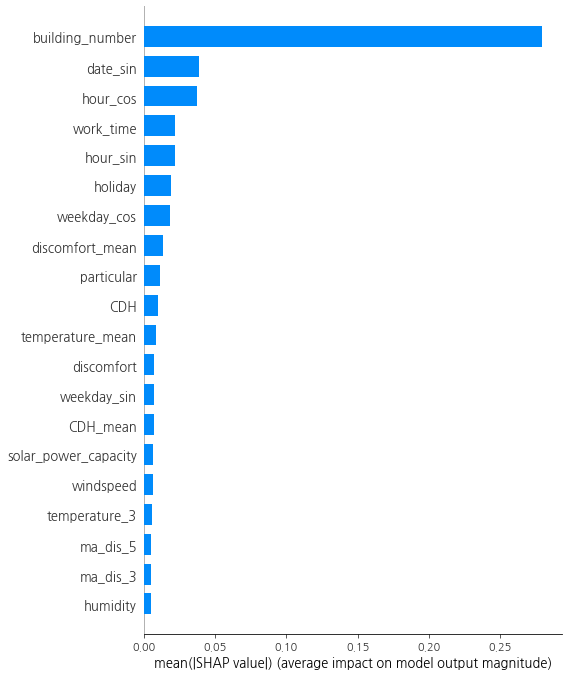

In [75]:
import shap

shap.initjs()

explainer = shap.TreeExplainer(xgbr_0)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [95]:
cols = X_1_train.columns
X_train, X_valid, y_train, y_valid = train_test_split(X_1_train, y_1_log)

xgbr_1 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_1.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_1.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-248.99358


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[1]	validation_0-logloss:-252.38778
[2]	validation_0-logloss:-254.09529
[3]	validation_0-logloss:-255.09554
[4]	validation_0-logloss:-255.72574
[5]	validation_0-logloss:-256.13715
[6]	validation_0-logloss:-256.41259
[7]	validation_0-logloss:-256.59982
[8]	validation_0-logloss:-256.72846
[9]	validation_0-logloss:-256.81727
[10]	validation_0-logloss:-256.87881
[11]	validation_0-logloss:-256.92157
[12]	validation_0-logloss:-256.95130
[13]	validation_0-logloss:-256.97223
[14]	validation_0-logloss:-256.98667
[15]	validation_0-logloss:-256.99677
[16]	validation_0-logloss:-257.00387
[17]	validation_0-logloss:-257.00884
[18]	validation_0-logloss:-257.01233
[19]	validation_0-logloss:-257.01474
[20]	validation_0-logloss:-257.01630
[21]	validation_0-logloss:-257.01743
[22]	validation_0-logloss:-257.01816
[23]	validation_0-logloss:-257.01870
[24]	validation_0-logloss:-257.01913
[25]	validation_0-logloss:-257.01933
[26]	validation_0-logloss:-257.01957
[27]	validation_0-logloss:-257.01967
[28]	valid

,feature,importances
0,cooling_area,0.188966
1,work_time,0.158816
2,building_type_University,0.107084
3,total_area,0.073377
4,building_type_Hospital,0.071773
5,building_type_Research Institute,0.062395
6,building_number,0.057398
7,sy_ey,0.051089
8,low_day,0.045598
9,building_type_Commercial,0.034792


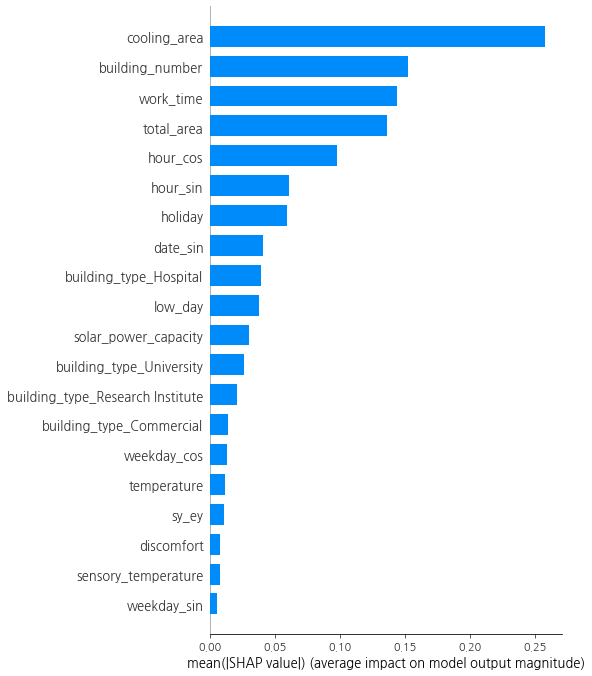

In [96]:
shap.initjs()

explainer = shap.TreeExplainer(xgbr_1)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [97]:
cols = X_2_train.columns
X_train, X_valid, y_train, y_valid = train_test_split(X_2_train, y_2_log)

xgbr_2 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_2.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_2.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-239.79552
[1]	validation_0-logloss:-243.06429
[2]	validation_0-logloss:-244.71117
[3]	validation_0-logloss:-245.67701
[4]	validation_0-logloss:-246.28550
[5]	validation_0-logloss:-246.68293
[6]	validation_0-logloss:-246.94982
[7]	validation_0-logloss:-247.13057
[8]	validation_0-logloss:-247.25489
[9]	validation_0-logloss:-247.34076


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[10]	validation_0-logloss:-247.40043
[11]	validation_0-logloss:-247.44175
[12]	validation_0-logloss:-247.47069
[13]	validation_0-logloss:-247.49095
[14]	validation_0-logloss:-247.50488
[15]	validation_0-logloss:-247.51496
[16]	validation_0-logloss:-247.52183
[17]	validation_0-logloss:-247.52671
[18]	validation_0-logloss:-247.53013
[19]	validation_0-logloss:-247.53260
[20]	validation_0-logloss:-247.53422
[21]	validation_0-logloss:-247.53530
[22]	validation_0-logloss:-247.53624
[23]	validation_0-logloss:-247.53682
[24]	validation_0-logloss:-247.53728
[25]	validation_0-logloss:-247.53759
[26]	validation_0-logloss:-247.53780
[27]	validation_0-logloss:-247.53802
[28]	validation_0-logloss:-247.53805
[29]	validation_0-logloss:-247.53807
[30]	validation_0-logloss:-247.53812
[31]	validation_0-logloss:-247.53808
[32]	validation_0-logloss:-247.53813
[33]	validation_0-logloss:-247.53815
[34]	validation_0-logloss:-247.53821
[35]	validation_0-logloss:-247.53820
[36]	validation_0-logloss:-247.53818
[

,feature,importances
0,building_number,0.667426
1,total_area,0.152482
2,work_time,0.064738
3,cooling_area,0.043517
4,ma_dis_5,0.020251
5,hour_cos,0.012803
6,hour_sin,0.010587
7,date_sin,0.009974
8,holiday,0.008029
9,CDH,0.003220


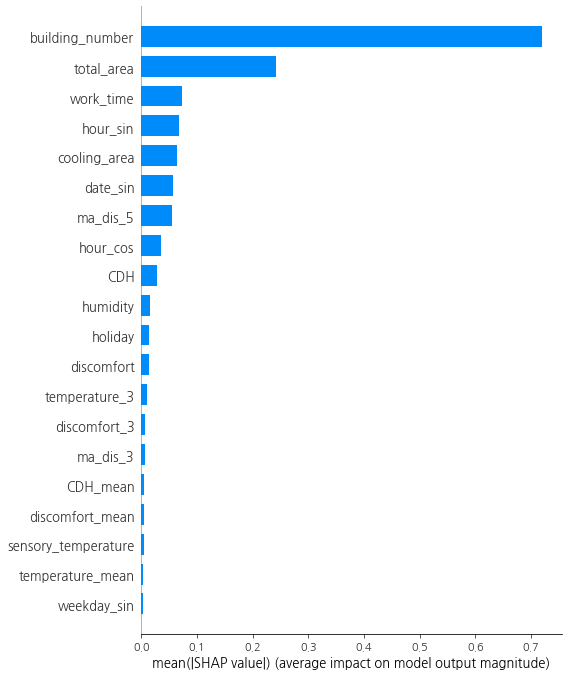

In [98]:
shap.initjs()

explainer = shap.TreeExplainer(xgbr_2)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [99]:
cols = X_3_train.columns
X_train, X_valid, y_train, y_valid = train_test_split(X_3_train, y_3_log)

xgbr_3 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_3.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_3.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-239.92774
[1]	validation_0-logloss:-243.19888
[2]	validation_0-logloss:-244.84587
[3]	validation_0-logloss:-245.81352


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[4]	validation_0-logloss:-246.42208
[5]	validation_0-logloss:-246.81988
[6]	validation_0-logloss:-247.08627
[7]	validation_0-logloss:-247.26696
[8]	validation_0-logloss:-247.39081
[9]	validation_0-logloss:-247.47634
[10]	validation_0-logloss:-247.53578
[11]	validation_0-logloss:-247.57695
[12]	validation_0-logloss:-247.60572
[13]	validation_0-logloss:-247.62586
[14]	validation_0-logloss:-247.63966
[15]	validation_0-logloss:-247.64936
[16]	validation_0-logloss:-247.65607
[17]	validation_0-logloss:-247.66083
[18]	validation_0-logloss:-247.66420
[19]	validation_0-logloss:-247.66645
[20]	validation_0-logloss:-247.66811
[21]	validation_0-logloss:-247.66912
[22]	validation_0-logloss:-247.66980
[23]	validation_0-logloss:-247.67042
[24]	validation_0-logloss:-247.67079
[25]	validation_0-logloss:-247.67098
[26]	validation_0-logloss:-247.67105
[27]	validation_0-logloss:-247.67114
[28]	validation_0-logloss:-247.67120
[29]	validation_0-logloss:-247.67128
[30]	validation_0-logloss:-247.67129
[31]	va

,feature,importances
0,work_time,0.600243
1,particular,0.125601
2,total_area,0.081532
3,building_type_Department Store and Outlet,0.073692
4,building_number,0.039542
5,hour_cos,0.009693
6,solar_power_capacity,0.008738
7,hour_sin,0.008704
8,low_day,0.008390
9,cooling_area,0.006702


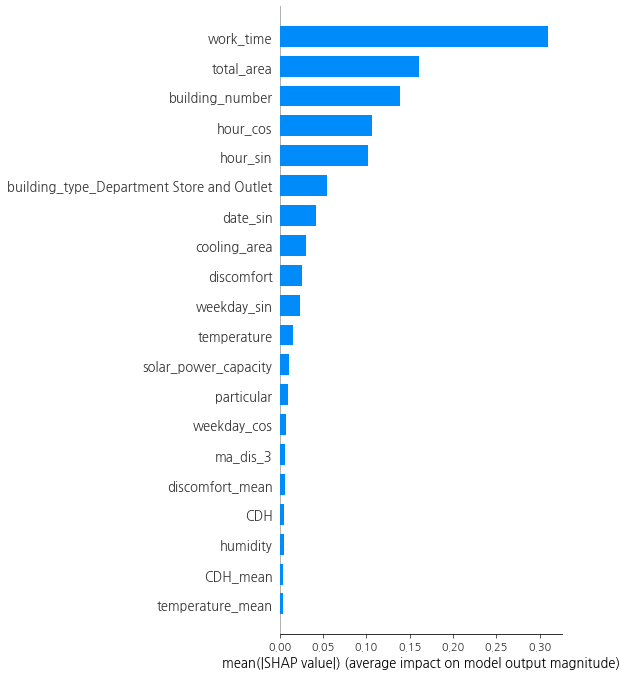

In [100]:
shap.initjs()

explainer = shap.TreeExplainer(xgbr_3)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [3]:
col_0 = ['building_number','date_sin','hour_cos','work_time','hour_sin','holiday','weekday_cos','discomfort_mean','particular','CDH',
'temperature_mean','discomfort','weekday_sin','CDH_mean','solar_power_capacity']
col_1 = ['cooling_area','building_number','work_time','total_area','hour_cos','hour_sin','holiday','date_sin','building_type_Hospital',
        'low_day','solar_power_capacity','building_type_University','building_type_Research Institute','building_type_Commercial',
        'weekday_cos','sy_ey']
col_2 = ['building_number','total_area','work_time','hour_sin','cooling_area','date_sin','ma_dis_5','CDH','hour_cos']
col_3 = ['work_time','total_area','building_number','hour_cos','hour_sin','building_type_Department Store and Outlet','date_sin',
        'cooling_area','discomfort','particular','solar_power_capacity']

In [18]:
# 슈퍼컴 전용 csv 파일 생성

# col_0 = ['building_number','date_sin','hour_cos','work_time','hour_sin','holiday','weekday_cos','discomfort_mean','particular','CDH',
# 'temperature_mean','discomfort','weekday_sin','CDH_mean','solar_power_capacity']
# col_1 = ['cooling_area','building_number','work_time','total_area','hour_cos','hour_sin','holiday','date_sin','building_type_Hospital',
#         'low_day','solar_power_capacity','building_type_University','building_type_Research Institute','building_type_Commercial',
#         'weekday_cos','sy_ey']
# col_2 = ['building_number','total_area','work_time','hour_sin','cooling_area','date_sin','ma_dis_5','CDH','hour_cos']
# col_3 = ['work_time','total_area','building_number','hour_cos','hour_sin','building_type_Department Store and Outlet','date_sin',
#         'cooling_area','discomfort','particular','solar_power_capacity']

# X_0 = X_0_train.copy()
# X_0 = X_0[col_0]
# X_0['target'] = y_0_log
# X_0.to_csv('./data/X_0_train.csv',encoding='cp949',index=False)
# X_1 = X_1_train.copy()
# X_1 = X_1[col_1]
# X_1['target'] = y_1_log
# X_1.to_csv('./data/X_1_train.csv',encoding='cp949',index=False)
# X_2 = X_2_train.copy()
# X_2 = X_2[col_2]
# X_2['target'] = y_2_log
# X_2.to_csv('./data/X_2_train.csv',encoding='cp949',index=False)
# X_3 = X_3_train.copy()
# X_3 = X_3[col_3]
# X_3['target'] = y_3_log
# X_3.to_csv('./data/X_3_train.csv',encoding='cp949',index=False)

# X_0 = X_0_test.copy()
# X_0 = X_0[col_0]
# X_0.to_csv('./data/X_0_test.csv',encoding='cp949',index=False)
# X_1 = X_1_test.copy()
# X_1 = X_1[col_1]
# X_1.to_csv('./data/X_1_test.csv',encoding='cp949',index=False)
# X_2 = X_2_test.copy()
# X_2 = X_2[col_2]
# X_2.to_csv('./data/X_2_test.csv',encoding='cp949',index=False)
# X_3 = X_3_test.copy()
# X_3 = X_3[col_3]
# X_3.to_csv('./data/X_3_test.csv',encoding='cp949',index=False)

# 앙상블

1. cat 모델 클러스터 별 하이퍼파라미터, 점수 저장

    1.1 best_score_ 를 cat_best_scores 리스트에 append (클러스터 순서대로)

    1.2 best_params_ 를 cat_hyperparams 리스트에 append (마찬가지로 순서대로)
    
2. xgb 모델 클러스터 별 하이퍼파라미터, 점수 저장

3. rf 모델 클러스터 별 하이퍼파라미터, 점수 저장

4. svr 모델 클러스터 별 하이퍼파라미터, 점수 저장

5. et(extra tree) 모델 클러스터 별 하이퍼파라미터, 점수 저장

In [4]:
X_0_train = X_0_train[col_0]
X_1_train = X_1_train[col_1]
X_2_train = X_2_train[col_2]
X_3_train = X_3_train[col_3]

In [5]:
SEED = 2
np.random.seed(SEED)

In [6]:
def smape(true, pred):
    v = 2 * abs(pred - true) / ((abs(pred) + abs(true)))
    result = np.mean(v) * 100
    return result

In [ ]:
#### cat for ensemble ####

from sklearn.model_selection import temporal_train_test_split
import optuna
from sklearn.metrics import mean_squared_error,mean_absolute_error
import math


cat_best_scores = []
cat_hyperparams = []

## cluster 0 model
X_0_train = X_0_train[col_0]
X_0_test = X_0_test[col_0]

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y = y_0_log, X = X_0_train, test_size = 168)

def objective(trial):
    param = {}
    param['learning_rate'] = trial.suggest_float("learning_rate", 0.03, 0.07, log=True)
    param['depth'] = trial.suggest_int('depth', 10, 16)
    param['l2_leaf_reg'] = trial.suggest_float('l2_leaf_reg',low=2.0, high=4, step=0.5)
    param['min_child_samples'] = trial.suggest_categorical('min_child_samples', [1, 2])
    param['grow_policy'] = 'Depthwise'
    param['iterations'] = 1000
    param['eval_metric'] = 'SMAPE'
    param['od_type'] = 'iter'
    param['od_wait'] = 20
    param['random_state'] = 1
    param['logging_level'] = 'Silent'
    regressor = CatBoostRegressor(**param)
    regressor.fit(X_train, y_train,early_stopping_rounds=100)
    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(regressor.predict(X_valid))))
    return sm

study_0 = optuna.create_study(study_name=f'catboost-seed')
study_0.optimize(objective, n_trials=30, n_jobs=-1, timeout=24000)

cat_0 = study_0.best_trial
cat_0_param = cat_0.params
print('Best Trial: score {},\nparams {}'.format(cat_0.value, cat_0_param))

cat_best_scores.append(cat_0.value)
cat_hyperparams.append(cat_0_param)

## cluster 1 model
X_1_train = X_1_train[col_1]
X_1_test = X_1_test[col_1]

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y = y_1_log, X = X_1_train, test_size = 168)

def objective(trial):
    param = {}
    param['learning_rate'] = trial.suggest_float("learning_rate", 0.03, 0.07, log=True)
    param['depth'] = trial.suggest_int('depth', 10, 16)
    param['l2_leaf_reg'] = trial.suggest_float('l2_leaf_reg',low=2.0, high=4, step=0.5)
    param['min_child_samples'] = trial.suggest_categorical('min_child_samples', [1, 2])
    param['grow_policy'] = 'Depthwise'
    param['iterations'] = 1000
    param['eval_metric'] = 'SMAPE'
    param['od_type'] = 'iter'
    param['od_wait'] = 20
    param['random_state'] = 1
    param['logging_level'] = 'Silent'
    regressor = CatBoostRegressor(**param)
    regressor.fit(X_train, y_train,early_stopping_rounds=100)
    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(regressor.predict(X_valid))))
    return sm

study_1 = optuna.create_study(study_name=f'catboost-seed')
study_1.optimize(objective, n_trials=30, n_jobs=-1, timeout=24000)

cat_1 = study_1.best_trial
cat_1_param = cat_1.params
print('Best Trial: score {},\nparams {}'.format(cat_1.value, cat_1_param))

cat_best_scores.append(cat_1.value)
cat_hyperparams.append(cat_1_param)

## cluster 2 model
X_2_train = X_2_train[col_2]
X_2_test = X_2_test[col_2]

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y = y_2_log, X = X_2_train, test_size = 168)

def objective(trial):
    param = {}
    param['learning_rate'] = trial.suggest_float("learning_rate", 0.03, 0.07, log=True)
    param['depth'] = trial.suggest_int('depth', 10, 16)
    param['l2_leaf_reg'] = trial.suggest_float('l2_leaf_reg',low=2.0, high=4, step=0.5)
    param['min_child_samples'] = trial.suggest_categorical('min_child_samples', [1, 2])
    param['grow_policy'] = 'Depthwise'
    param['iterations'] = 1000
    param['eval_metric'] = 'SMAPE'
    param['od_type'] = 'iter'
    param['od_wait'] = 20
    param['random_state'] = 1
    param['logging_level'] = 'Silent'
    regressor = CatBoostRegressor(**param)
    regressor.fit(X_train, y_train,early_stopping_rounds=100)
    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(regressor.predict(X_valid))))
    return sm

study_2 = optuna.create_study(study_name=f'catboost-seed')
study_2.optimize(objective, n_trials=30, n_jobs=-1, timeout=24000)

cat_2 = study_2.best_trial
cat_2_param = cat_2.params
print('Best Trial: score {},\nparams {}'.format(cat_2.value, cat_2_param))

cat_best_scores.append(cat_2.value)
cat_hyperparams.append(cat_2_param)

## cluster 3 model
X_3_train = X_3_train[col_3]
X_3_test = X_3_test[col_3]

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y = y_3_log, X = X_3_train, test_size = 168)

def objective(trial):
    param = {}
    param['learning_rate'] = trial.suggest_float("learning_rate", 0.03, 0.07, log=True)
    param['depth'] = trial.suggest_int('depth', 10, 16)
    param['l2_leaf_reg'] = trial.suggest_float('l2_leaf_reg',low=2.0, high=4, step=0.5)
    param['min_child_samples'] = trial.suggest_categorical('min_child_samples', [1, 2])
    param['grow_policy'] = 'Depthwise'
    param['iterations'] = 1000
    param['eval_metric'] = 'SMAPE'
    param['od_type'] = 'iter'
    param['od_wait'] = 20
    param['random_state'] = 1
    param['logging_level'] = 'Silent'
    regressor = CatBoostRegressor(**param)
    regressor.fit(X_train, y_train,early_stopping_rounds=100)
    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(regressor.predict(X_valid))))
    return sm

study_3 = optuna.create_study(study_name=f'catboost-seed')
study_3.optimize(objective, n_trials=30, n_jobs=-1, timeout=24000)

cat_3 = study_3.best_trial
cat_3_param = cat_3.params
print('Best Trial: score {},\nparams {}'.format(cat_3.value, cat_3_param))

cat_best_scores.append(cat_3.value)
cat_hyperparams.append(cat_3_param)

[I 2023-08-18 14:38:50,233] A new study created in memory with name: catboost-seed
[I 2023-08-18 14:40:33,621] Trial 0 finished with value: 6.503166832526073 and parameters: {'learning_rate': 0.029198550107150868, 'depth': 5, 'l2_leaf_reg': 5.5, 'min_child_samples': 1}. Best is trial 0 with value: 6.503166832526073.
[I 2023-08-18 14:41:44,367] Trial 2 finished with value: 4.093920078429761 and parameters: {'learning_rate': 0.08141062398202308, 'depth': 6, 'l2_leaf_reg': 4.0, 'min_child_samples': 4}. Best is trial 2 with value: 4.093920078429761.
[I 2023-08-18 14:41:45,256] Trial 3 finished with value: 4.334309081833219 and parameters: {'learning_rate': 0.061942671438523805, 'depth': 6, 'l2_leaf_reg': 2.0, 'min_child_samples': 4}. Best is trial 2 with value: 4.093920078429761.
[I 2023-08-18 14:41:50,871] Trial 6 finished with value: 6.78637729185914 and parameters: {'learning_rate': 0.012948725679687403, 'depth': 6, 'l2_leaf_reg': 5.5, 'min_child_samples': 4}. Best is trial 2 with value

[I 2023-08-18 19:04:54,165] Trial 36 finished with value: 2.8966821280026527 and parameters: {'learning_rate': 0.07748249675324466, 'depth': 10, 'l2_leaf_reg': 4.0, 'min_child_samples': 8}. Best is trial 31 with value: 2.6929224346824387.
[I 2023-08-18 19:05:42,835] Trial 33 finished with value: 2.7463046576962435 and parameters: {'learning_rate': 0.07229836116390419, 'depth': 10, 'l2_leaf_reg': 3.5, 'min_child_samples': 1}. Best is trial 31 with value: 2.6929224346824387.
[I 2023-08-18 19:11:53,890] Trial 40 finished with value: 3.14727463594478 and parameters: {'learning_rate': 0.08108980100800686, 'depth': 8, 'l2_leaf_reg': 4.0, 'min_child_samples': 1}. Best is trial 31 with value: 2.6929224346824387.
[I 2023-08-18 19:31:03,342] Trial 41 finished with value: 3.144100599096207 and parameters: {'learning_rate': 0.08133367985385337, 'depth': 8, 'l2_leaf_reg': 4.0, 'min_child_samples': 1}. Best is trial 31 with value: 2.6929224346824387.
[I 2023-08-18 19:36:01,490] Trial 42 finished wit

In [11]:
cat_best_scores = [4.3413967925355745,2.426650381695719,2.1866003917783434,4.766026429169772]
cat_hyperparams =  [{'learning_rate': 0.05166676124789215, 
                     'depth': 15, 'l2_leaf_reg': 2.5, 'min_child_samples': 16},
 {'learning_rate': 0.047386859888027516, 
  'depth': 16, 
  'l2_leaf_reg': 3.5, 
  'min_child_samples': 1},
 {'learning_rate': 0.05605488347126201,
  'depth': 10,
  'l2_leaf_reg': 3.0,
  'min_child_samples': 1},
 {'learning_rate': 0.06230456276497763, 
  'depth': 15, 
  'l2_leaf_reg': 3.5, 
  'min_child_samples': 1}]

# CAT 제외 나머지 알고리즘 성능이 많이 낮아 CAT만 진행 후 제출 (08.20)

In [9]:
X_0_test = X_0_test[col_0]
X_1_test = X_1_test[col_1]
X_2_test = X_2_test[col_2]
X_3_test = X_3_test[col_3]

In [13]:
from catboost import CatBoostRegressor
cats = [CatBoostRegressor(verbose = False, **params) for params in cat_hyperparams]

In [14]:
X_tests = [X_0_test, X_1_test, X_2_test, X_3_test]
X_trains = [X_0_train, X_1_train, X_2_train, X_3_train]
y_trains_log = [y_0_log, y_1_log,y_2_log,y_3_log]
for i, (X_test, X_tr, y_tr, cat) in enumerate(zip(X_tests, X_trains, y_trains_log, cats)):
    cat.fit(X_tr, y_tr, verbose = False)
    X_test['answer'] = np.exp(np.array(cat.predict(X_test)))
    X_test.to_csv(f'./data/X_{i}_test_pred_3.csv', encoding='cp949', index=False)

In [10]:
from catboost import CatBoostRegressor

X_tests = [X_0_test, X_1_test, X_2_test, X_3_test]
X_trains = [X_0_train, X_1_train, X_2_train, X_3_train]
y_trains_log = [y_0_log, y_1_log,y_2_log,y_3_log]
for i, (X_test, X_tr, y_tr) in enumerate(zip(X_tests, X_trains, y_trains_log)):
    cat = CatBoostRegressor(random_state = SEED)
    cat.fit(X_tr, y_tr, verbose = False)
    X_test['answer'] = np.exp(np.array(cat.predict(X_test)))
    X_test.to_csv(f'./data/X_{i}_test_pred_2.csv', encoding='cp949', index=False)

In [ ]:
#### xgb for ensemble ####

xgb_best_scores = []
xgb_hyperparams = []

## cluster 0 model
X_train, X_valid, y_train, y_valid = train_test_split(X_0_train, y_0_log, random_state=42)

def objective(trial):
    param = {
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1),
        'subsample': trial.suggest_float('subsample', 0.4, 1),
        'learning_rate': trial.suggest_float('learning_rate',0.03, 0.01),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 4,8),
        'min_child_weight': trial.suggest_int('min_child_weight', 2, 50),
    }
    model =XGBRegressor(**param)  
    
    model.fit(X_train,y_train,eval_set=[(X_valid,y_valid)],early_stopping_rounds=50)
    
    preds = model.predict(X_valid)
    
    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm
          
study_0 = optuna.create_study(study_name = 'Xgboost Optuna_0')
study_0.optimize(objective, n_trials=50, timeout=24000)

xgb_0 = study_0.best_trial
xgb_0_param = xgb_0.params
print('Best Trial: score {},\nparams {}'.format(xgb_0.value, xgb_0_param))

xgb_best_scores.append(xgb_0)
xgb_hyperparams.append(xgb_0_param)

## cluster 1 model
X_train, X_valid, y_train, y_valid = train_test_split(X_1_train, y_1_log, random_state=42)

def objective(trial):
    param = {
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1),
        'subsample': trial.suggest_float('subsample', 0.4, 1),
        'learning_rate': trial.suggest_float('learning_rate',0.001, 0.01),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 4,8),
        'min_child_weight': trial.suggest_int('min_child_weight', 2, 50),
    }
    model =XGBRegressor(**param)  
    
    model.fit(X_train,y_train,eval_set=[(X_valid,y_valid)],early_stopping_rounds=50)
    
    preds = model.predict(X_valid)
    
    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm
          
study_1 = optuna.create_study(study_name = 'Xgboost Optuna_1')
study_1.optimize(objective, n_trials=50, timeout=24000)

xgb_1 = study_1.best_trial
xgb_1_param = xgb_1.params
print('Best Trial: score {},\nparams {}'.format(xgb_1.value, xgb_1_param))

xgb_best_scores.append(xgb_1)
xgb_hyperparams.append(xgb_1_param)

## cluster 2 model
X_train, X_valid, y_train, y_valid = train_test_split(X_2_train, y_2_log, random_state=42)

def objective(trial):
    param = {
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1),
        'subsample': trial.suggest_float('subsample', 0.4, 1),
        'learning_rate': trial.suggest_float('learning_rate',0.001, 0.01),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 4,8),
        'min_child_weight': trial.suggest_int('min_child_weight', 2, 50),
    }
    model =XGBRegressor(**param)  
    
    model.fit(X_train,y_train,eval_set=[(X_valid,y_valid)],early_stopping_rounds=50)
    
    preds = model.predict(X_valid)
    
    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm
          
study_2 = optuna.create_study(study_name = 'Xgboost Optuna_2')
study_2.optimize(objective, n_trials=50, timeout=24000)

xgb_2 = study_2.best_trial
xgb_2_param = xgb_2.params
print('Best Trial: score {},\nparams {}'.format(xgb_2.value, xgb_2_param))

xgb_best_scores.append(xgb_2)
xgb_hyperparams.append(xgb_2_param)

## cluster 3 model
X_train, X_valid, y_train, y_valid = train_test_split(X_3_train, y_3_log, random_state=42)

def objective(trial):
    param = {
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1),
        'subsample': trial.suggest_float('subsample', 0.4, 1),
        'learning_rate': trial.suggest_float('learning_rate',0.001, 0.01),
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 4,8),
        'min_child_weight': trial.suggest_int('min_child_weight', 2, 50),
    }
    model =XGBRegressor(**param)  
    
    model.fit(X_train,y_train,eval_set=[(X_valid,y_valid)],early_stopping_rounds=50)
    
    preds = model.predict(X_valid)
    
    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm
          
study_3 = optuna.create_study(study_name = 'Xgboost Optuna_3')
study_3.optimize(objective, n_trials=50, timeout=24000)

xgb_3 = study_3.best_trial
xgb_3_param = xgb_3.params
print('Best Trial: score {},\nparams {}'.format(xgb_3.value, xgb_3_param))

xgb_best_scores.append(xgb_3)
xgb_hyperparams.append(xgb_3_param)

In [8]:
xgb_best_scores[9.786584354730003, 12.035547133571693,6.576753574025254,12.590079430048801]
xgb_hyperparams = [{'colsample_bytree': 0.5612041017618803,
  'subsample': 0.6139630768428379,
  'learning_rate': 0.009622630932242778,
  'n_estimators': 497,
  'max_depth': 8,
  'min_child_weight': 21},
 {'colsample_bytree': 0.8773856909719138,
  'subsample': 0.9435438002329848,
  'learning_rate': 0.00925564912369709,
  'n_estimators': 461,
  'max_depth': 8,
  'min_child_weight': 20},
 {'colsample_bytree': 0.9697076211677187,
  'subsample': 0.9326141056879428,
  'learning_rate': 0.009995749790295971,
  'n_estimators': 500,
  'max_depth': 7,
  'min_child_weight': 4},
 {'colsample_bytree': 0.7223565317608216,
  'subsample': 0.7349834768081919,
  'learning_rate': 0.009921834484899176,
  'n_estimators': 462,
  'max_depth': 6,
  'min_child_weight': 46}]

NameError: name 'xgb_best_scores' is not defined

In [19]:
#### rf for ensemble ####
from sklearn.ensemble import RandomForestRegressor

rf_best_scores = []
rf_hyperparams = []

## cluster 0
X_train, X_valid, y_train, y_valid = train_test_split(X_0_train, y_0_log, random_state=42)

def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'criterion': 'squared_error',
        'max_depth' : trial.suggest_int('max_depth', 10, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 3, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 3, 10),
        'random_state': 28
    }

    model = RandomForestRegressor(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_0 = optuna.create_study(study_name = 'RF Optuna_0')
study_0.optimize(objective, n_trials=50, timeout=24000)

rf_0 = study_0.best_trial
rf_0_param = rf_0.params
print('Best Trial: score {},\nparams {}'.format(rf_0.value, rf_0_param))

rf_best_scores.append(rf_0.value)
rf_hyperparams.append(rf_0_param)

## cluster 1
X_train, X_valid, y_train, y_valid = train_test_split(X_1_train, y_1_log, random_state=42)

def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'criterion': 'squared_error',
        'max_depth' : trial.suggest_int('max_depth', 10, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 3, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 3, 10),
        'random_state': 28
    }

    model = RandomForestRegressor(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_1 = optuna.create_study(study_name = 'RF Optuna_1')
study_1.optimize(objective, n_trials=50, timeout=24000)

rf_1 = study_1.best_trial
rf_1_param = rf_1.params
print('Best Trial: score {},\nparams {}'.format(rf_1.value, rf_1_param))

rf_best_scores.append(rf_1.value)
rf_hyperparams.append(rf_1_param)

## cluster 2
X_train, X_valid, y_train, y_valid = train_test_split(X_2_train, y_2_log, random_state=42)

def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'criterion': 'squared_error',
        'max_depth' : trial.suggest_int('max_depth', 10, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 3, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 3, 10),
        'random_state': 28
    }

    model = RandomForestRegressor(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_2 = optuna.create_study(study_name = 'RF Optuna_2')
study_2.optimize(objective, n_trials=50, timeout=24000)

rf_2 = study_2.best_trial
rf_2_param = rf_2.params
print('Best Trial: score {},\nparams {}'.format(rf_2.value, rf_2_param))

rf_best_scores.append(rf_2.value)
rf_hyperparams.append(rf_2_param)

## cluster 3
X_train, X_valid, y_train, y_valid = train_test_split(X_3_train, y_3_log, random_state=42)

def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'criterion': 'squared_error',
        'max_depth' : trial.suggest_int('max_depth', 10, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 3, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 3, 10),
        'random_state': 28
    }

    model = RandomForestRegressor(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_3 = optuna.create_study(study_name = 'RF Optuna_3')
study_3.optimize(objective, n_trials=50, timeout=24000)

rf_3 = study_3.best_trial
rf_3_param = rf_3.params
print('Best Trial: score {},\nparams {}'.format(rf_3.value, rf_3_param))

rf_best_scores.append(rf_3.value)
rf_hyperparams.append(rf_3_param)


[I 2023-08-18 20:07:20,586] A new study created in memory with name: RF Optuna_0
[W 2023-08-18 20:07:39,607] Trial 0 failed with parameters: {'n_estimators': 292, 'max_depth': 7, 'min_samples_split': 8, 'min_samples_leaf': 9} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "C:\Users\magne\anaconda3\lib\site-packages\optuna\study\_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\magne\AppData\Local\Temp/ipykernel_8436/470165479.py", line 21, in objective
    model.fit(X_train,y_train)
  File "C:\Users\magne\anaconda3\lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\magne\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 456, in fit
    trees = Parallel(
  File "C:\Users\magne\anaconda3\lib\site-packages\sklearn\utils\parallel.py", line 65, in __call__
    return super().__call__(iterable_with_config)
  File "C:\Us

KeyboardInterrupt: 

In [9]:
rf_best_scores = [6.429082832136099, 9.791609186544664, 5.293900442946749, 8.818991916898455]
rf_hyperparams = [{'n_estimators': 460,
  'max_depth': 10,
  'min_samples_split': 6,
  'min_samples_leaf': 3},
 {'n_estimators': 173,
  'max_depth': 10,
  'min_samples_split': 10,
  'min_samples_leaf': 3},
 {'n_estimators': 123,
  'max_depth': 10,
  'min_samples_split': 3,
  'min_samples_leaf': 3},
 {'n_estimators': 287,
  'max_depth': 10,
  'min_samples_split': 7,
  'min_samples_leaf': 3}]

In [ ]:
#### svr for ensemble ####
from sklearn.svm import SVR

svr_best_scores = []
svr_hyperparams = []

## cluster 0
X_train, X_valid, y_train, y_valid = train_test_split(X_0_train, y_0_log, random_state=42)


def objective(trial):
    param = {
        'C': trial.suggest_loguniform('C', 0.3, 10),
        'degree': trial.suggest_int('degree',2,7),
        'gamma' : trial.suggest_loguniform('gamma', 1e-3, 0.01),
        'epsilon' : trial.suggest_float('epsilon',0.05,0.5)
    }

    model = SVR(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_0 = optuna.create_study(study_name = 'SVR Optuna_0')
study_0.optimize(objective, n_trials=50, timeout=24000)

svr_0 = study_0.best_trial
svr_0_param = svr_0.params
print('Best Trial: score {},\nparams {}'.format(svr_0.value, svr_0_param))

svr_best_scores.append(svr_0)
svr_hyperparams.append(svr_0_param)

## cluster 1
X_train, X_valid, y_train, y_valid = train_test_split(X_1_train, y_1_log, random_state=42)


def objective(trial):
    param = {
        'C': trial.suggest_loguniform('C', 0.3, 10),
        'degree': trial.suggest_int('degree',2,7),
        'gamma' : trial.suggest_loguniform('gamma', 1e-3, 0.01),
        'epsilon' : trial.suggest_float('epsilon',0.05,0.5)
    }

    model = SVR(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_1 = optuna.create_study(study_name = 'SVR Optuna_1')
study_1.optimize(objective, n_trials=50, timeout=24000)

svr_1 = study_1.best_trial
svr_1_param = svr_1.params
print('Best Trial: score {},\nparams {}'.format(svr_1.value, svr_1_param))

svr_best_scores.append(svr_1)
svr_hyperparams.append(svr_1_param)

## cluster 2
X_train, X_valid, y_train, y_valid = train_test_split(X_2_train, y_2_log, random_state=42)


def objective(trial):
    param = {
        'C': trial.suggest_loguniform('C', 0.3, 10),
        'degree': trial.suggest_int('degree',2,7),
        'gamma' : trial.suggest_loguniform('gamma', 1e-3, 0.01),
        'epsilon' : trial.suggest_float('epsilon',0.05,0.5)
    }

    model = SVR(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_2 = optuna.create_study(study_name = 'SVR Optuna_2')
study_2.optimize(objective, n_trials=50, timeout=24000)

svr_2 = study_2.best_trial
svr_2_param = svr_2.params
print('Best Trial: score {},\nparams {}'.format(svr_2.value, svr_2_param))

svr_best_scores.append(svr_2)
svr_hyperparams.append(svr_2_param)

## cluster 3
X_train, X_valid, y_train, y_valid = train_test_split(X_3_train, y_3_log, random_state=42)


def objective(trial):
    param = {
        'C': trial.suggest_loguniform('C', 0.3, 10),
        'degree': trial.suggest_int('degree',2,7),
        'gamma' : trial.suggest_loguniform('gamma', 1e-3, 0.01),
        'epsilon' : trial.suggest_float('epsilon',0.05,0.5)
    }

    model = SVR(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_3 = optuna.create_study(study_name = 'SVR Optuna_3')
study_3.optimize(objective, n_trials=50, timeout=24000)

svr_3 = study_3.best_trial
svr_3_param = svr_3.params
print('Best Trial: score {},\nparams {}'.format(svr_3.value, svr_3_param))

svr_best_scores.append(svr_3)
svr_hyperparams.append(svr_3_param)

In [ ]:
svr_best_scores = [8.06384956314882, 12.072459597998462,6.91983077266165,10.269556685625881]
svr_hyperparams =  [{'C': 9.841530722784379,
  'degree': 6,
  'gamma': 0.009891573686972346,
  'epsilon': 0.05090815139828966},
 {'C': 9.243789965581446,
  'degree': 3,
  'gamma': 0.009764835275967724,
  'epsilon': 0.0746547519890558},
 {'C': 8.10435868807086,
  'degree': 6,
  'gamma': 0.007308027315013699,
  'epsilon': 0.05371389234112106},
 {'C': 6.074629578088259,
  'degree': 6,
  'gamma': 0.009005215359248912,
  'epsilon': 0.05425167125430294}]

In [7]:
#### et for ensemble ####
import optuna
from sklearn.ensemble import ExtraTreesRegressor

et_best_scores = []
et_hyperparams = []

## cluster 0
X_train, X_valid, y_train, y_valid = train_test_split(X_0_train, y_0_log, random_state=42)

def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'criterion': 'squared_error',
        'max_depth' : trial.suggest_int('max_depth', 4, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2, 10)
    }
    
    model = ExtraTreesRegressor(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_0 = optuna.create_study(study_name = 'ET Optuna_0')
study_0.optimize(objective, n_trials=50, timeout=24000)

et_0 = study_0.best_trial
et_0_param = et_0.params
print('Best Trial: score {},\nparams {}'.format(et_0.value, et_0_param))

et_best_scores.append(et_0.value)
et_hyperparams.append(et_0_param)

## cluster 1
X_train, X_valid, y_train, y_valid = train_test_split(X_1_train, y_1_log, random_state=42)

def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'criterion': 'squared_error',
        'max_depth' : trial.suggest_int('max_depth', 4, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2, 10)
    }

    model = ExtraTreesRegressor(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_1 = optuna.create_study(study_name = 'ET Optuna_1')
study_1.optimize(objective, n_trials=50, timeout=24000)

et_1 = study_1.best_trial
et_1_param = et_1.params
print('Best Trial: score {},\nparams {}'.format(et_1.value, et_1_param))

et_best_scores.append(et_1.value)
et_hyperparams.append(et_1_param)

## cluster 2
X_train, X_valid, y_train, y_valid = train_test_split(X_2_train, y_2_log, random_state=42)

def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'criterion': 'squared_error',
        'max_depth' : trial.suggest_int('max_depth', 4, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2, 10)
    }

    model = ExtraTreesRegressor(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_2 = optuna.create_study(study_name = 'ET Optuna_2')
study_2.optimize(objective, n_trials=50, timeout=24000)

et_2 = study_2.best_trial
et_2_param = et_2.params
print('Best Trial: score {},\nparams {}'.format(et_2.value, et_2_param))

et_best_scores.append(et_2.value)
et_hyperparams.append(et_2_param)

## cluster 3
X_train, X_valid, y_train, y_valid = train_test_split(X_3_train, y_3_log, random_state=42)

def objective(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'criterion': 'squared_error',
        'max_depth' : trial.suggest_int('max_depth', 4, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2, 10)
    }

    model = ExtraTreesRegressor(**param)
    model.fit(X_train,y_train)

    preds = model.predict(X_valid)

    sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))
    
    return sm

study_3 = optuna.create_study(study_name = 'ET Optuna_3')
study_3.optimize(objective, n_trials=50, timeout=24000)

et_3 = study_3.best_trial
et_3_param = et_3.params
print('Best Trial: score {},\nparams {}'.format(et_3.value, et_3_param))

et_best_scores.append(et_3.value)
et_hyperparams.append(et_3_param)

[I 2023-08-19 09:55:54,801] A new study created in memory with name: ET Optuna_0
[I 2023-08-19 09:55:56,022] Trial 0 finished with value: 9.677759753435327 and parameters: {'n_estimators': 306, 'max_depth': 5, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 0 with value: 9.677759753435327.
[I 2023-08-19 09:55:56,733] Trial 1 finished with value: 7.744834088335583 and parameters: {'n_estimators': 105, 'max_depth': 8, 'min_samples_split': 10, 'min_samples_leaf': 4}. Best is trial 1 with value: 7.744834088335583.
[I 2023-08-19 09:56:00,269] Trial 2 finished with value: 6.609995840147566 and parameters: {'n_estimators': 384, 'max_depth': 13, 'min_samples_split': 7, 'min_samples_leaf': 8}. Best is trial 2 with value: 6.609995840147566.
[I 2023-08-19 09:56:01,970] Trial 3 finished with value: 6.19074881836731 and parameters: {'n_estimators': 149, 'max_depth': 15, 'min_samples_split': 8, 'min_samples_leaf': 6}. Best is trial 3 with value: 6.19074881836731.
[I 2023-08-19 09:56:02

[I 2023-08-19 09:57:35,946] Trial 36 finished with value: 8.987558367192946 and parameters: {'n_estimators': 217, 'max_depth': 6, 'min_samples_split': 4, 'min_samples_leaf': 2}. Best is trial 23 with value: 5.182160132782925.
[I 2023-08-19 09:57:40,893] Trial 37 finished with value: 5.744752414146768 and parameters: {'n_estimators': 341, 'max_depth': 19, 'min_samples_split': 6, 'min_samples_leaf': 4}. Best is trial 23 with value: 5.182160132782925.
[I 2023-08-19 09:57:44,961] Trial 38 finished with value: 6.675277621445781 and parameters: {'n_estimators': 432, 'max_depth': 14, 'min_samples_split': 6, 'min_samples_leaf': 9}. Best is trial 23 with value: 5.182160132782925.
[I 2023-08-19 09:57:46,871] Trial 39 finished with value: 5.595323780122178 and parameters: {'n_estimators': 122, 'max_depth': 16, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 23 with value: 5.182160132782925.
[I 2023-08-19 09:57:48,793] Trial 40 finished with value: 5.908270112938806 and parameters: {

Best Trial: score 5.133010744092361,
params {'n_estimators': 164, 'max_depth': 19, 'min_samples_split': 2, 'min_samples_leaf': 2}


[I 2023-08-19 09:59:13,292] Trial 0 finished with value: 7.312011366003067 and parameters: {'n_estimators': 386, 'max_depth': 14, 'min_samples_split': 3, 'min_samples_leaf': 9}. Best is trial 0 with value: 7.312011366003067.
[I 2023-08-19 09:59:27,524] Trial 1 finished with value: 33.14424897181061 and parameters: {'n_estimators': 267, 'max_depth': 4, 'min_samples_split': 2, 'min_samples_leaf': 10}. Best is trial 0 with value: 7.312011366003067.
[I 2023-08-19 09:59:44,660] Trial 2 finished with value: 6.199620391598235 and parameters: {'n_estimators': 101, 'max_depth': 15, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 2 with value: 6.199620391598235.
[I 2023-08-19 09:59:59,169] Trial 3 finished with value: 21.915607182210767 and parameters: {'n_estimators': 173, 'max_depth': 7, 'min_samples_split': 9, 'min_samples_leaf': 8}. Best is trial 2 with value: 6.199620391598235.
[I 2023-08-19 10:00:15,490] Trial 4 finished with value: 13.307434326232137 and parameters: {'n_esti

[I 2023-08-19 10:33:27,156] Trial 37 finished with value: 5.070873386537817 and parameters: {'n_estimators': 288, 'max_depth': 17, 'min_samples_split': 6, 'min_samples_leaf': 4}. Best is trial 26 with value: 4.179918536821859.
[I 2023-08-19 10:34:03,744] Trial 38 finished with value: 13.225179995803876 and parameters: {'n_estimators': 363, 'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 5}. Best is trial 26 with value: 4.179918536821859.
[I 2023-08-19 10:34:42,134] Trial 39 finished with value: 5.995793669552108 and parameters: {'n_estimators': 242, 'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 26 with value: 4.179918536821859.
[I 2023-08-19 10:35:03,065] Trial 40 finished with value: 4.299236303059599 and parameters: {'n_estimators': 111, 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 26 with value: 4.179918536821859.
[I 2023-08-19 10:36:19,811] Trial 41 finished with value: 4.28502955412677 and parameters: 

Best Trial: score 4.179918536821859,
params {'n_estimators': 413, 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2}


[I 2023-08-19 10:44:43,052] Trial 0 finished with value: 4.261701517177328 and parameters: {'n_estimators': 355, 'max_depth': 16, 'min_samples_split': 8, 'min_samples_leaf': 2}. Best is trial 0 with value: 4.261701517177328.
[I 2023-08-19 10:44:47,022] Trial 1 finished with value: 4.296323975402902 and parameters: {'n_estimators': 177, 'max_depth': 20, 'min_samples_split': 10, 'min_samples_leaf': 3}. Best is trial 0 with value: 4.261701517177328.
[I 2023-08-19 10:44:48,736] Trial 2 finished with value: 11.79540095157658 and parameters: {'n_estimators': 259, 'max_depth': 6, 'min_samples_split': 9, 'min_samples_leaf': 6}. Best is trial 0 with value: 4.261701517177328.
[I 2023-08-19 10:44:51,086] Trial 3 finished with value: 15.075645119796437 and parameters: {'n_estimators': 413, 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 0 with value: 4.261701517177328.
[I 2023-08-19 10:44:53,065] Trial 4 finished with value: 15.342219049014394 and parameters: {'n_esti

[I 2023-08-19 10:49:19,894] Trial 37 finished with value: 4.452654129304444 and parameters: {'n_estimators': 472, 'max_depth': 14, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 35 with value: 4.06241269422093.
[I 2023-08-19 10:49:33,288] Trial 38 finished with value: 4.08220971313034 and parameters: {'n_estimators': 412, 'max_depth': 17, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 35 with value: 4.06241269422093.
[I 2023-08-19 10:49:44,198] Trial 39 finished with value: 4.2379787779231535 and parameters: {'n_estimators': 416, 'max_depth': 17, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 35 with value: 4.06241269422093.
[I 2023-08-19 10:49:49,861] Trial 40 finished with value: 5.156783370757472 and parameters: {'n_estimators': 365, 'max_depth': 12, 'min_samples_split': 2, 'min_samples_leaf': 5}. Best is trial 35 with value: 4.06241269422093.
[I 2023-08-19 10:50:03,038] Trial 41 finished with value: 4.071684377078279 and parameters: {'n_

Best Trial: score 4.060046496500769,
params {'n_estimators': 405, 'max_depth': 17, 'min_samples_split': 2, 'min_samples_leaf': 2}


[I 2023-08-19 10:51:45,295] Trial 0 finished with value: 7.504450570644234 and parameters: {'n_estimators': 257, 'max_depth': 15, 'min_samples_split': 7, 'min_samples_leaf': 6}. Best is trial 0 with value: 7.504450570644234.
[I 2023-08-19 10:51:48,775] Trial 1 finished with value: 14.766020791122802 and parameters: {'n_estimators': 194, 'max_depth': 7, 'min_samples_split': 9, 'min_samples_leaf': 8}. Best is trial 0 with value: 7.504450570644234.
[I 2023-08-19 10:51:56,750] Trial 2 finished with value: 9.276669273512043 and parameters: {'n_estimators': 321, 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 9}. Best is trial 0 with value: 7.504450570644234.
[I 2023-08-19 10:52:07,217] Trial 3 finished with value: 7.540219263074867 and parameters: {'n_estimators': 279, 'max_depth': 14, 'min_samples_split': 8, 'min_samples_leaf': 5}. Best is trial 0 with value: 7.504450570644234.
[I 2023-08-19 10:52:11,327] Trial 4 finished with value: 22.26678527235576 and parameters: {'n_estim

[I 2023-08-19 10:58:41,692] Trial 37 finished with value: 6.891999084193055 and parameters: {'n_estimators': 182, 'max_depth': 19, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 37 with value: 6.891999084193055.
[I 2023-08-19 10:58:57,387] Trial 38 finished with value: 6.909665502668434 and parameters: {'n_estimators': 222, 'max_depth': 19, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 37 with value: 6.891999084193055.
[I 2023-08-19 10:59:07,980] Trial 39 finished with value: 7.526013499704335 and parameters: {'n_estimators': 260, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 8}. Best is trial 37 with value: 6.891999084193055.
[I 2023-08-19 10:59:14,334] Trial 40 finished with value: 7.737098796197252 and parameters: {'n_estimators': 175, 'max_depth': 15, 'min_samples_split': 2, 'min_samples_leaf': 10}. Best is trial 37 with value: 6.891999084193055.
[I 2023-08-19 10:59:29,681] Trial 41 finished with value: 6.905606704555059 and parameters:

Best Trial: score 6.877602540102844,
params {'n_estimators': 128, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 2}


In [13]:
et_best_scores = [5.077049184057563,3.8834995, 3.95526,6.83428]
et_hyperparams = [{'n_estimators': 389, 
                   'max_depth': 29, 
                   'min_samples_split': 3, 
                   'min_samples_leaf': 2},
                  {'n_estimators': 262, 
                   'max_depth': 29, 
                   'min_samples_split': 3, 
                   'min_samples_leaf': 2},
                  {'n_estimators': 441, 
                   'max_depth': 22, 
                   'min_samples_split': 2, 
                   'min_samples_leaf': 2},
                  {'n_estimators': 377, 
                   'max_depth': 24, 
                   'min_samples_split': 2, 
                   'min_samples_leaf': 2}
                 ]

In [ ]:
score_df = pd.DataFrame({'model':['cat']*4 + ['xgb']*4 + ['rf']*4 + ['svr']*4 + ['et']*4,
                         'cluster': list(range(1,5))*5,
                         'smape' : cat_best_scores + xgb_best_scores + rf_best_scores + svr_best_scores + et_best_scores})
score_df['smape'] = score_df['smape'].abs()

fig = plt.figure(figsize = (10, 30))
sns.barplot(data = score_df, orient = 'h', x = 'smape', y = 'cluster', hue = 'model')

In [ ]:
# (건물 별 모델 cv score 의 pivot_q quantile 값*threshold) 보다 작은 cv score를 가진 모델만 건물별로 선택
def good_models(score_df, pivot_q, threshold):
    score_pivot = pd.DataFrame(score_df.pivot('cluster', 'model', 'smape').values,
                               columns = ['cat','xgb','rf','svr', 'et'])
    li = []
    for i in range(len(score_pivot)):
        temp = score_pivot.iloc[i]
        q = temp.quantile(pivot_q)
        best = list(temp[temp <= threshold*q].index)
        li.append(best)
    return li

In [ ]:
best_models = good_models(score_df, 0.3, 1.1)
best_models

In [ ]:
# catboost models with tuned hyperparams
opt_cat = [CatBoostRegressor(random_state = SEED, verbose = False, **params) for params in cat_hyperparams]

opt_xgb = [XGBRegressor(**params) for params in xgb_hyperparams]

opt_rf = [RandomForestRegressor(random_state = SEED, **params) for params in rf_hyperparams]

opt_svr = [SVR(**params) for params in svr_hyperparams]

opt_et = [ExtraTreesRegressor(random_state = SEED, **params) for params in et_hyperparams]

In [ ]:
# voting ensemble training & inference
bests = good_models(score_df, 0.3, 1.1)
X_tests = [X_0_test, X_1_test, X_2_test, X_3_test]
X_trains = [X_0_trains, X_1_trains, X_2_trains, X_3_trains]
voting_pred = []
for i, (X_test, X_tr, y_tr, best, c, x, r, s, e) in enumerate(zip(X_tests, X_trains, y_trains_log, bests, opt_cat, opt_xgb, opt_rf, opt_svr, opt_et)):
    pred = []
    if 'cat' in best:
        cat = c
        cat.fit(X_tr, y_tr, verbose = False)
        pred.append(cat.predict(X_test))
    if 'xgb' in best:
        xgb = x
        xgb.fit(X_tr, y_tr)
        pred.append(xgb.predict(X_test))
    if 'rf' in best:
        rf = r
        rf.fit(X_tr, y_tr)
        pred.append(rf.predict(X_test))
    if 'svr' in best:
        svr = s
        svr.fit(X_tr, y_tr)
        pred.append(svr.predict(X_test))
    if 'et' in best:
        et = e
        et.fit(X_tr, y_tr)
        pred.append(et.predict(X_test))
    
    voting_pred.append(np.exp(np.array(pred).mean(axis = 0)))

    print (f'cluster{i+1} training complete')
voting_pred = np.concatenate(voting_pred)

In [ ]:
sub = pd.read_csv('./data/sample_submission.csv',encoding='cp949')
sub['answer'] = voting_pred
sub.to_csv('./submission/ensemble_v01.csv',encoding='cp949', index=False)

# (0821) 군집화 빌딩타입별로 다시 진행

In [74]:
train = pd.read_csv('./data/train_0812.csv', encoding='cp949')
test = pd.read_csv('./data/test_0812.csv', encoding='cp949')
train = train.drop('km_cluster',axis=1)
test = test.drop('km_cluster',axis=1)

In [75]:
by_weekday = train.groupby(['building_type','weekday'])['power_consumption'].median().reset_index().pivot('building_type','weekday','power_consumption').reset_index()
by_hour = train.groupby(['building_type','hour'])['power_consumption'].median().reset_index().pivot('building_type','hour','power_consumption').reset_index().drop('building_type', axis = 1)
df = pd.concat([by_weekday, by_hour], axis= 1)
columns = ['building_type'] + ['day'+str(i) for i in range(7)] + ['hour'+str(i) for i in range(24)]
df.columns = columns

In [76]:
for i in range(len(df)):
    # 요일 별 전력 중앙값에 대해 scaling
    df.iloc[i,1:8] = (df.iloc[i,1:8] - df.iloc[i,1:8].mean())/df.iloc[i,1:8].std()
    # 시간대별 전력 중앙값에 대해 scaling
    df.iloc[i,8:] = (df.iloc[i,8:] - df.iloc[i,8:].mean())/df.iloc[i,8:].std()

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
The default value of `n_init` will change from 10 to 'auto' in 1.4.

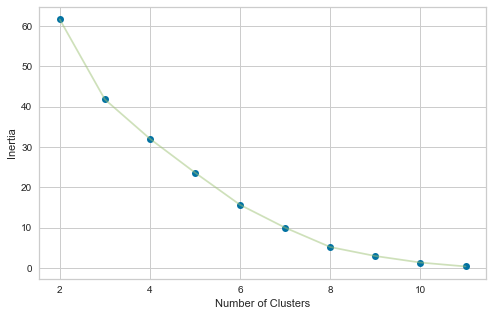

In [53]:
def change_n_clusters(n_clusters, data):
    sum_of_squared_distance = []
    for n_cluster in n_clusters:
        kmeans = KMeans(n_clusters=n_cluster)
        kmeans.fit(data)
        sum_of_squared_distance.append(kmeans.inertia_)
        
    plt.figure(1 , figsize = (8, 5))
    plt.plot(n_clusters , sum_of_squared_distance , 'o')
    plt.plot(n_clusters , sum_of_squared_distance , '-' , alpha = 0.5)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

change_n_clusters([2,3,4,5,6,7,8,9,10,11],df.iloc[:,1:])

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
The default value of `n_init` will change from 10 to 'auto' in 1.4.

KElbowVisualizer(ax=<AxesSubplot:>, estimator=KMeans(n_clusters=9), k=(1, 10))

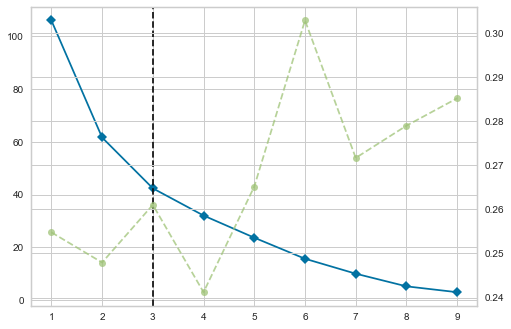

In [55]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,10))
visualizer.fit(df.iloc[:,1:])

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.


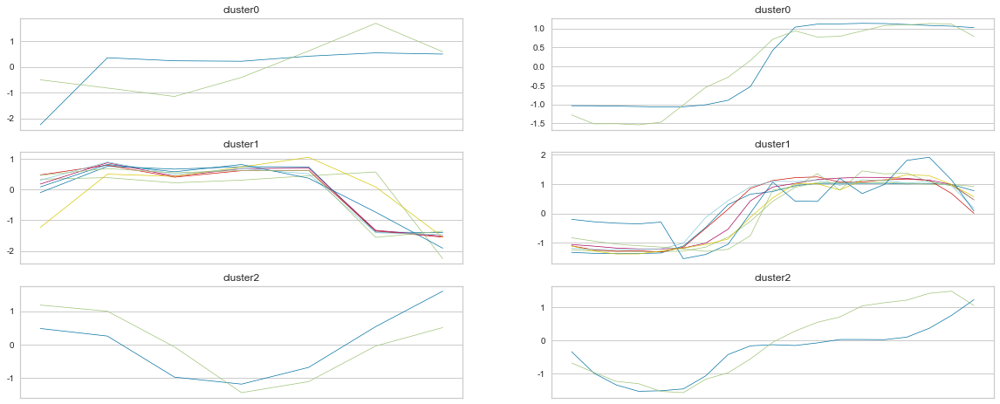

In [62]:
kmeans = KMeans(n_clusters=3, random_state = 2)
km_cluster = kmeans.fit_predict(df.iloc[:,1:])

df_clust = df.copy()
df_clust['km_cluster'] = km_cluster
df_clust['km_cluster'] = df_clust['km_cluster'].map({0:1, 1:2, 2:0})

# visualizing result of kmeans clustering
n_c = len(np.unique(df_clust.km_cluster)) 
n_c
fig = plt.figure(figsize = (20,8))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.


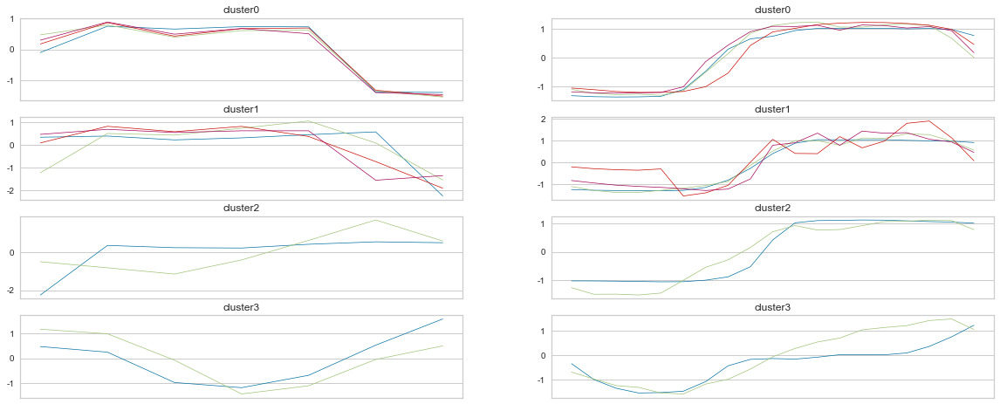

In [57]:
kmeans = KMeans(n_clusters=4, random_state = 2)
km_cluster = kmeans.fit_predict(df.iloc[:,1:])

df_clust = df.copy()
df_clust['km_cluster'] = km_cluster
df_clust['km_cluster'] = df_clust['km_cluster'].map({0:1, 1:3, 2:2, 3:0})

# visualizing result of kmeans clustering
n_c = len(np.unique(df_clust.km_cluster)) 

fig = plt.figure(figsize = (20,8))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.


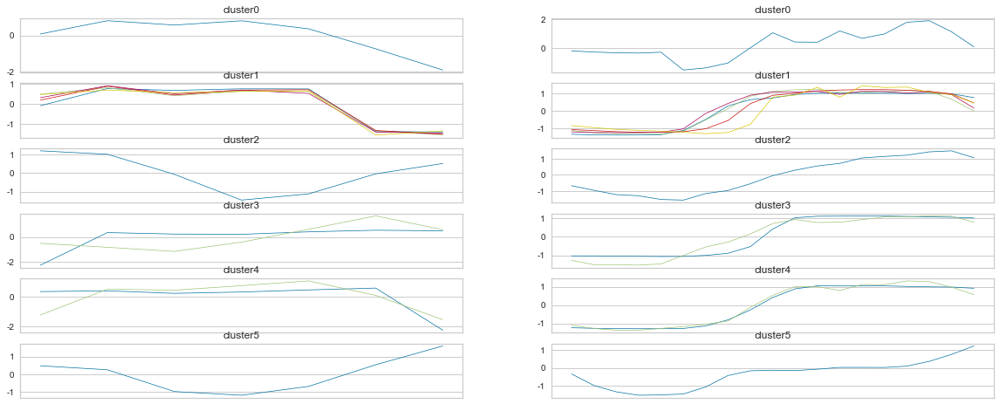

In [77]:
kmeans = KMeans(n_clusters=6, random_state = 2)
km_cluster = kmeans.fit_predict(df.iloc[:,1:])

df_clust = df.copy()
df_clust['km_cluster'] = km_cluster
df_clust['km_cluster'] = df_clust['km_cluster'].map({0:1, 1:2, 2:3, 3:4, 4:5, 5:0})

# visualizing result of kmeans clustering
n_c = len(np.unique(df_clust.km_cluster)) 

fig = plt.figure(figsize = (20,8))
for c in range(n_c):
    temp = df_clust[df_clust.km_cluster == c]
    plt.subplot(n_c,2,2*c+1)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,1:8], linewidth=0.7, )
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])
    plt.subplot(n_c,2,2*c+2)
    for i in range(len(temp)):
        plt.plot(temp.iloc[i,8:-6], linewidth=0.7)
        plt.title(f'cluster{c}')
        plt.xlabel('')
        plt.xticks([])

In [78]:
train = train.merge(df_clust[['building_type','km_cluster']], on = 'building_type', how = 'left')
test = test.merge(df_clust[['building_type','km_cluster']], on = 'building_type', how = 'left')
train

,building_number,date_time,temperature,windspeed,humidity,power_consumption,building_type,total_area,cooling_area,solar_power_capacity,...,discomfort_mean,CDH_mean,air_yes,solar_yes,ess_yes,sy_ey,sy_en,date,sensory_temperature,km_cluster
0,1,2022-06-01 00:00:00,18.6,0.9,42.0,1085.28,Other Buildings,110634.00,39570.00,0.0,...,74.852219,-11.172222,1.0,0.0,0.0,0.0,0.0,2022-06-01,20.751584,4
1,1,2022-06-01 01:00:00,18.0,1.1,45.0,1047.36,Other Buildings,110634.00,39570.00,0.0,...,74.852219,-11.172222,1.0,0.0,0.0,0.0,0.0,2022-06-01,20.008954,4
2,1,2022-06-01 02:00:00,17.7,1.5,45.0,974.88,Other Buildings,110634.00,39570.00,0.0,...,74.852219,-11.172222,1.0,0.0,0.0,0.0,0.0,2022-06-01,19.476910,4
3,1,2022-06-01 03:00:00,16.7,1.4,48.0,953.76,Other Buildings,110634.00,39570.00,0.0,...,74.852219,-11.172222,1.0,0.0,0.0,0.0,0.0,2022-06-01,18.487958,4
4,1,2022-06-01 04:00:00,18.4,2.8,43.0,986.40,Other Buildings,110634.00,39570.00,0.0,...,74.852219,-11.172222,1.0,0.0,0.0,0.0,0.0,2022-06-01,19.751534,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100,2022-07-31 19:00:00,26.2,2.0,93.0,1232.64,Hotel and Resort,57497.84,40035.23,0.0,...,78.140069,9.150000,1.0,0.0,0.0,0.0,0.0,2022-07-31,28.306459,3
203996,100,2022-07-31 20:00:00,25.8,2.0,94.0,1103.28,Hotel and Resort,57497.84,40035.23,0.0,...,78.140069,9.150000,1.0,0.0,0.0,0.0,0.0,2022-07-31,27.880657,3
203997,100,2022-07-31 21:00:00,25.6,0.7,95.0,964.56,Hotel and Resort,57497.84,40035.23,0.0,...,78.140069,9.150000,1.0,0.0,0.0,0.0,0.0,2022-07-31,27.878451,3
203998,100,2022-07-31 22:00:00,25.4,1.7,97.0,773.28,Hotel and Resort,57497.84,40035.23,0.0,...,78.140069,9.150000,1.0,0.0,0.0,0.0,0.0,2022-07-31,27.492106,3


In [84]:
print(train[train.km_cluster==0].building_type.unique(), len(train[train.km_cluster==0]))
print(train[train.km_cluster==1].building_type.unique(), len(train[train.km_cluster==1]))
print(train[train.km_cluster==2].building_type.unique(), len(train[train.km_cluster==2]))
print(train[train.km_cluster==3].building_type.unique(), len(train[train.km_cluster==3]))
print(train[train.km_cluster==4].building_type.unique(), len(train[train.km_cluster==4]))
print(train[train.km_cluster==5].building_type.unique(), len(train[train.km_cluster==5]))

['Research Institute'] 16320
['Public' 'University' 'Hospital' 'Commercial' 'Knowledge Industry Center'] 81600
['Data Center'] 10200
['Department Store and Outlet' 'Hotel and Resort'] 32640
['Other Buildings' 'Discount Mart'] 46920
['Apartment'] 16320


In [85]:
train.to_csv('./data/train_0821.csv', encoding='cp949', index=False)
test.to_csv('./data/test_0821.csv', encoding='cp949', index=False)

In [3]:
from sklearn.preprocessing import LabelEncoder

train = pd.read_csv('./data/train_0821.csv', encoding='cp949')

train.solar_yes = train.solar_yes.astype(int)
train.ess_yes = train.ess_yes.astype(int)
train.sy_ey = train.sy_ey.astype(int)
train.sy_en = train.sy_en.astype(int)

# train.drop(['building_number','date_time','building_type'])

train['hour_sin'] = np.sin(2 * np.pi * train['hour']/23.0)
train['hour_cos'] = np.cos(2 * np.pi * train['hour']/23.0)

train['date_sin'] = -np.sin(2 * np.pi * (train['month']+train['day']/31)/12)
train['date_cos'] = -np.cos(2 * np.pi * (train['month']+train['day']/31)/12)

train['month_sin'] = -np.sin(2 * np.pi * train['month']/12.0)
train['month_cos'] = -np.cos(2 * np.pi * train['month']/12.0)
## cyclic transformation on weekday
train['weekday_sin'] = -np.sin(2 * np.pi * (train['weekday']+1)/7.0)
train['weekday_cos'] = -np.cos(2 * np.pi * (train['weekday']+1)/7.0)


train['work_time'] = 0
train['low_day'] = 0
train['particular'] = 0
trains = [train[train.building_number == num] for num in range(1,101,1)]
# aa = trains[9]
# aa['work_time']  = (aa['hour'].isin([6,7,8])).astype(int)
# aa.describe()

## cluster 0
for num in [10,13]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7,8])).astype(int)
    
    trains[num-1] = temp_df
for num in [14]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7])).astype(int)
    temp_df['particular'] = temp_df['hour'].isin([0,8,12,18]).astype(int)
    trains[num-1] = temp_df
for num in [15]:
    temp_df = trains[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([4,5,6,7,8])).astype(int)
    trains[num-1] = temp_df

## cluster 1
for num in [17,18,19,21,22,69,70,72]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [26,28,76,78,80,82,83,84]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [71]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)*(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = (((temp_df['weekday']==5)&(temp_df['hour'].isin([10,11,13,14])))
                               |((temp_df['weekday'].isin([0,1,2,3,4,5]))&(temp_df['hour'].isin([0,1,2,3,4])))).astype(int)
    trains[num-1] = temp_df
for num in [53]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=4)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [55]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=19)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [50]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [56]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = ((temp_df['weekday']==2)&(temp_df['hour']==16)).astype(int)
    trains[num-1] = temp_df
for num in [60]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [20,23]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [58,59,77]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [27,74,79]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [57]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [24,25]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [29,30]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [31]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    trains[num-1] = temp_df
for num in [50]:
    temp_df = trains[num-1]
    temp_df['particular'] = (((temp_df['weekday']==2)&(temp_df['hour']==16))|((temp_df['weekday']==2)&(temp_df['hour']==16))).astype(int)
    trains[num-1] = temp_df
for num in [1]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [8]:
    temp_df = trains[num-1]
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [12]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    trains[num-1] = temp_df
for num in [88,90]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    trains[num-1] = temp_df
for num in [86]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    temp_df['particular'] = ((temp_df['month']==6)&(temp_df['day']==26)).astype(int)
    trains[num-1] = temp_df
for num in [87,89,91]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=9)).astype(int)
    trains[num-1] = temp_df
for num in [4]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    trains[num-1] = temp_df
for num in [7,16]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=5)).astype(int)
    trains[num-1] = temp_df
for num in [9]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=23)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [11]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [36]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    trains[num-1] = temp_df
for num in [75]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=15)&(temp_df['hour']>=7)).astype(int)
    trains[num-1] = temp_df
for num in [92]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=6)).astype(int)
    trains[num-1] = temp_df

## cluster 2
for num in [32,33,34]:
    temp_df = trains[num-1]
    temp_df = temp_df[temp_df.month>=7]
    trains[num-1] = temp_df
for num in [61,65,66,67,68]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df
for num in [62,63,64]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df

## cluster 3
for num in [93,94,96,97,98,100]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=6)&(temp_df['hour']<=22)).astype(int)
    trains[num-1] = temp_df
for num in [42,43,44]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=20)).astype(int)
    trains[num-1] = temp_df
for num in [2,85,99]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [38,40,95]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=20)).astype(int)
    trains[num-1] = temp_df
for num in [3,81]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [6,41]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=22)).astype(int)
    trains[num-1] = temp_df
for num in [37,39]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=21)).astype(int)
    trains[num-1] = temp_df
for num in [35]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    trains[num-1] = temp_df
for num in [54]:
    temp_df = trains[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=5)&(temp_df['hour']<=20)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==0).astype(int)
    trains[num-1] = temp_df
for num in [5]:
    temp_df = trains[num-1]
    temp_df['particular'] = (((temp_df['weekday']==4)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==5)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==6)&(temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18])))).astype(int)
    trains[num-1] = temp_df
    

df = pd.concat(trains, ignore_index=True)
df = df.drop(['date_time','hour','day','month','weekday','date'], axis=1)



df_0 = df[df.km_cluster==0]
df_1 = df[df.km_cluster==1]
df_2 = df[df.km_cluster==2]
df_3 = df[df.km_cluster==3]
df_4 = df[df.km_cluster==4]
df_5 = df[df.km_cluster==5]




X_0 = df_0.drop('power_consumption', axis=1)
y_0 = df_0['power_consumption']
y_0_log = np.log(y_0)
X_0_train = X_0.drop('km_cluster', axis=1)

X_1 = df_1.drop('power_consumption', axis=1)
y_1 = df_1['power_consumption']
y_1_log = np.log(y_1)
X_1_train = X_1.drop('km_cluster', axis=1)

X_2 = df_2.drop('power_consumption', axis=1)
y_2 = df_2['power_consumption']
y_2_log = np.log(y_2)
X_2_train = X_2.drop('km_cluster', axis=1)

X_3 = df_3.drop('power_consumption', axis=1)
y_3 = df_3['power_consumption']
y_3_log = np.log(y_3)
X_3_train = X_3.drop('km_cluster', axis=1)

X_4 = df_4.drop('power_consumption', axis=1)
y_4 = df_4['power_consumption']
y_4_log = np.log(y_4)
X_4_train = X_4.drop('km_cluster', axis=1)

X_5 = df_5.drop('power_consumption', axis=1)
y_5 = df_5['power_consumption']
y_5_log = np.log(y_5)
X_5_train = X_5.drop('km_cluster', axis=1)


# Standard Scaling for continuous data
con_li = ['hour_sin', 'hour_cos', 'date_sin', 'date_cos', 'month_sin', 'month_cos', 'weekday_sin', 'weekday_cos', 'temperature', 'windspeed', 
'humidity', 'total_area', 'cooling_area', 'solar_power_capacity', 'ess_capacity', 'pcs_capacity', 'discomfort', 'temperature_3', 
'discomfort_3', 'ma_dis_3', 'ma_dis_5', 'CDH', 'temperature_mean', 'discomfort_mean', 'CDH_mean', 'sensory_temperature']

# ## one-hot encoding for categorical data
cat_li = ['building_number', 'holiday','air_yes','solar_yes',
         'ess_yes','sy_ey','sy_en','low_day','particular']

T = [X_0_train,X_1_train,X_2_train,X_3_train,X_4_train,X_5_train]

for train in T :


    for col in con_li :
        if train[col].std() == 0:
            train = train.drop(col, axis=1)
        else :
            train[col] = (train[col] - train[col].mean())/train[col].std()

    for col in cat_li :
        if train[col].nunique() == 1:        
            train = train.drop(col,axis=1)
        
    
X_0_train = X_0_train.drop('building_type', axis=1)
X_2_train = X_2_train.drop('building_type', axis=1)
X_5_train = X_5_train.drop('building_type', axis=1)

X_1_train.building_type = X_1_train.building_type.astype('category')
X_1_train = pd.get_dummies(X_1_train)
X_3_train.building_type = X_3_train.building_type.astype('category')
X_3_train = pd.get_dummies(X_3_train)
X_4_train.building_type = X_4_train.building_type.astype('category')
X_4_train = pd.get_dummies(X_4_train)

        
        
train = pd.read_csv('./data/train_0821.csv', encoding='cp949')
test = pd.read_csv('./data/test_0821.csv', encoding='cp949')
# cluster_dict = train.groupby('building_number')['km_cluster'].first().to_dict()
# test['km_cluster'] = test['building_number'].map(cluster_dict)

test.solar_yes = test.solar_yes.astype(int)
test.ess_yes = test.ess_yes.astype(int)
test.sy_ey = test.sy_ey.astype(int)
test.sy_en = test.sy_en.astype(int)

# test.drop(['building_number','date_time','building_type'])

test['hour_sin'] = np.sin(2 * np.pi * test['hour']/23.0)
test['hour_cos'] = np.cos(2 * np.pi * test['hour']/23.0)

test['date_sin'] = -np.sin(2 * np.pi * (test['month']+test['day']/31)/12)
test['date_cos'] = -np.cos(2 * np.pi * (test['month']+test['day']/31)/12)

test['month_sin'] = -np.sin(2 * np.pi * test['month']/12.0)
test['month_cos'] = -np.cos(2 * np.pi * test['month']/12.0)
## cyclic transformation on weekday
test['weekday_sin'] = -np.sin(2 * np.pi * (test['weekday']+1)/7.0)
test['weekday_cos'] = -np.cos(2 * np.pi * (test['weekday']+1)/7.0)


test['work_time'] = 0
test['low_day'] = 0
test['particular'] = 0
tests = [test[test.building_number == num] for num in range(1,101,1)]
# aa = tests[9]
# aa['work_time']  = (aa['hour'].isin([6,7,8])).astype(int)
# aa.describe()

## cluster 0
for num in [10,13]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7,8])).astype(int)
    
    tests[num-1] = temp_df
for num in [14]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([6,7])).astype(int)
    temp_df['particular'] = temp_df['hour'].isin([0,8,12,18]).astype(int)
    tests[num-1] = temp_df
for num in [15]:
    temp_df = tests[num-1]
    temp_df['work_time'] = (temp_df['hour'].isin([4,5,6,7,8])).astype(int)
    tests[num-1] = temp_df

## cluster 1
for num in [17,18,19,21,22,69,70,72]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [26,28,76,78,80,82,83,84]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [71]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)*(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = (((temp_df['weekday']==5)&(temp_df['hour'].isin([10,11,13,14])))
                               |((temp_df['weekday'].isin([0,1,2,3,4,5]))&(temp_df['hour'].isin([0,1,2,3,4])))).astype(int)
    tests[num-1] = temp_df
for num in [53]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=4)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [55]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=19)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [50]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [56]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    temp_df['particular'] = ((temp_df['weekday']==2)&(temp_df['hour']==16)).astype(int)
    tests[num-1] = temp_df
for num in [60]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [20,23]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [58,59,77]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [45,46,47,48,49,51,52,73]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=6)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [27,74,79]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [57]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [24,25]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=8)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [29,30]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=17)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [31]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    temp_df['low_day'] = (temp_df['weekday'].isin([5,6])).astype(int)
    tests[num-1] = temp_df
for num in [50]:
    temp_df = tests[num-1]
    temp_df['particular'] = (((temp_df['weekday']==2)&(temp_df['hour']==16))|((temp_df['weekday']==2)&(temp_df['hour']==16))).astype(int)
    tests[num-1] = temp_df
for num in [1]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [8]:
    temp_df = tests[num-1]
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [12]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=5)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==6).astype(int)
    tests[num-1] = temp_df
for num in [88,90]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    tests[num-1] = temp_df
for num in [86]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=8)).astype(int)
    temp_df['particular'] = ((temp_df['month']==6)&(temp_df['day']==26)).astype(int)
    tests[num-1] = temp_df
for num in [87,89,91]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=9)).astype(int)
    tests[num-1] = temp_df
for num in [4]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=18)&(temp_df['hour']>=8)).astype(int)
    tests[num-1] = temp_df
for num in [7,16]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=5)).astype(int)
    tests[num-1] = temp_df
for num in [9]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=23)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [11]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=21)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [36]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=20)&(temp_df['hour']>=9)).astype(int)
    tests[num-1] = temp_df
for num in [75]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=15)&(temp_df['hour']>=7)).astype(int)
    tests[num-1] = temp_df
for num in [92]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']<=22)&(temp_df['hour']>=6)).astype(int)
    tests[num-1] = temp_df

## cluster 2
for num in [32,33,34]:
    temp_df = tests[num-1]
    temp_df = temp_df[temp_df.month>=7]
    tests[num-1] = temp_df
for num in [61,65,66,67,68]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df
for num in [62,63,64]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df

## cluster 3
for num in [93,94,96,97,98,100]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=6)&(temp_df['hour']<=22)).astype(int)
    tests[num-1] = temp_df
for num in [42,43,44]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=20)).astype(int)
    tests[num-1] = temp_df
for num in [2,85,99]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [38,40,95]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=20)).astype(int)
    tests[num-1] = temp_df
for num in [3,81]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=9)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [6,41]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=8)&(temp_df['hour']<=22)).astype(int)
    tests[num-1] = temp_df
for num in [37,39]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=21)).astype(int)
    tests[num-1] = temp_df
for num in [35]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=7)&(temp_df['hour']<=23)).astype(int)
    tests[num-1] = temp_df
for num in [54]:
    temp_df = tests[num-1]
    temp_df['work_time'] = ((temp_df['hour']>=5)&(temp_df['hour']<=20)).astype(int)
    temp_df['low_day'] = (temp_df['weekday']==0).astype(int)
    tests[num-1] = temp_df
for num in [5]:
    temp_df = tests[num-1]
    temp_df['particular'] = (((temp_df['weekday']==4)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==5)&(temp_df['hour'].isin([11,12,13,14,15,16,17,18,19,20])))|
                              ((temp_df['weekday']==6)&(temp_df['hour'].isin([8,9,10,11,12,13,14,15,16,17,18])))).astype(int)
    tests[num-1] = temp_df
    

df = pd.concat(tests, ignore_index=True)
df = df.drop(['date_time','hour','day','month','weekday','date'], axis=1)
df.building_type = df.building_type.astype('category')

df_0 = df[df.km_cluster==0]
df_1 = df[df.km_cluster==1]
df_2 = df[df.km_cluster==2]
df_3 = df[df.km_cluster==3]
df_4 = df[df.km_cluster==4]
df_5 = df[df.km_cluster==5]

X_0_test = df_0.drop('km_cluster', axis=1)
X_1_test = df_1.drop('km_cluster', axis=1)
X_2_test = df_2.drop('km_cluster', axis=1)
X_3_test = df_3.drop('km_cluster', axis=1)
X_4_test = df_4.drop('km_cluster', axis=1)
X_5_test = df_5.drop('km_cluster', axis=1)


# Standard Scaling for continuous data
con_li = ['hour_sin', 'hour_cos', 'date_sin', 'date_cos', 'month_sin', 'month_cos', 'weekday_sin', 'weekday_cos', 'temperature', 'windspeed', 
'humidity', 'total_area', 'cooling_area', 'solar_power_capacity', 'ess_capacity', 'pcs_capacity', 'discomfort', 'temperature_3', 
'discomfort_3', 'ma_dis_3', 'ma_dis_5', 'CDH', 'temperature_mean', 'discomfort_mean', 'CDH_mean', 'sensory_temperature']


cat_li = ['building_number','building_type','holiday','air_yes','solar_yes',
         'ess_yes','sy_ey','sy_en','low_day','particular']

T = [X_0_test, X_1_test, X_2_test, X_3_test, X_4_test, X_5_test]

for test in T :
    for col in con_li :
        if test[col].std() == 0:
            test = test.drop(col, axis=1)
        else :
            test[col] = (test[col] - test[col].mean())/test[col].std()

    for col in cat_li :
        if test[col].nunique() == 1:        
            test = test.drop(col,axis=1)
    test = pd.get_dummies(test)

X_0_test = X_0_test.drop('building_type', axis=1)
X_2_test = X_2_test.drop('building_type', axis=1)
X_5_test = X_5_test.drop('building_type', axis=1)

X_1_test.building_type = X_1_test.building_type.astype('category')
X_1_test = pd.get_dummies(X_1_test)
X_3_test.building_type = X_3_test.building_type.astype('category')
X_3_test = pd.get_dummies(X_3_test)
X_4_test.building_type = X_4_test.building_type.astype('category')
X_4_test = pd.get_dummies(X_4_test)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [89]:
print(len(X_0_train),len(X_0_test))
print(len(X_1_train),len(X_1_test))
print(len(X_2_train),len(X_2_test))
print(len(X_3_train),len(X_3_test))
print(len(X_4_train),len(X_4_test))
print(len(X_5_train),len(X_5_test))

16320 1344
81600 6720
8040 840
32640 2688
46920 3864
16320 1344


In [91]:
print(len(X_0_train)+len(X_1_train)+len(X_2_train)+len(X_3_train)+len(X_4_train)+len(X_5_train))
print(len(X_0_test)+len(X_1_test)+len(X_2_test)+len(X_3_test)+len(X_4_test)+len(X_5_test))

201840
16800


In [93]:
from sktime.forecasting.model_selection import temporal_train_test_split

cols = X_0_train.columns
y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_0_log,X=X_0_train, test_size=168)

xgbr_0 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_0.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_0.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-230.11151
[1]	validation_0-logloss:-233.28817
[2]	validation_0-logloss:-234.87258
[3]	validation_0-logloss:-235.79716
[4]	validation_0-logloss:-236.36430
[5]	validation_0-logloss:-236.74925
[6]	validation_0-logloss:-236.99389
[7]	validation_0-logloss:-237.16700
[8]	validation_0-logloss:-237.28382


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[9]	validation_0-logloss:-237.36136
[10]	validation_0-logloss:-237.41678
[11]	validation_0-logloss:-237.45218
[12]	validation_0-logloss:-237.47994
[13]	validation_0-logloss:-237.49948
[14]	validation_0-logloss:-237.51402
[15]	validation_0-logloss:-237.52382
[16]	validation_0-logloss:-237.53040
[17]	validation_0-logloss:-237.53597
[18]	validation_0-logloss:-237.53939
[19]	validation_0-logloss:-237.54163
[20]	validation_0-logloss:-237.53327
[21]	validation_0-logloss:-237.53451
[22]	validation_0-logloss:-237.53527
[23]	validation_0-logloss:-237.53398
[24]	validation_0-logloss:-237.53485
[25]	validation_0-logloss:-237.53494
[26]	validation_0-logloss:-237.53136
[27]	validation_0-logloss:-237.53120
[28]	validation_0-logloss:-237.53126
[29]	validation_0-logloss:-237.53123
[30]	validation_0-logloss:-237.53444
[31]	validation_0-logloss:-237.53482
[32]	validation_0-logloss:-237.53444
[33]	validation_0-logloss:-237.53421
[34]	validation_0-logloss:-237.53451
[35]	validation_0-logloss:-237.53495
[3

,feature,importances
0,total_area,0.758673
1,holiday,0.057668
2,hour_cos,0.051077
3,building_number,0.042683
4,work_time,0.026413
5,low_day,0.015837
6,date_sin,0.009599
7,hour_sin,0.004525
8,temperature_mean,0.004384
9,discomfort,0.004046


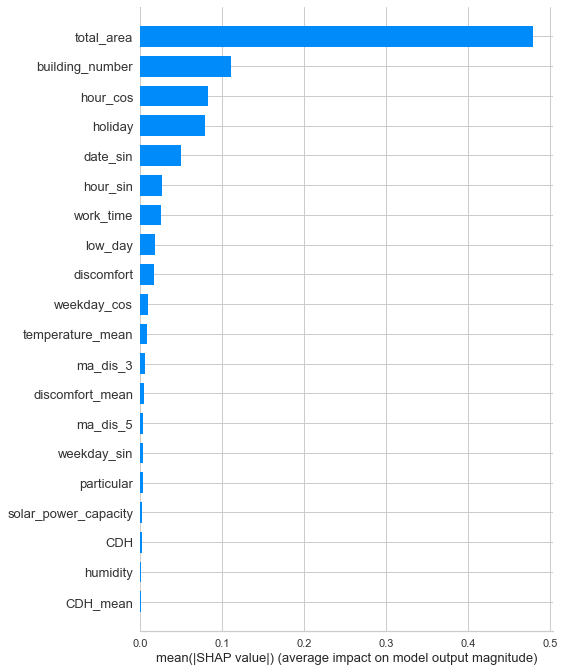

In [95]:
import shap

shap.initjs()

explainer = shap.TreeExplainer(xgbr_0)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [98]:
from sktime.forecasting.model_selection import temporal_train_test_split

cols = X_1_train.columns
y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_1_log,X=X_1_train, test_size=168)

xgbr_1 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_1.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_1.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-243.36353
[1]	validation_0-logloss:-246.64815


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[2]	validation_0-logloss:-248.37151
[3]	validation_0-logloss:-249.37669
[4]	validation_0-logloss:-250.01888
[5]	validation_0-logloss:-250.42027
[6]	validation_0-logloss:-250.67720
[7]	validation_0-logloss:-250.86074
[8]	validation_0-logloss:-251.01263
[9]	validation_0-logloss:-251.11163
[10]	validation_0-logloss:-251.18353
[11]	validation_0-logloss:-251.21916
[12]	validation_0-logloss:-251.26981
[13]	validation_0-logloss:-251.31323
[14]	validation_0-logloss:-251.33728
[15]	validation_0-logloss:-251.34609
[16]	validation_0-logloss:-251.35776
[17]	validation_0-logloss:-251.36811
[18]	validation_0-logloss:-251.37692
[19]	validation_0-logloss:-251.38704
[20]	validation_0-logloss:-251.38774
[21]	validation_0-logloss:-251.39007
[22]	validation_0-logloss:-251.39822
[23]	validation_0-logloss:-251.39941
[24]	validation_0-logloss:-251.39868
[25]	validation_0-logloss:-251.40443
[26]	validation_0-logloss:-251.40471
[27]	validation_0-logloss:-251.40583
[28]	validation_0-logloss:-251.40583
[29]	vali

,feature,importances
0,building_type_Hospital,0.298119
1,cooling_area,0.205862
2,work_time,0.135759
3,solar_power_capacity,0.093432
4,low_day,0.051774
5,total_area,0.045309
6,sy_ey,0.036687
7,building_number,0.035565
8,building_type_University,0.021275
9,holiday,0.020690


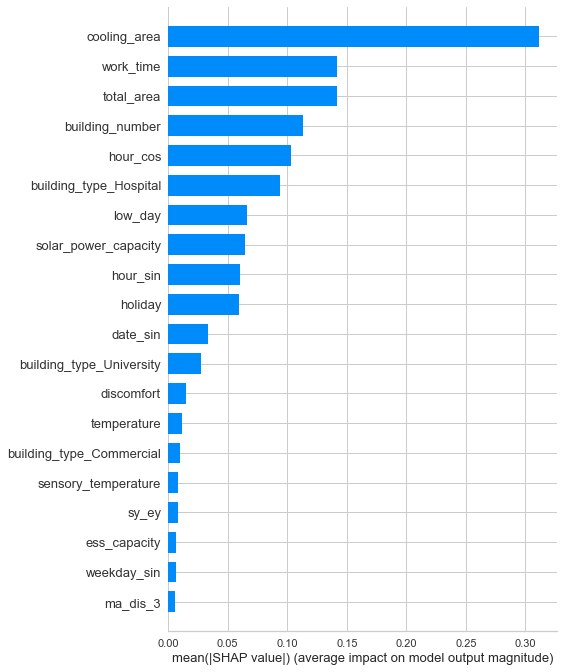

In [99]:
import shap

shap.initjs()

explainer = shap.TreeExplainer(xgbr_1)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [100]:
from sktime.forecasting.model_selection import temporal_train_test_split

cols = X_2_train.columns
y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_2_log,X=X_2_train, test_size=168)

xgbr_2 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_2.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_2.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-265.00397
[1]	validation_0-logloss:-268.61730
[2]	validation_0-logloss:-270.37479
[3]	validation_0-logloss:-271.42980
[4]	validation_0-logloss:-272.09330
[5]	validation_0-logloss:-272.52704
[6]	validation_0-logloss:-272.81727
[7]	validation_0-logloss:-273.01983
[8]	validation_0-logloss:-273.15443
[9]	validation_0-logloss:-273.24702
[10]	validation_0-logloss:-273.31143
[11]	validation_0-logloss:-273.35733
[12]	validation_0-logloss:-273.39029
[13]	validation_0-logloss:-273.41190
[14]	validation_0-logloss:-273.42784
[15]	validation_0-logloss:-273.43879
[16]	validation_0-logloss:-273.44589
[17]	validation_0-logloss:-273.45152
[18]	validation_0-logloss:-273.45463
[19]	validation_0-logloss:-273.45540
[20]	validation_0-logloss:-273.45706


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[21]	validation_0-logloss:-273.45805
[22]	validation_0-logloss:-273.45889
[23]	validation_0-logloss:-273.45916
[24]	validation_0-logloss:-273.45961
[25]	validation_0-logloss:-273.45923
[26]	validation_0-logloss:-273.45938
[27]	validation_0-logloss:-273.45947
[28]	validation_0-logloss:-273.45917
[29]	validation_0-logloss:-273.45910
[30]	validation_0-logloss:-273.45915
[31]	validation_0-logloss:-273.45916
[32]	validation_0-logloss:-273.45909
[33]	validation_0-logloss:-273.45917
[34]	validation_0-logloss:-273.45910
[35]	validation_0-logloss:-273.45873
[36]	validation_0-logloss:-273.45879
[37]	validation_0-logloss:-273.45879
[38]	validation_0-logloss:-273.45877
[39]	validation_0-logloss:-273.45882
[40]	validation_0-logloss:-273.45862
[41]	validation_0-logloss:-273.45860
[42]	validation_0-logloss:-273.45858
[43]	validation_0-logloss:-273.45874
[44]	validation_0-logloss:-273.45878
[45]	validation_0-logloss:-273.45877
[46]	validation_0-logloss:-273.45876
[47]	validation_0-logloss:-273.45883
[

,feature,importances
0,building_number,0.899669
1,cooling_area,0.098968
2,discomfort,0.000339
3,temperature,0.000213
4,holiday,0.000133
5,sensory_temperature,0.000131
6,hour_sin,0.000099
7,date_sin,0.000090
8,ma_dis_3,0.000069
9,hour_cos,0.000066


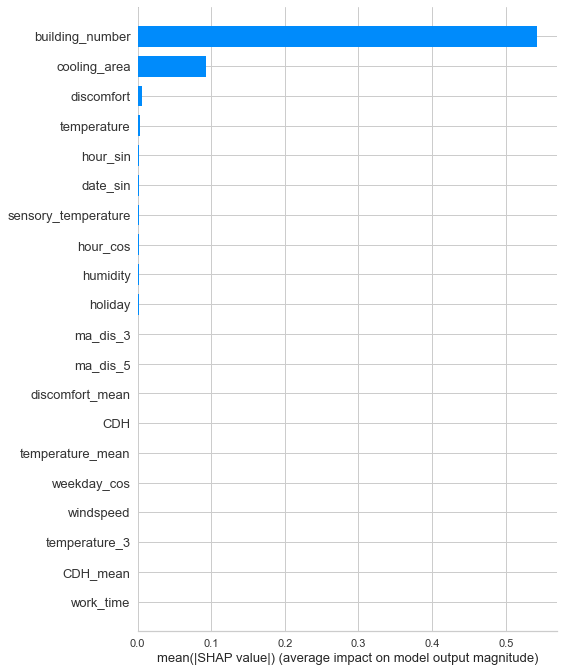

In [101]:
import shap

shap.initjs()

explainer = shap.TreeExplainer(xgbr_2)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [103]:
from sktime.forecasting.model_selection import temporal_train_test_split

cols = X_3_train.columns
y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_3_log,X=X_3_train, test_size=168)

xgbr_3 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_3.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_3.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-215.62851
[1]	validation_0-logloss:-218.63763
[2]	validation_0-logloss:-220.13295
[3]	validation_0-logloss:-220.99298
[4]	validation_0-logloss:-221.55773
[5]	validation_0-logloss:-221.92699


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[6]	validation_0-logloss:-222.17114
[7]	validation_0-logloss:-222.32719
[8]	validation_0-logloss:-222.44350
[9]	validation_0-logloss:-222.51268
[10]	validation_0-logloss:-222.56744
[11]	validation_0-logloss:-222.60986
[12]	validation_0-logloss:-222.63572
[13]	validation_0-logloss:-222.65362
[14]	validation_0-logloss:-222.65772
[15]	validation_0-logloss:-222.66756
[16]	validation_0-logloss:-222.67412
[17]	validation_0-logloss:-222.67203
[18]	validation_0-logloss:-222.67359
[19]	validation_0-logloss:-222.67584
[20]	validation_0-logloss:-222.67447
[21]	validation_0-logloss:-222.67550
[22]	validation_0-logloss:-222.67534
[23]	validation_0-logloss:-222.67319
[24]	validation_0-logloss:-222.67483
[25]	validation_0-logloss:-222.67277
[26]	validation_0-logloss:-222.67294
[27]	validation_0-logloss:-222.67199
[28]	validation_0-logloss:-222.67026
[29]	validation_0-logloss:-222.66954
[30]	validation_0-logloss:-222.66873
[31]	validation_0-logloss:-222.66738
[32]	validation_0-logloss:-222.66680
[33]	

,feature,importances
0,work_time,0.780611
1,total_area,0.120544
2,cooling_area,0.042611
3,building_number,0.010991
4,hour_cos,0.010558
5,hour_sin,0.007630
6,temperature,0.005386
7,holiday,0.003092
8,discomfort,0.003075
9,weekday_sin,0.002581


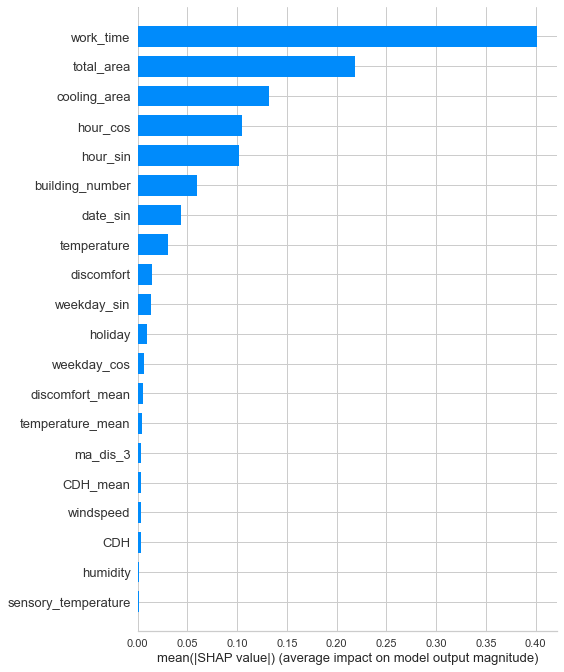

In [104]:
import shap

shap.initjs()

explainer = shap.TreeExplainer(xgbr_3)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [105]:
from sktime.forecasting.model_selection import temporal_train_test_split

cols = X_4_train.columns
y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_4_log,X=X_4_train, test_size=168)

xgbr_4 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_4.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_4.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-229.53772
[1]	validation_0-logloss:-232.69418
[2]	validation_0-logloss:-234.27978
[3]	validation_0-logloss:-235.19398


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[4]	validation_0-logloss:-235.79688
[5]	validation_0-logloss:-236.16961
[6]	validation_0-logloss:-236.42726
[7]	validation_0-logloss:-236.60247
[8]	validation_0-logloss:-236.72786
[9]	validation_0-logloss:-236.80379
[10]	validation_0-logloss:-236.85823
[11]	validation_0-logloss:-236.89328
[12]	validation_0-logloss:-236.91908
[13]	validation_0-logloss:-236.94189
[14]	validation_0-logloss:-236.95272
[15]	validation_0-logloss:-236.96302
[16]	validation_0-logloss:-236.96749
[17]	validation_0-logloss:-236.97199
[18]	validation_0-logloss:-236.97471
[19]	validation_0-logloss:-236.97822
[20]	validation_0-logloss:-236.97905
[21]	validation_0-logloss:-236.97997
[22]	validation_0-logloss:-236.97758
[23]	validation_0-logloss:-236.97751
[24]	validation_0-logloss:-236.98040
[25]	validation_0-logloss:-236.98195
[26]	validation_0-logloss:-236.98103
[27]	validation_0-logloss:-236.97920
[28]	validation_0-logloss:-236.98300
[29]	validation_0-logloss:-236.98257
[30]	validation_0-logloss:-236.98291
[31]	va

,feature,importances
0,work_time,0.418291
1,building_number,0.106034
2,total_area,0.102342
3,particular,0.087141
4,hour_cos,0.055433
5,cooling_area,0.047200
6,hour_sin,0.038957
7,ess_capacity,0.036405
8,solar_power_capacity,0.021479
9,weekday_cos,0.014922


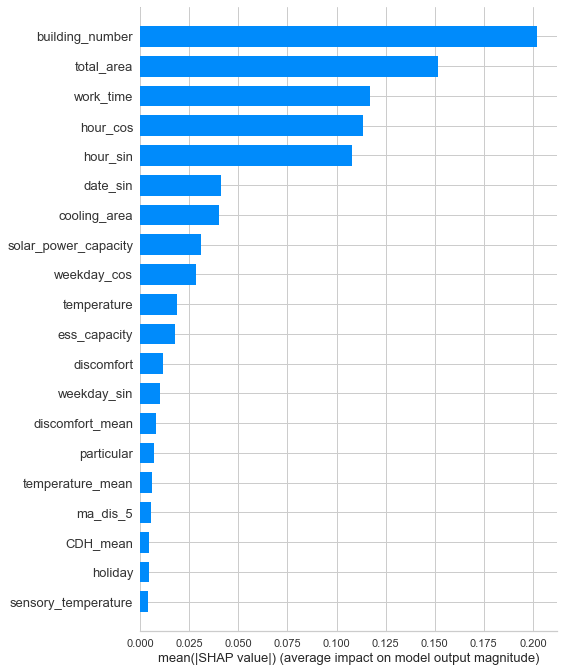

In [106]:
import shap

shap.initjs()

explainer = shap.TreeExplainer(xgbr_4)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [107]:
from sktime.forecasting.model_selection import temporal_train_test_split

cols = X_5_train.columns
y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_5_log,X=X_5_train, test_size=168)

xgbr_5 = XGBRegressor(objective='reg:squarederror', n_estimators=500)
xgbr_5.fit(X_train, y_train, early_stopping_rounds=50, eval_set=[(X_valid,y_valid)], eval_metric="logloss")

importance = xgbr_5.feature_importances_
feature = cols
importances = pd.DataFrame()
importances['feature'] = feature
importances['importances'] = importance
importances.sort_values('importances', ascending=False, inplace=True)
importances.reset_index(drop=True, inplace=True)
importances

[0]	validation_0-logloss:-254.95955
[1]	validation_0-logloss:-258.47673
[2]	validation_0-logloss:-260.23474
[3]	validation_0-logloss:-261.28185
[4]	validation_0-logloss:-261.93562
[5]	validation_0-logloss:-262.35996
[6]	validation_0-logloss:-262.64087
[7]	validation_0-logloss:-262.83903
[8]	validation_0-logloss:-262.97943
[9]	validation_0-logloss:-263.07306


`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[10]	validation_0-logloss:-263.13465
[11]	validation_0-logloss:-263.18156
[12]	validation_0-logloss:-263.21147
[13]	validation_0-logloss:-263.23161
[14]	validation_0-logloss:-263.24565
[15]	validation_0-logloss:-263.25488
[16]	validation_0-logloss:-263.26442
[17]	validation_0-logloss:-263.27093
[18]	validation_0-logloss:-263.27564
[19]	validation_0-logloss:-263.27867
[20]	validation_0-logloss:-263.28082
[21]	validation_0-logloss:-263.28251
[22]	validation_0-logloss:-263.28349
[23]	validation_0-logloss:-263.28646
[24]	validation_0-logloss:-263.28713
[25]	validation_0-logloss:-263.28608
[26]	validation_0-logloss:-263.28564
[27]	validation_0-logloss:-263.28578
[28]	validation_0-logloss:-263.28584
[29]	validation_0-logloss:-263.28672
[30]	validation_0-logloss:-263.28767
[31]	validation_0-logloss:-263.28798
[32]	validation_0-logloss:-263.28866
[33]	validation_0-logloss:-263.28920
[34]	validation_0-logloss:-263.28957
[35]	validation_0-logloss:-263.28960
[36]	validation_0-logloss:-263.28788
[

,feature,importances
0,cooling_area,0.448647
1,total_area,0.359955
2,work_time,0.107931
3,building_number,0.021195
4,ma_dis_5,0.021140
5,hour_cos,0.009396
6,date_sin,0.008835
7,hour_sin,0.008417
8,holiday,0.006458
9,CDH,0.002105


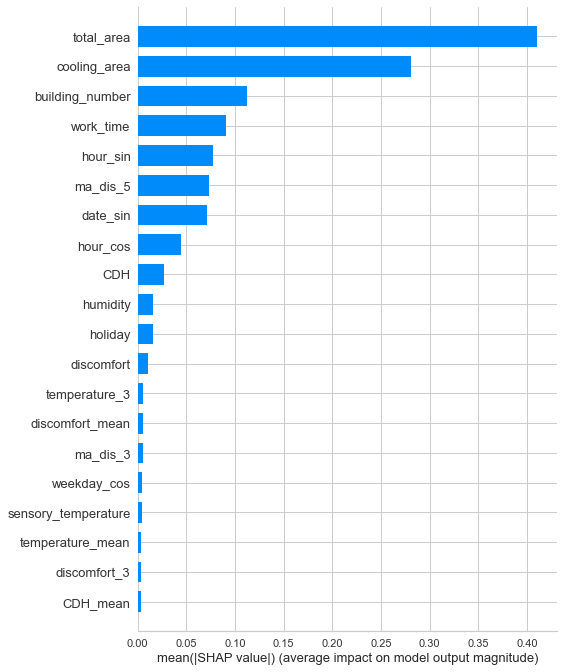

In [108]:
import shap

shap.initjs()

explainer = shap.TreeExplainer(xgbr_5)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, cols, plot_type="bar")

In [4]:
col_0 = ['building_number', 'total_area','hour_cos','holiday','date_sin','hour_sin','work_time','low_day','discomfort','temperature_mean']
col_1 = ['building_number', 'cooling_area','work_time','total_area','hour_cos','building_type_Hospital','low_day','solar_power_capacity',
        'hour_sin','holiday','building_type_University']
col_2 = ['building_number','cooling_area']
col_3 = ['building_number', 'work_time','total_area','cooling_area','hour_cos','hour_sin', 'date_sin','temperature']
col_4 = ['building_number','work_time','total_area','hour_cos','hour_sin','date_sin','cooling_area','solar_power_capacity','weekday_cos',
        'ess_capacity','discomfort']
col_5 = ['building_number','cooling_area','total_area','work_time','hour_sin','ma_dis_5','date_sin','hour_cos','CDH','holiday']

In [5]:
X_0_train = X_0_train[col_0]
X_1_train = X_1_train[col_1]
X_2_train = X_2_train[col_2]
X_3_train = X_3_train[col_3]
X_4_train = X_4_train[col_4]
X_5_train = X_5_train[col_5]

X_0_test = X_0_test[col_0]
X_1_test = X_1_test[col_1]
X_2_test = X_2_test[col_2]
X_3_test = X_3_test[col_3]
X_4_test = X_4_test[col_4]
X_5_test = X_5_test[col_5]

In [6]:
def smape(true, pred):
    v = 2 * abs(pred - true) / ((abs(pred) + abs(true)))
    result = np.mean(v) * 100
    return result

In [115]:
from catboost import CatBoostRegressor

y_train, y_valid, X_train, X_valid = temporal_train_test_split(y=y_0_log,X=X_0_train, test_size=168)

cat_0 = CatBoostRegressor(learning_rate=0.05, depth=15, l2_leaf_reg=2.5, min_child_samples=2, verbose = False)
cat_0.fit(X_train, y_train)

pred_0 = np.exp(np.array(cat_0.predict(X_test)))

print(f'cluster 0 train SMAPE : {smape(np.exp(np.array(y_valid)), pred_0)}')

cluster 0 train SMAPE : 8.299904400921884


In [129]:
len(X_0_train)

16320

In [136]:
from sklearn.metrics import make_scorer
m_smape = make_scorer(smape, greater_is_better = False)

In [ ]:
# from sklearn.model_selection import GridSearchCV

# trains = [X_0_train, X_1_train, X_2_train, X_3_train, X_4_train, X_5_train]
# ys = [y_0_log, y_1_log,y_2_log,y_3_log,y_4_log,y_5_log]

# bestli = []
# paramli = []
# for i, (train, y) in enumerate(zip(trains, ys)) :

#     params = {'learning_rate': np.arange(0.03,0.07,0.002),
#          'depth' : np.arange(10,20,1),
#          'l2_leaf_reg':np.arange(2.5, 4.0, 0.5),
#          'min_child_samples' : [1, 2, 4]
#          }

#     X_train, X_valid, y_train, y_valid = train_test_split(train, y, test_size=168*train.building_number.nunique())
    
#     pds = PredefinedSplit(np.append(-np.ones(len(train)-168*train.building_number.nunique()), np.zeros(168*train.building_number.nunique())))
#     cat = GridSearchCV(estimator=CatBoostRegressor(verbose=False), param_grid=params, cv= pds, scoring=m_smape)
#     cat.fit(X_train, y_train)
    
#     best = gcv.best_estimator_
#     params = gcv.best_params_
    
#     bestli.append(best)
#     paramli.append(params)
    
#     pred = np.exp(np.array(cat.predict(X_test)))
#     print(f'cluster {i} train SMAPE : {smape(np.exp(np.array(y_valid)), pred)}')

[I 2023-08-21 23:06:06,714] A new study created in memory with name: catboost-seed
[I 2023-08-21 23:08:18,134] Trial 7 finished with value: 2.635771396141235 and parameters: {'learning_rate': 0.043498893349112215, 'depth': 10, 'l2_leaf_reg': 3.0, 'min_child_samples': 2}. Best is trial 7 with value: 2.635771396141235.
[I 2023-08-21 23:09:32,249] Trial 1 finished with value: 2.5425845429949754 and parameters: {'learning_rate': 0.0407024623635204, 'depth': 10, 'l2_leaf_reg': 2.5, 'min_child_samples': 1}. Best is trial 1 with value: 2.5425845429949754.
[I 2023-08-21 23:10:51,015] Trial 6 finished with value: 2.595737404759077 and parameters: {'learning_rate': 0.060853562958103014, 'depth': 12, 'l2_leaf_reg': 3.5, 'min_child_samples': 2}. Best is trial 1 with value: 2.5425845429949754.


GridSearchCV 러닝타임이 너무 길어 아래 optuna로 변경

In [ ]:
import optuna
from catboost import CatBoostRegressor

trains = [X_0_train, X_1_train, X_2_train, X_3_train, X_4_train, X_5_train]
ys = [y_0_log, y_1_log,y_2_log,y_3_log,y_4_log,y_5_log]

cat_bestli = []
cat_paramli = []
for i, (train, y) in enumerate(zip(trains, ys)) :
    X_train, X_valid, y_train, y_valid = train_test_split(train, y, test_size=168*train.building_number.nunique())
    def objective(trial):
        param = {}
        param['learning_rate'] = trial.suggest_float("learning_rate", 0.03, 0.07, log=True)
        param['depth'] = trial.suggest_int('depth', 10, 16)
        param['l2_leaf_reg'] = trial.suggest_float('l2_leaf_reg',low=2.0, high=4, step=0.5)
        param['min_child_samples'] = trial.suggest_categorical('min_child_samples', [1, 2])
        param['grow_policy'] = 'Depthwise'
        param['iterations'] = 1000
        param['eval_metric'] = 'SMAPE'
        param['od_type'] = 'iter'
        param['od_wait'] = 20
        param['random_state'] = 1
        param['logging_level'] = 'Silent'
        regressor = CatBoostRegressor(**param)
        regressor.fit(X_train, y_train,early_stopping_rounds=50)
        sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(regressor.predict(X_valid))))
        return sm

    study = optuna.create_study(study_name=f'catboost-seed')
    study.optimize(objective, n_trials=30, n_jobs=-1, timeout=24000)

    cat = study.best_trial
    cat_param = cat.params
    print('Best Trial: score {},\nparams {}'.format(cat.value, cat_param))

    cat_bestli.append(cat.value)
    cat_paramli.append(cat_3_param)

In [147]:
from sklearn.ensemble import ExtraTreesRegressor

bestli_et = []
paramli_et = []
for i, (train, y) in enumerate(zip(trains, ys)) :

    params = {'n_estimators': np.arange(200,500,5),
         'max_depth' : np.arange(20,30,1),
        'min_samples_split': np.arange(2,5,1),
        'min_samples_leaf': np.arange(2,5,1)
         }

    X_train, X_valid, y_train, y_valid = train_test_split(train, y, test_size=168*train.building_number.nunique())

    et = GridSearchCV(estimator=ExtraTreesRegressor(verbose=False), param_grid=params, cv= 8, scoring=m_smape)
    et.fit(X_train, y_train)
    
    best = et.best_estimator_
    params = et.best_params_
    
    bestli_et.append(best)
    paramli_et.append(params)
    
    pred = np.exp(np.array(et.predict(X_test)))
    print(f'cluster {i} train SMAPE : {smape(np.exp(np.array(y_valid)), pred)}')

GridSearchCV 러닝타임이 너무 길어 아래 optuna로 변경

In [ ]:
#### et for ensemble ####
import optuna
from sklearn.ensemble import ExtraTreesRegressor

et_bestli = []
et_paramli = []

for i, (train, y) in enumerate(zip(trains, ys)) :

    def objective(trial):
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 200, 500),
            'max_depth' : trial.suggest_int('max_depth', 20, 30),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 5),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2, 5)
        }

        model = ExtraTreesRegressor(**param)
        model.fit(X_train,y_train)

        preds = model.predict(X_valid)

        sm = smape(np.exp(np.array(y_valid)), np.exp(np.array(preds)))

        return sm

    X_train, X_valid, y_train, y_valid = train_test_split(train, y, test_size=168*train.building_number.nunique())

    study = optuna.create_study(study_name = f'ET Optuna_{i}')
    study.optimize(objective, n_trials=30, timeout=24000)

    et = study.best_trial
    et_param = et.params
    print('Best Trial: score {},\nparams {}'.format(et.value, et_param))

    et_bestli.append(et.value)
    et_paramli.append(et_param)
    


이 후 해볼 것 

1. 왜도 큰 데이터 로그변환

2. k fold 교차검증

3. temporal_train_test_split 수행

4. 다른 알고리즘 사용해보기